In [1]:
import pandas as pd

In [2]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import cross_val_score
from sklearn.feature_extraction.text import TfidfVectorizer
from nltk.corpus import stopwords 

In [3]:
train = pd.read_parquet('data_fusion_train.parquet', engine='pyarrow')
train = train[train.category_id != -1].drop_duplicates('item_name')

In [4]:
train[train["receipt_id"] == 39]

,receipt_id,receipt_dayofweek,receipt_time,item_name,item_quantity,item_price,item_nds_rate,category_id,brands
3,39,4,11:28,"Компот из изюма, 114 ккал",1.0,4,1,71,None
4,39,4,11:28,"Макаронные изделия отварные (масло сливочное),...",1.0,4,1,71,None


In [5]:
## Всего записей в наборе данных
len(train)

48225

In [6]:
## ЦЕЛЕВОЙ ПРИЗНАК [КАТЕГОРИЯ ТОВАРА]
## Количество классов 
len(set(train["category_id"].tolist()))

96

In [7]:
## количество чеков (в большенстве чеков по одной записи: что в чеках где записей 
## несколько? как связаны товары? идея для обучения nlp модели?)
len(set(train["receipt_id"].tolist()))


44887

In [8]:
## День недели
set(train["receipt_dayofweek"].tolist())

{0, 1, 2, 3, 4, 5, 6}

In [9]:
## Времяя создания чека TODO стоит перевести в число минут или в интервалы
train["receipt_time"].tolist()[:10]


['20:34',
 '11:28',
 '11:28',
 '11:42',
 '01:53',
 '11:46',
 '15:17',
 '15:17',
 '15:17',
 '15:17']

In [10]:
## Наименование товара (наименования не повтаряются, м.б. есть похожие названия 
## [различаются регистром текста или имеют другие не значительные отличия])
print("Примеры: ", train["item_name"].tolist()[:10])
len(set(train["item_name"].tolist()))

Примеры:  ['Молоко 3,2%,шт', 'Компот из изюма, 114 ккал', 'Макаронные изделия отварные (масло сливочное), 240 ккал', 'Кофе Капучино Большой Эден 18', 'Хлеб на СЫВОРОТКЕ 350г', 'Сосиска в тесте с сыром 1шт ГЕ', 'ЛанчБаскет 5 за 300: 2 шт ОРИГ Стрипсы кур фил', 'Станд Картофель фри', 'Хот-дог Куриный СБ', 'Чизбургер с луком СБ']


48225

In [11]:
## количество товара (есть как штучные товары так и дробные)
print("Пример: ", train["item_quantity"].tolist()[10:20])
print(f'Диапазон значений: [{min(train["item_quantity"].tolist())}, {max(train["item_quantity"].tolist())}]')


Пример:  [2.0, 1.0, 1.0, 1.004, 1.0, 16.14, 1.0, 1.0, 1.0, 1.0]
Диапазон значений: [0.005, 2000.0]


In [12]:
## цена товара (целое число)
print("Пример: ", train["item_price"].tolist()[10:20])
print(f"Диапазон значений: [{min(train['item_price'].tolist())}, {max(train['item_price'].tolist())}]")


Пример:  [6, 8, 3, 12, 9, 8, 10, 11, 12, 12]
Диапазон значений: [0, 35]


In [13]:
## Ставка НДС
set(train["item_nds_rate"].tolist())


{-1, 1, 2, 3, 4, 5, 6}

In [14]:
set(train["item_nds_rate"].tolist())

{-1, 1, 2, 3, 4, 5, 6}

In [15]:
train

,receipt_id,receipt_dayofweek,receipt_time,item_name,item_quantity,item_price,item_nds_rate,category_id,brands
1,11,6,20:34,"Молоко 3,2%,шт",2.000,8,2,78,None
3,39,4,11:28,"Компот из изюма, 114 ккал",1.000,4,1,71,None
4,39,4,11:28,"Макаронные изделия отварные (масло сливочное),...",1.000,4,1,71,None
17,56,5,11:42,Кофе Капучино Большой Эден 18,1.000,12,1,70,None
40,105,3,01:53,Хлеб на СЫВОРОТКЕ 350г,1.000,7,-1,84,None
...,...,...,...,...,...,...,...,...,...
45669181,9880594,2,20:11,"Напиток Энерг. Ред Булл 0,355л",1.000,10,6,83,None
45681543,9908635,5,01:09,Хеменгуэй Дайкири,1.000,15,6,0,None
45690702,9929539,0,14:39,"Пиво светлое ""Халзан"" 4,5 % об, пл/б. 1,5 л(шт)",1.000,10,6,0,None
45692298,9932986,3,22:26,Экспресс педикюр,1.000,15,6,42,None


In [16]:
## Всего записей в наборе данных
len(train)

48225

In [17]:
## ЦЕЛЕВОЙ ПРИЗНАК [КАТЕГОРИЯ ТОВАРА]
## Количество классов 
len(set(train["category_id"].tolist()))

96

In [18]:
## количество чеков (в большенстве чеков по одной записи: что в чеках где записей 
## несколько? как связаны товары? идея для обучения nlp модели?)
len(set(train["receipt_id"].tolist()))

44887

In [19]:
## День недели
set(train["receipt_dayofweek"].tolist())

{0, 1, 2, 3, 4, 5, 6}

In [20]:
## Времяя создания чека TODO стоит перевести в число минут или в интервалы
train["receipt_time"].tolist()[:10]

['20:34',
 '11:28',
 '11:28',
 '11:42',
 '01:53',
 '11:46',
 '15:17',
 '15:17',
 '15:17',
 '15:17']

In [21]:
## Наименование товара (наименования не повтаряются, м.б. есть похожие названия 
## [различаются регистром текста или имеют другие не значительные отличия])
print("Примеры: ", train["item_name"].tolist()[:10])
len(set(train["item_name"].tolist()))

Примеры:  ['Молоко 3,2%,шт', 'Компот из изюма, 114 ккал', 'Макаронные изделия отварные (масло сливочное), 240 ккал', 'Кофе Капучино Большой Эден 18', 'Хлеб на СЫВОРОТКЕ 350г', 'Сосиска в тесте с сыром 1шт ГЕ', 'ЛанчБаскет 5 за 300: 2 шт ОРИГ Стрипсы кур фил', 'Станд Картофель фри', 'Хот-дог Куриный СБ', 'Чизбургер с луком СБ']


48225

In [22]:
## количество товара (есть как штучные товары так и дробные)
print("Пример: ", train["item_quantity"].tolist()[10:20])
print(f'Диапазон значений: [{min(train["item_quantity"].tolist())}, {max(train["item_quantity"].tolist())}]')

Пример:  [2.0, 1.0, 1.0, 1.004, 1.0, 16.14, 1.0, 1.0, 1.0, 1.0]
Диапазон значений: [0.005, 2000.0]


In [23]:
## цена товара (целое число)
print("Пример: ", train["item_price"].tolist()[10:20])
print(f"Диапазон значений: [{min(train['item_price'].tolist())}, {max(train['item_price'].tolist())}]")

Пример:  [6, 8, 3, 12, 9, 8, 10, 11, 12, 12]
Диапазон значений: [0, 35]


In [24]:
## Ставка НДС
set(train["item_nds_rate"].tolist())

{-1, 1, 2, 3, 4, 5, 6}

In [25]:
set(train["item_nds_rate"].tolist())

{-1, 1, 2, 3, 4, 5, 6}

In [26]:
train

,receipt_id,receipt_dayofweek,receipt_time,item_name,item_quantity,item_price,item_nds_rate,category_id,brands
1,11,6,20:34,"Молоко 3,2%,шт",2.000,8,2,78,None
3,39,4,11:28,"Компот из изюма, 114 ккал",1.000,4,1,71,None
4,39,4,11:28,"Макаронные изделия отварные (масло сливочное),...",1.000,4,1,71,None
17,56,5,11:42,Кофе Капучино Большой Эден 18,1.000,12,1,70,None
40,105,3,01:53,Хлеб на СЫВОРОТКЕ 350г,1.000,7,-1,84,None
...,...,...,...,...,...,...,...,...,...
45669181,9880594,2,20:11,"Напиток Энерг. Ред Булл 0,355л",1.000,10,6,83,None
45681543,9908635,5,01:09,Хеменгуэй Дайкири,1.000,15,6,0,None
45690702,9929539,0,14:39,"Пиво светлое ""Халзан"" 4,5 % об, пл/б. 1,5 л(шт)",1.000,10,6,0,None
45692298,9932986,3,22:26,Экспресс педикюр,1.000,15,6,42,None


In [27]:
num_of_items = 1000
sorted([item for item in zip(train["item_name"].tolist()[:num_of_items], train["category_id"].tolist()[:num_of_items])], key=lambda x: x[1])

[('Шампанское Санктъ-Петер п/сл 0,75л 10,5-13%', 0),
 ('Пиво Старый Мельник из бочонка мягк 0,45л 4,3% ст/б', 0),
 ('ПИВО СТАРЫЙ МЕЛЬНИК ИЗ БОЧОНКА МЯГКОЕ СТ/Б 4,3% 0,45Л', 0),
 ('Сэвен-Ап Мохито', 0),
 (' Водка ПЯТЬ ОЗЕР 40% 0.5л', 0),
 ('Шамп Росс Салют Златоглав бел п/сл 0,75л 10,5-13%', 0),
 ('Пиво "Челябинское Чешское Традиционное 1*30"Балтика/Самара', 0),
 ('Пиво "Факс " премиум светлое 4,9% 0,45л. ж/б', 0),
 ('Пиво Мотор Крепкое 0,9л ПЭТ8%МПК', 0),
 ('Пиво Балтика №0 0,45л алк 0,45% ж/б', 0),
 ('Коньяк ДЕРБЕНТ 3 года 40% ст/б 0.5л', 0),
 ('Пивной напиток "ЭССА" со вкусом и ароматом ананаса и грейпфрута. Пастеризованный 6,5%, Бутылка стекл',
  0),
 ('0,5Л ЛИКЕР БЕХЕРОВКА', 0),
 ('Сигареты Филипп Моррис Компакт Премиум (Филипп Морис)', 2),
 ('Сигареты Честерфилд легкий (500) 149 (ФМ) ', 2),
 ('СИГАРЕТЫ ЯВА 100 ЗОЛОТАЯ КЛАССИЧЕСКАЯ', 2),
 ('Сигареты Паркер красные 100 т/у', 2),
 ('Сигареты Тройка т/у', 2),
 ('Сигареты Давидофф Слим Голд', 2),
 ('Сигареты Парламент аква блю', 2),
 (

In [28]:
import re

for i in train["item_name"].tolist():
    print(i, ': ', [s for s in re.sub("[^а-я$]", " ", i.lower()).split(' ') if len(s) > 1])
    print()


Молоко 3,2%,шт :  ['молоко', 'шт']

Компот из изюма, 114 ккал :  ['компот', 'из', 'изюма', 'ккал']

Макаронные изделия отварные (масло сливочное), 240 ккал :  ['макаронные', 'изделия', 'отварные', 'масло', 'сливочное', 'ккал']

Кофе Капучино Большой Эден 18 :  ['кофе', 'капучино', 'большой', 'эден']

Хлеб на СЫВОРОТКЕ 350г :  ['хлеб', 'на', 'сыворотке']

Сосиска в тесте с сыром 1шт ГЕ :  ['сосиска', 'тесте', 'сыром', 'шт', 'ге']

ЛанчБаскет 5 за 300: 2 шт ОРИГ Стрипсы кур фил :  ['ланчбаскет', 'за', 'шт', 'ориг', 'стрипсы', 'кур', 'фил']

Станд Картофель фри :  ['станд', 'картофель', 'фри']

Хот-дог Куриный СБ :  ['хот', 'дог', 'куриный', 'сб']

Чизбургер с луком СБ :  ['чизбургер', 'луком', 'сб']

Бумага туалетная Набер. Челны 1/48 :  ['бумага', 'туалетная', 'набер', 'челны']

Молоко пастерилиз. т/рекс 2,5 %  1 л. 1/8 БМК :  ['молоко', 'пастерилиз', 'рекс', 'бмк']

Пакет :  ['пакет']

Спинки варено-копченые из мяса ЦБ в/у охладенные :  ['спинки', 'варено', 'копченые', 'из', 'мяса', 'ц

МИНИ-БАГЕТ 125Г :  ['мини', 'багет']

Вода Три ви н/г 0,5л п :  ['вода', 'три', 'ви']

Хлеб Пшеничный в/с  500гр 1/16 Кулахсзян :  ['хлеб', 'пшеничный', 'гр', 'кулахсзян']

Огурцы короткоплодные,кг :  ['огурцы', 'короткоплодные', 'кг']

Сок яблочный 200 мл,шт :  ['сок', 'яблочный', 'мл', 'шт']

БАТАРЕЙКИ GP СУПЕР АЛКАЛАЙН 15A-UE4 AA LR6 :  ['батарейки', 'супер', 'алкалайн']

НАПИТОК КОКА-КОЛА ГАЗ ПЛ/Б 1Л :  ['напиток', 'кока', 'кола', 'газ', 'пл']

Лакомка со сливочным кремом 90г :  ['лакомка', 'со', 'сливочным', 'кремом']

Сосиска запеченая в тесте 95г :  ['сосиска', 'запеченая', 'тесте']

КАРТОФЕЛЬ ДЛЯ ЖАРКИ MC 2,5 КГ :  ['картофель', 'для', 'жарки', 'кг']

Сахар 10гр. :  ['сахар', 'гр']

Обед Традиционный(250) 1 порц. :  ['обед', 'традиционный', 'порц']

Апельсины импорт 1кг :  ['апельсины', 'импорт', 'кг']

Огурец среднеплодный 1кг :  ['огурец', 'среднеплодный', 'кг']

Свинина вырезка 1кг :  ['свинина', 'вырезка', 'кг']

БАТОН :  ['батон']

Ободок новогодний ИМП :  ['ободок', 'ново

!омез капс. киш.раств. 20мг n30 :  ['омез', 'капс', 'киш', 'раств', 'мг']

КОНДИТЕРСКИЕ ИЗДЕЛИЯ ВЕС. :  ['кондитерские', 'изделия', 'вес']

РУЛЕТ ПЫШКИН ДОМ КЛУБНИЧНЫЙ 200Г :  ['рулет', 'пышкин', 'дом', 'клубничный']

38Г ОРЕО ПЕЧЕНЬЕ :  ['орео', 'печенье']

ВЛАЖ.САЛФ.ДЛЯ ЛИЦ КД :  ['влаж', 'салф', 'для', 'лиц', 'кд']

ДЕЗ.ШАР ULTRA 50 NIV :  ['дез', 'шар']

ОБЛ Д/Т 350Х210ММ 10 :  ['обл', 'мм']

ХЕК ФИЛЕ (МЕДАЛЬОНЫ) С/М :  ['хек', 'филе', 'медальоны']

700МЛ МАЙОНЕЗ МОСК.ПРОВ 67% ДП :  ['мл', 'майонез', 'моск', 'пров', 'дп']

HALLS АРБУЗ 25Г :  ['арбуз']

Драники :  ['драники']

1/1 Мидокалм таб. п.п.о. 50мг №30 :  ['мидокалм', 'таб', 'мг']

пирожок с печенью в/с 75гр :  ['пирожок', 'печенью', 'гр']

Рассольник Лениградский перловкой 250 :  ['рассольник', 'лениградский', 'перловкой']

ПРОДУКТ ЙОГУРТНЫЙ УСЛАДА КЛУБНИКА 1,2% ЭРМАНН 320Г :  ['продукт', 'йогуртный', 'услада', 'клубника', 'эрманн']

БЕДРА КУРИНЫЕ :  ['бедра', 'куриные']

КУС КУРИЦА 85Г ФЕЛИК :  ['кус', 'курица', 'фелик']



EEM-M Батончик энергетический ENERGON Малина р.NS :  ['батончик', 'энергетический', 'малина']

ВЛАЖН.САЛФ.Д/ЭКР КД :  ['влажн', 'салф', 'экр', 'кд']

Окорочка куриные (четвертина) з/м :  ['окорочка', 'куриные', 'четвертина']

Пирожное Эклер/сливки с змж вес :  ['пирожное', 'эклер', 'сливки', 'змж', 'вес']

Капуста молодая вес, кг :  ['капуста', 'молодая', 'вес', 'кг']

 Сух"Кириеш"хол/хр+горч.60г+25 :  ['сух', 'кириеш', 'хол', 'хр', 'горч']

РЕДИС КРАСНЫЙ :  ['редис', 'красный']

СВЕЧА Ч/АРОМ.МАНГО :  ['свеча', 'аром', 'манго']

СУХАРИ ПАНИР.ВЕС :  ['сухари', 'панир', 'вес']

Острый Шефбургер Новый СБ :  ['острый', 'шефбургер', 'новый', 'сб']

Хот-дог Куриный новый СБ :  ['хот', 'дог', 'куриный', 'новый', 'сб']

Конфеты Марсианка Асти в под.уп. 200г :  ['конфеты', 'марсианка', 'асти', 'под', 'уп']

Отбеливатель Персоль кислородный 200г :  ['отбеливатель', 'персоль', 'кислородный']

Уха рыбацкая с пшеном :  ['уха', 'рыбацкая', 'пшеном']

340ГР КУКУРУЗА БОНДЮЭЛЬ :  ['гр', 'кукуруза', 'бо

Молоко пастерилиз. т/рекс 3,2% 1 л. 1/8 БМК :  ['молоко', 'пастерилиз', 'рекс', 'бмк']

1/1 Шприц VM 3-х комп 5мл №1  ( :  ['шприц', 'комп', 'мл']

МАКФРЕШ :  ['макфреш']

пустырника настойка 25мл фл :  ['пустырника', 'настойка', 'мл', 'фл']

Латте :  ['латте']

Молоко 3,2 - Латте 60 :  ['молоко', 'латте']

Батон ЧЕРЕМУШКИ НАРЕЗНОЙ в нарезку  400г уп :  ['батон', 'черемушки', 'нарезной', 'нарезку', 'уп']

Багет мини пшеничный от шеф-пе :  ['багет', 'мини', 'пшеничный', 'от', 'шеф', 'пе']

0,3 Нап. мол. Кофе Капучино :  ['нап', 'мол', 'кофе', 'капучино']

Двойной Темный Бургер СБ :  ['двойной', 'темный', 'бургер', 'сб']

Ломтик Сыра :  ['ломтик', 'сыра']

ж/р Дирол Вайт 13,6г перечная мята :  ['дирол', 'вайт', 'перечная', 'мята']

Чипсы Лейc 80г рифленые паприка :  ['чипсы', 'лей', 'рифленые', 'паприка']

Сливки питьев стерилиз БЗМЖ.10% 10х10г :  ['сливки', 'питьев', 'стерилиз', 'бзмж']

Чай ТЕСС флирт зел 1,5гх25пак :  ['чай', 'тесс', 'флирт', 'зел', 'гх', 'пак']

 САЛАТ СТОЛИЧНЫЙ 100Г

Солянка домашняя 250 :  ['солянка', 'домашняя']

Хлебная корзина :  ['хлебная', 'корзина']

Сыр порция 30 :  ['сыр', 'порция']

Набор одноразовой посуды HoReCa вилка, ложка, салфетка - 1шт, соль стик, перец :  ['набор', 'одноразовой', 'посуды', 'вилка', 'ложка', 'салфетка', 'шт', 'соль', 'стик', 'перец']

         КРЫШКА К ЯЩИКУ ХОЗЯЙ :  ['крышка', 'ящику', 'хозяй']

* РОГАЧ.Мол.сгущ.8,5% ж/б 380г :  ['рогач', 'мол', 'сгущ']

Морс 0,25 л :  ['морс']

Компот из апельсинов 200 :  ['компот', 'из', 'апельсинов']

Салат из моркови по-корейски 100 :  ['салат', 'из', 'моркови', 'по', 'корейски']

202 Томаты 1кг :  ['томаты', 'кг']

ГУБКИ 5ШТ АБРАЗ.ВЫСОК.ПРОЧН.FL :  ['губки', 'шт', 'абраз', 'высок', 'прочн']

Напиток энергет Ред Булл 0,355л черника ж/б :  ['напиток', 'энергет', 'ред', 'булл', 'черника']

Яйцо отварное :  ['яйцо', 'отварное']

КОМПОТ МЕДВЕДЬ ЛЮБИМЫЙ АССОРТИ ФРУКТОВОЕ Ж/Б 850МЛ :  ['компот', 'медведь', 'любимый', 'ассорти', 'фруктовое', 'мл']

Купон 3846: 6 шт Куриные крылышки :

МАССА 20% 180Г ОСТ :  ['масса', 'ост']

!лоратавел таб 10мг n10 :  ['лоратавел', 'таб', 'мг']

Сэндвич-ролл "Цезарь",шт :  ['сэндвич', 'ролл', 'цезарь', 'шт']

ВИНОГРАД КИШ-МИШ :  ['виноград', 'киш', 'миш']

Капучино 0,3 :  ['капучино']

Салат Столичный :  ['салат', 'столичный']

Напиток Кока-Кола 0.9л ПЭТ Россия, шт :  ['напиток', 'кока', 'кола', 'пэт', 'россия', 'шт']

Х/З №24 Батон Нарезной в/с 400г б/уп :  ['батон', 'нарезной', 'уп']

Яйцо Дер.Угодье Отбор. СО 10шт кор   * :  ['яйцо', 'дер', 'угодье', 'отбор', 'со', 'шт', 'кор']

МЫЛО DOVE КОКОС И :  ['мыло', 'кокос']

МЫЛО SAFEGUARD АЛОЕ :  ['мыло', 'алое']

Пиво МЕДЬ И СОЛОД светлое нефильтвованное 4.9% ст/б 0.5л :  ['пиво', 'медь', 'солод', 'светлое', 'нефильтвованное', 'ст']

Варежки детские ИМП :  ['варежки', 'детские', 'имп']

Зефир ваниль/бело-розовый 150гр :  ['зефир', 'ваниль', 'бело', 'розовый', 'гр']

Кукис :  ['кукис']

эхинацея премиум капс. 450мг n30 втф :  ['эхинацея', 'премиум', 'капс', 'мг', 'втф']

ВЕШАЛКА Д/ВЕРХ.

 К/к"Китекет"говяд/соус85г :  ['китекет', 'говяд', 'соус']

5Соки в ассортименте на розлив :  ['соки', 'ассортименте', 'на', 'розлив']

Блин 70г :  ['блин']

ЧИПСЫ ЛЕЙС ЗЕЛЕНЫЙ ЛУК 80Г :  ['чипсы', 'лейс', 'зеленый', 'лук']

 СЕЛЯН.Сахар кат.ТС2 1кг :  ['селян', 'сахар', 'кат', 'тс', 'кг']

Купон 3841: Картофель фри баскет :  ['купон', 'картофель', 'фри', 'баскет']

СОУС ГОРЧИЧНЫЙ ПРОМО :  ['соус', 'горчичный', 'промо']

3 соуса по цене 2-х: Барбекю оригинальный (промо) :  ['соуса', 'по', 'цене', 'барбекю', 'оригинальный', 'промо']

Купон 3846: 0,4 Миринда мал :  ['купон', 'миринда', 'мал']

Печень куриная :  ['печень', 'куриная']

Купаты По-Домашнему 0,5кг охл из индейки лоток Индилайт :  ['купаты', 'по', 'домашнему', 'кг', 'охл', 'из', 'индейки', 'лоток', 'индилайт']

Масло подсол Олейна 1л классическая раф/дез пл/б :  ['масло', 'подсол', 'олейна', 'классическая', 'раф', 'дез', 'пл']

СИГАРЕТЫ РОЯЛС БЛУ :  ['сигареты', 'роялс', 'блу']

ФРУКТЫ СВ. МАНДАРИНЫ 1КГ :  ['фрукты', 'св', 'ма

РИС ПРОПАРЕННЫЙ :  ['рис', 'пропаренный']

ТОМАТЫ БАКИНСКИЕ :  ['томаты', 'бакинские']

контейнер стер. для биоматериалов с ложкой 60мл :  ['контейнер', 'стер', 'для', 'биоматериалов', 'ложкой', 'мл']

* ПРОСТ.Мол.отб.3,4-4,5% 930мл :  ['прост', 'мол', 'отб', 'мл']

Скумбрия "По-питерски" с лучком,шт :  ['скумбрия', 'по', 'питерски', 'лучком', 'шт']

Хамса без головы в масле,шт :  ['хамса', 'без', 'головы', 'масле', 'шт']

Цезарь с креветкой :  ['цезарь', 'креветкой']

Felix, 85г, курица ЭСК :  ['курица', 'эск']

ВАТНЫЕ ПАЛОЧКИ 200 :  ['ватные', 'палочки']

ЗУБНАЯ ЩЕТКА :  ['зубная', 'щетка']

Лимоны кг :  ['лимоны', 'кг']

Газ напиток Черноголовка Дюшес пэт 0,5л :  ['газ', 'напиток', 'черноголовка', 'дюшес', 'пэт']

Шампанское Российское Абрау Дюрсо бел п/сл 10 -13% 0,75л :  ['шампанское', 'российское', 'абрау', 'дюрсо', 'бел', 'сл']

!омепразол-тева капс. киш.раств. 20мг n28 :  ['омепразол', 'тева', 'капс', 'киш', 'раств', 'мг']

Свободная цена :  ['свободная', 'цена']

Суп картофель

Салат с кур.грудкой, картоф.Пай :  ['салат', 'кур', 'грудкой', 'картоф', 'пай']

СМЕТАНА НА 1-Е БЛЮДА ПИТАНИЕ РАБОЧИЕ :  ['сметана', 'на', 'блюда', 'питание', 'рабочие']

Крем-пудра Гиалурол 50 мл :  ['крем', 'пудра', 'гиалурол', 'мл']

         КОКТ МОЛОЧ РЕЧКА КЛУ :  ['кокт', 'молоч', 'речка', 'клу']

         ФАСОЛЬ БЕЛАЯ С&B В Т :  ['фасоль', 'белая']

Салфетка НГ 3-х слойная,33*33см, 20штИМП :  ['салфетка', 'нг', 'слойная', 'см', 'штимп']

Бифилайф детский "Чернослив",шт :  ['бифилайф', 'детский', 'чернослив', 'шт']

Чай черный с сахаром 1/200/15 :  ['чай', 'черный', 'сахаром']

Десерт Панна Котта (СП) 200г :  ['десерт', 'панна', 'котта', 'сп']

С собой 1 шт. :  ['собой', 'шт']

Водка НА ДОНЫШКЕ 0,5л (РОДНИК 1,2,3,4,5) (хар.) (; Белгород г) :  ['водка', 'на', 'донышке', 'родник', 'хар', 'белгород']

12) Хлеб 1 кус. :  ['хлеб', 'кус']

Компот из чернослива 200г, 149 ккал :  ['компот', 'из', 'чернослива', 'ккал']

Сандерс Баскет: 1 шт Куриные ножки ОРИГ :  ['сандерс', 'баскет', 'шт'

СЫРОК ГЛАЗИРОВАННЫЙ КОРОВКИНО КЛУБНИКА И ПАСТИЛА МОЛОКОСОД.ПРОД. :  ['сырок', 'глазированный', 'коровкино', 'клубника', 'пастила', 'молокосод', 'прод']

ВАР РУССКАЯ ПО-ЧЕРКИЗОВСКИ ЦО ЗА :  ['вар', 'русская', 'по', 'черкизовски', 'цо', 'за']

Расческа для волос Скелетка ИМП :  ['расческа', 'для', 'волос', 'скелетка', 'имп']

Блин с творогом, порция 1 порц. :  ['блин', 'творогом', 'порция', 'порц']

Корзинка секционная, 21*12*11 см_ИМП :  ['корзинка', 'секционная', 'см', 'имп']

Ср-во д/стекол IL`Lupin 750мл асс. ЭКС :  ['ср', 'во', 'стекол', 'мл', 'асс', 'экс']

КРЫЛО ЦЫПЛ ОХЛ ПОДЛ :  ['крыло', 'цыпл', 'охл', 'подл']

Биосметана 15% 200г Бифидум :  ['биосметана', 'бифидум']

Повидло яблочное Ляховический з-д 600г ст/б :  ['повидло', 'яблочное', 'ляховический', 'ст']

БАНАНЫ МИНИ ВЕСОВЫЕ :  ['бананы', 'мини', 'весовые']

КАРТОФЕЛЬ БЕЛЫЙ МЫТ. :  ['картофель', 'белый', 'мыт']

МАЙОНЕЗ МОСК.ПР 470 :  ['майонез', 'моск', 'пр']

САЙРА НДМ 250Г ПРИМР :  ['сайра', 'ндм', 'примр']

СМЕТАНА 20% 2

ФРУКТЫ СВ. ЯБЛОКИ СТАР ПРЕМИУМ КРУПНОЕ НОВАЯ ЗЕЛАНДИЯ 1КГ :  ['фрукты', 'св', 'яблоки', 'стар', 'премиум', 'крупное', 'новая', 'зеландия', 'кг']

Конфеты Приморские 400г :  ['конфеты', 'приморские']

Кунжут кондитерский очищенный Националь 150г :  ['кунжут', 'кондитерский', 'очищенный', 'националь']

Пампушка с чесноком :  ['пампушка', 'чесноком']

манты :  ['манты']

NUTRILON БЕЗМОЛ ГРЕЧНЕВАЯ 180Г :  ['безмол', 'гречневая']

Украинский завтрак :  ['украинский', 'завтрак']

Байтсы из куриного филе, средние* :  ['байтсы', 'из', 'куриного', 'филе', 'средние']

0,75ВИН ИГР ЗОЛ БАЛКА БЛ ПСЛ :  ['вин', 'игр', 'зол', 'балка', 'бл', 'псл']

Стики нагреваемые табачные HEETS Tourqouise Label :  ['стики', 'нагреваемые', 'табачные']

ФОРЕЛЬ Х/К Ф/К 200Г :  ['форель']

ЦЫПЛ.БРОЙЛЕР.1КАТ ОХ :  ['цыпл', 'бройлер', 'кат', 'ох']

горпилс пастилки от боли в горле n24 ментол/эвкалипт :  ['горпилс', 'пастилки', 'от', 'боли', 'горле', 'ментол', 'эвкалипт']

Бризоль из кальмара :  ['бризоль', 'из', 'кальма

УКРОП :  ['укроп']

Каша готов Ф няня 200г т/п мол овсян/банан с 6мес :  ['каша', 'готов', 'няня', 'мол', 'овсян', 'банан', 'мес']

Яблоко Квин Новая Зеландия бин :  ['яблоко', 'квин', 'новая', 'зеландия', 'бин']

Корм LAPKA Д/Котов Индейка Пауч 85г :  ['корм', 'котов', 'индейка', 'пауч']

ПИВО ZATECKY GUS 0.4 :  ['пиво']

СМЕТАННЫЙ ПРОДУКТ СМЕТАНА СМЕТАНОВНА ЭРМАНН 15% 185Г :  ['сметанный', 'продукт', 'сметана', 'сметановна', 'эрманн']

мандарины Марокко 1кг :  ['мандарины', 'марокко', 'кг']

Пиво Горьковское 1,5л 4,7% разливное пл/б :  ['пиво', 'горьковское', 'разливное', 'пл']

800Г СМЕТАНА БМ 20% БЗМЖ :  ['сметана', 'бм', 'бзмж']

АССОРТИ УКР/ПЕТР/ЛУК :  ['ассорти', 'укр', 'петр', 'лук']

КАБАЧКИ КНОПКА 190 :  ['кабачки', 'кнопка']

Варенец с пенкой 2,5% 220г Арсеньевский МК :  ['варенец', 'пенкой', 'арсеньевский', 'мк']

Пюре Ф няня яблоко 90г д/п :  ['пюре', 'няня', 'яблоко']

Солянка с кальмаром лоток фольга 180г ВРК :  ['солянка', 'кальмаром', 'лоток', 'фольга', 'врк']

СЫР ТИЛ

 Сыр"Голландский"250г45% Старод :  ['сыр', 'голландский', 'старод']

Йогурт питьевой манго-маракуйя без сахара,шт :  ['йогурт', 'питьевой', 'манго', 'маракуйя', 'без', 'сахара', 'шт']

Мороженое "Маршмеллоу с шок. печеньем",шт :  ['мороженое', 'маршмеллоу', 'шок', 'печеньем', 'шт']

 Зелень Кинза в упаковке 30г :  ['зелень', 'кинза', 'упаковке']

* Пиво ЖИГУЛИ БАРНОЕ св.ж/б 0.45л :  ['пиво', 'жигули', 'барное', 'св']

Кабачки Дядя Ваня 460г по-тбилисски (8) :  ['кабачки', 'дядя', 'ваня', 'по', 'тбилисски']

0,75ВИН ИГР АКУЭЗИ АСТИ БЛ СЛ :  ['вин', 'игр', 'акуэзи', 'асти', 'бл', 'сл']

0,75ВИНО ИГР ЗОНИН РЗ БР :  ['вино', 'игр', 'зонин', 'рз', 'бр']

ЛОПАТКА ЦВЕТНАЯ, ПЛА :  ['лопатка', 'цветная', 'пла']

ДВ.МФ.ЯЙЦ И СВ СКОМБО :  ['дв', 'мф', 'яйц', 'св', 'скомбо']

Печень :  ['печень']

ЯНТАРНАЯ С ПЕРЦЕМ :  ['янтарная', 'перцем']

Яичница :  ['яичница']

КУКУР.БОНД.Ж/Б.340 :  ['кукур', 'бонд']

Молоко 2,5% пленка 0,9кг ТулМо :  ['молоко', 'пленка', 'кг', 'тулмо']

Яйцо С1 Бехтеевское/ло

Шоколад РИТТЕР СПОРТ молочный клубника в йогурте 100г :  ['шоколад', 'риттер', 'спорт', 'молочный', 'клубника', 'йогурте']

              БАТАРЕЙКИCОЛЕВ10ШТТИ :  ['батарейки', 'олев', 'штти']

Обл.унив.д/раб.тетр.и учеб.,5шт Альбион :  ['обл', 'унив', 'раб', 'тетр', 'учеб', 'шт', 'альбион']

Уши свиные :  ['уши', 'свиные']

Блок д/унит Свежинка Лес с/бл :  ['блок', 'унит', 'свежинка', 'лес', 'бл']

Виноград черный Дамские пальчики Казахстан :  ['виноград', 'черный', 'дамские', 'пальчики', 'казахстан']

Губка д/посуды порол 65х95х18мм 5шт Русалочка Макси :  ['губка', 'посуды', 'порол', 'мм', 'шт', 'русалочка', 'макси']

Крупа перловая  весовой :  ['крупа', 'перловая', 'весовой']

Окорок без кости п/ф :  ['окорок', 'без', 'кости']

Освежитель д/смывного бачка Свежинка Море 40г :  ['освежитель', 'смывного', 'бачка', 'свежинка', 'море']

Яблоко 2сорт :  ['яблоко', 'сорт']

ПРЯНИК ПМЖЛ АРОМАТНЫЙ 350Г :  ['пряник', 'пмжл', 'ароматный']

Инмарко Морож. ЗС стак.86г шок. :  ['инмарко', 'морож',

Нап.газир. Кока-Кола Зеро 0,33л ж/б :  ['нап', 'газир', 'кока', 'кола', 'зеро']

КП/ВОДА ЛЕЧЕБНО-СТОЛ :  ['кп', 'вода', 'лечебно', 'стол']

Шоколад АЛЬПЕН ГОЛД арахис и кукурузные хлопья 90г :  ['шоколад', 'альпен', 'голд', 'арахис', 'кукурузные', 'хлопья']

Вишня сушенная КНР :  ['вишня', 'сушенная', 'кнр']

Сливки у/паст Амурское Раздолье 10% 500г т/п БМК :  ['сливки', 'паст', 'амурское', 'раздолье', 'бмк']

Суп-пюре с грибами,шт :  ['суп', 'пюре', 'грибами', 'шт']

175Г ШПРОТЫ КРУПНЫЕ ВК :  ['шпроты', 'крупные', 'вк']

1Л СОК РИЧ ЯБЛОЧНЫЙ :  ['сок', 'рич', 'яблочный']

1Л УКСУС СТОЛОВЫЙ ДЯДЯ ВАНЯ :  ['уксус', 'столовый', 'дядя', 'ваня']

Kомпот из клубники :  ['омпот', 'из', 'клубники']

Kотлета мясная 90гр :  ['отлета', 'мясная', 'гр']

Сосиски Добрый мишка 500г газ/уп Доброе дело :  ['сосиски', 'добрый', 'мишка', 'газ', 'уп', 'доброе', 'дело']

Конфеты  Ронни  суфле 350гр :  ['конфеты', 'ронни', 'суфле', 'гр']

Голень цыпленка-бройлера охл 1 :  ['голень', 'цыпленка', 'бройлера', '

Молоко пастеризованное Асеньев :  ['молоко', 'пастеризованное', 'асеньев']

Компот 250мл :  ['компот', 'мл']

Морс 250мл :  ['морс', 'мл']

Носок рождест. д/подарков 22*47см ИМП :  ['носок', 'рождест', 'подарков', 'см', 'имп']

СОК ЯБЛОЧН. СТ СКОМБО :  ['сок', 'яблочн', 'ст', 'скомбо']

Биотворог ТЕМА клубника банан 4.2% 100г :  ['биотворог', 'тема', 'клубника', 'банан']

1КГ СОЛЬ ЭКСТРА :  ['кг', 'соль', 'экстра']

КОРР.ЛЕНТА 5ММ*6М EK :  ['корр', 'лента', 'мм']

СТАКАН БЕЛЫЙ MP 200МЛ, 100ШТ :  ['стакан', 'белый', 'мл', 'шт']

Водка Кедровица на кедровых орехах 40% 0,25л ст/б (АСГ) :  ['водка', 'кедровица', 'на', 'кедровых', 'орехах', 'ст', 'асг']

Шоколад Несквик мол нач 100г :  ['шоколад', 'несквик', 'мол', 'нач']

Стеклобанка твист ТИП КБ 94-LLL-5-82-1 0,5 л :  ['стеклобанка', 'твист', 'тип', 'кб']

МЕШКИ С ЗАВЯЗКАМ 20Ш :  ['мешки', 'завязкам']

Тесто дрожжевое не сладкое из муки в/с :  ['тесто', 'дрожжевое', 'не', 'сладкое', 'из', 'муки']

Леденец на палочке ЛОЛЛИПОПС 31г :  ['лед

Компот в ассортименте :  ['компот', 'ассортименте']

Молоко 200мл :  ['молоко', 'мл']

"S19ESTBA005-BB one size Набор велосипедных крыльев,20-24""CMS-4 черный р.one size" :  ['набор', 'велосипедных', 'крыльев', 'черный']

Мандарин вес :  ['мандарин', 'вес']

ТЕСТО СДОБНОЕ ВЕС :  ['тесто', 'сдобное', 'вес']

Вафли топленое молоко Рот Фрон :  ['вафли', 'топленое', 'молоко', 'рот', 'фрон']

МАКАРОНЫ 7 МИНУТ РОЖКИ В/С 1,5КГ :  ['макароны', 'минут', 'рожки', 'кг']

Солянка по-домашнему (суп с колбасой) 1/300 :  ['солянка', 'по', 'домашнему', 'суп', 'колбасой']

Хлеб бел 1 кус :  ['хлеб', 'бел', 'кус']

Пельмени  Домашние  200 гр. :  ['пельмени', 'домашние', 'гр']

МАЙОНЕЗ ОЛИВК 233Г :  ['майонез', 'оливк']

Сыр Сулугуни 45% Благовещенский МК :  ['сыр', 'сулугуни', 'благовещенский', 'мк']

Сигареты Парламент силвер блю :  ['сигареты', 'парламент', 'силвер', 'блю']

1 X Прием (осмотр, консультация) дет :  ['прием', 'осмотр', 'консультация', 'дет']

Сухарики Домашние с чесноком :  ['сухарики',

Виски-кола :  ['виски', 'кола']

ФЬЮЗ МАНГО-РОМАШ.1.5 :  ['фьюз', 'манго', 'ромаш']

КОНФ ШОК-МАНЖЕ 200 :  ['конф', 'шок', 'манже']

!мексидол таб п/об пленочной 125мг n50 :  ['мексидол', 'таб', 'об', 'пленочной', 'мг']

!эналаприл гексал таб 10мг n50 :  ['эналаприл', 'гексал', 'таб', 'мг']

ЛИДОКАИНА г/хл 2% 2мл N10 амп. :  ['лидокаина', 'хл', 'мл', 'амп']

ЦИАНОКОБАЛАМИН 500мкг 1мл N10 амп. :  ['цианокобаламин', 'мкг', 'мл', 'амп']

Ж/Р ОРБИТ ЗИМНЯЯ СВЕЖЕСТЬ 13,6Г :  ['орбит', 'зимняя', 'свежесть']

Йогуртн напит Нежный 0,1% 470г клубника :  ['йогуртн', 'напит', 'нежный', 'клубника']

Слойка Приморская с брусн 2х100г Владхлеб :  ['слойка', 'приморская', 'брусн', 'владхлеб']

Салат Министерский 1кг :  ['салат', 'министерский', 'кг']

ПЕЧЕНЬЕ ЦАРСКАЯ КОЛЛ :  ['печенье', 'царская', 'колл']

Фарш говяжий охл. Лоток BLACKANGUS 400г БМК Ми :  ['фарш', 'говяжий', 'охл', 'лоток', 'бмк', 'ми']

Вафли"Коровка"топл. мол.150г РФ :  ['вафли', 'коровка', 'топл', 'мол', 'рф']

Макароны отварные 150


1/1 Канефрон H др. №60 :  ['канефрон', 'др']

Мармелад Разноцветные дольки :  ['мармелад', 'разноцветные', 'дольки']

СЫР ПЛАВ. ХОХЛЭНД АССОРТИ СЛИВОЧНЫЙ/ВЕТЧИНА ТОСТЫ 45% 150Г :  ['сыр', 'плав', 'хохлэнд', 'ассорти', 'сливочный', 'ветчина', 'тосты']

Игристое вино французское AOC :  ['игристое', 'вино', 'французское']

Бифштекс из говядины с картофе :  ['бифштекс', 'из', 'говядины', 'картофе']

Майонез МЖК Московский Прованс :  ['майонез', 'мжк', 'московский', 'прованс']

Шапка BAS трикотаж черный/бордовый 8-10л :  ['шапка', 'трикотаж', 'черный', 'бордовый']

ПЕРЧАТКИ :  ['перчатки']

обувь домашняя женская Помпон, :  ['обувь', 'домашняя', 'женская', 'помпон']

МОЛ. ОТБ. 930МЛ ДВ :  ['мол', 'отб', 'мл', 'дв']

ПРОКЛ/2*10ШТ :  ['прокл', 'шт']

Лонг Айленд Айс Ти XL :  ['лонг', 'айленд', 'айс', 'ти']

Мохито клубничный б/а :  ['мохито', 'клубничный']

Язык говяжий отварной :  ['язык', 'говяжий', 'отварной']

Булочки в ассортименте :  ['булочки', 'ассортименте']

 FER.Пир.КИНДЕР ПИНГВИ 


Яйцо кур стол. С-1 10шт Окское Россия, шт :  ['яйцо', 'кур', 'стол', 'шт', 'окское', 'россия', 'шт']

          ПРОД.ЙОГ.НЕЖНЫЙ АСС :  ['прод', 'йог', 'нежный', 'асс']

АКЦИЯ Ролл Сита-Наги Блэк=189 руб :  ['акция', 'ролл', 'сита', 'наги', 'блэк', 'руб']

Горяч.шокол.кекс с шар.мороженого:Фисташковое :  ['горяч', 'шокол', 'кекс', 'шар', 'мороженого', 'фисташковое']

Чай: Жасмин 500мл :  ['чай', 'жасмин', 'мл']

БАТОНЧИК ФИТНЕСС ЦЕЛЬНЫЕ ЗЛАКИ/МОЛОЧНЫЙ ШОКОЛАД 23,5Г :  ['батончик', 'фитнесс', 'цельные', 'злаки', 'молочный', 'шоколад']

Семечки Станичные 100г отборные :  ['семечки', 'станичные', 'отборные']

Шоколад Дав мол фундук/изюм 90г Марс :  ['шоколад', 'дав', 'мол', 'фундук', 'изюм', 'марс']

Риностоп спрей наз 0,1% 15мл :  ['риностоп', 'спрей', 'наз', 'мл']

 Багет "Оригинальный", 250г :  ['багет', 'оригинальный']

Гивеч де легуме (рагу из овощей) 150 :  ['гивеч', 'де', 'легуме', 'рагу', 'из', 'овощей']

Нап Пепси 0,33л. ж/б :  ['нап', 'пепси']

Скребок 52,5 см для очистки от сне

Рамен с курицей, шт :  ['рамен', 'курицей', 'шт']

Макаронные изделия Просто Азбу :  ['макаронные', 'изделия', 'просто', 'азбу']

БЕЛЯШ С МЯСОМ 165ГР :  ['беляш', 'мясом', 'гр']

Печенье "Колечки в сахаре" 250 гр :  ['печенье', 'колечки', 'сахаре', 'гр']

3 шт Куриные ножки ОРИГ :  ['шт', 'куриные', 'ножки', 'ориг']

Кока-Кола 400 мл 1 порц. :  ['кока', 'кола', 'мл', 'порц']

КД/ЖИДК МЫЛО ЯБЛОКО :  ['кд', 'жидк', 'мыло', 'яблоко']

Чеснок Китай :  ['чеснок', 'китай']

Сыр из коровьего молока Россий :  ['сыр', 'из', 'коровьего', 'молока', 'россий']

Люля-кебаб :  ['люля', 'кебаб']

40ШТ NATUR NORM ПР-КИ КВАДРО :  ['шт', 'пр', 'ки', 'квадро']

ТОМАТЫ НА ВЕТКЕ КНОПКА 179 :  ['томаты', 'на', 'ветке', 'кнопка']

ШЛЕПАНЦЫ МУЖСКИЕ LUCKY LAND :  ['шлепанцы', 'мужские']

Бутылка 1,0 :  ['бутылка']

КОРМ КИТИКЕТ МЯСНОЙ ПИР ДЛЯ В/К СУХОЙ 350Г :  ['корм', 'китикет', 'мясной', 'пир', 'для', 'сухой']

Куриное филе с равиоли и песто :  ['куриное', 'филе', 'равиоли', 'песто']

Малая Сицилия :  ['малая

МОЛОКО БЕЛЫЙ ЗАМОК РОССИЙСКОЕ 3.2% 900МЛ ПЛЕНКА :  ['молоко', 'белый', 'замок', 'российское', 'мл', 'пленка']

 Т/б"НабережныеЧелны"1сл,53м :  ['набережныечелны', 'сл']

!l-тироксин 50 берлин-хеми таб 50мкг :  ['тироксин', 'берлин', 'хеми', 'таб', 'мкг']

Конфеты Раффаэлло малина Т15 150г :  ['конфеты', 'раффаэлло', 'малина']

Котлета, запеченная в тесте :  ['котлета', 'запеченная', 'тесте']

Чипсы Лейс в ассорт.150г :  ['чипсы', 'лейс', 'ассорт']

0.25 Лесная Клубника Коктейль молочный Ш :  ['лесная', 'клубника', 'коктейль', 'молочный']

ЛанчБокс "5 за 250": Твистер из тостера ОРИГ СЛ :  ['ланчбокс', 'за', 'твистер', 'из', 'тостера', 'ориг', 'сл']

Пицца Мафия с полукопченой колбасой и ветчиной кг :  ['пицца', 'мафия', 'полукопченой', 'колбасой', 'ветчиной', 'кг']

Сахар (песок) (плу 969) :  ['сахар', 'песок', 'плу']

Купон 3072: Стрипсы кф ос 3шт ПРОМО :  ['купон', 'стрипсы', 'кф', 'ос', 'шт', 'промо']

Блин с ветчиной и сыром 220 гр. 1 шт. :  ['блин', 'ветчиной', 'сыром', 'гр', 'шт'

1,5Л DOMESTOS УНИВ СВЕЖ АТЛАНТ :  ['унив', 'свеж', 'атлант']

Пирожок в ассортименте 80руб :  ['пирожок', 'ассортименте', 'руб']

Чай "Гринфилд" в ассортименте :  ['чай', 'гринфилд', 'ассортименте']

Жевательная резинка ОРБИТ Освежающий цитрус 13.6г :  ['жевательная', 'резинка', 'орбит', 'освежающий', 'цитрус']

ХВС :  ['хвс']

Бут 0,75 КОЛЛЕКЦИЯ МИЛЬСТРИМ ЭКСПОРТ КРАСНОЕ ПОЛУСЛАДКОЕ ВИНО :  ['бут', 'коллекция', 'мильстрим', 'экспорт', 'красное', 'полусладкое', 'вино']

АКТИМ.КЛЮК-МАЛ 100Г :  ['актим', 'клюк', 'мал']

Драже Скиттлес 2в1 38г Ригли :  ['драже', 'скиттлес', 'ригли']

Чай черный б/л :  ['чай', 'черный']

ТРК 05 Бензин АИ-92 :  ['трк', 'бензин', 'аи']

Черешня кг :  ['черешня', 'кг']

Колбаса п/к Деревенская 350г Даурия :  ['колбаса', 'деревенская', 'даурия']

Коктейль Азбука молока 1,5 % 0,2 л со вкусом шоколада 1/27 БМК :  ['коктейль', 'азбука', 'молока', 'со', 'вкусом', 'шоколада', 'бмк']

Пюре Лапушонок яблоко-абрикос 170гр дой-пак 1/12 :  ['пюре', 'лапушонок', 'яблоко'

Йогуртный напиток Нежный 0,1% 285г арбуз :  ['йогуртный', 'напиток', 'нежный', 'арбуз']

Сухой завтрак Подушечки с шок нач Любятово 250г :  ['сухой', 'завтрак', 'подушечки', 'шок', 'нач', 'любятово']

 WH.Корм рагу крол/инд.д/кош.85г :  ['корм', 'рагу', 'крол', 'инд', 'кош']

 WHISK.Корм д/кот.рагу с кур.85г :  ['корм', 'кот', 'рагу', 'кур']

Мол/сод прод ПРЕДГОРЬЕ АЛТАЯ Российский 50% 1кг :  ['мол', 'сод', 'прод', 'предгорье', 'алтая', 'российский', 'кг']

 Печ"Юбилейн"вит.темн/гл116/130 :  ['печ', 'юбилейн', 'вит', 'темн', 'гл']

Яйцо С0 :  ['яйцо']

КОФЕ РАСТВОРИМЫЙ МАКСИМ М/У 190Г :  ['кофе', 'растворимый', 'максим']

Капуста Брокколи КНР :  ['капуста', 'брокколи', 'кнр']

Сироп 10 мл :  ['сироп', 'мл']

 К.Ц.Йог.мол.аром.клуб.2.5%500г :  ['йог', 'мол', 'аром', 'клуб']

ТРК-3 Аи-92-К5 :  ['трк', 'аи']

Рыба х/к :  ['рыба']

Пиво Народное 1,35л 4,2% светл фильт пастер пл/б Очаково :  ['пиво', 'народное', 'светл', 'фильт', 'пастер', 'пл', 'очаково']

Хлеб/бул изделие Багет Провансаль

ШЕБА Плежер телятина/язык 85гр :  ['шеба', 'плежер', 'телятина', 'язык', 'гр']

Напиток сокосодержащий ЛЮБИМЫЙ апельсиновое манго 1.93л :  ['напиток', 'сокосодержащий', 'любимый', 'апельсиновое', 'манго']

Мега-сосиска в сырной тортильи 231 :  ['мега', 'сосиска', 'сырной', 'тортильи']

Шведский стол :  ['шведский', 'стол']

Стар Баскет*: БАЙТСЫ КУР ФИЛ ОСТР 42 Г :  ['стар', 'баскет', 'байтсы', 'кур', 'фил', 'остр']

 Губки д/п"Чистюля"лег/проф 3шт :  ['губки', 'чистюля', 'лег', 'проф', 'шт']

Морская капуста по-японски  0,00x1,000 порц. :  ['морская', 'капуста', 'по', 'японски', 'порц']

ПеченьеТвикс песочное с карамелью в мол. шоколаде 55 гр. 1/40 :  ['печеньетвикс', 'песочное', 'карамелью', 'мол', 'шоколаде', 'гр']

ГРУША ПАКХАМ :  ['груша', 'пакхам']

Пирожок с капустой и яйцом 85 гр :  ['пирожок', 'капустой', 'яйцом', 'гр']

Печенье сахарное"Formel de Caramel" 250г :  ['печенье', 'сахарное']

Коктейль молочный "Ванильное мороженое" 2,5% 470г г.Вологда :  ['коктейль', 'молочный', 'в

Перец зеленый фасованный КНР :  ['перец', 'зеленый', 'фасованный', 'кнр']

Батон нарезной., 300г. :  ['батон', 'нарезной']

СЫР МОЦАРЕЛЛА 125Г :  ['сыр', 'моцарелла']

Пепперони 30 см :  ['пепперони', 'см']

Абрикос Армения,кг :  ['абрикос', 'армения', 'кг']

Шейка свиная охл. :  ['шейка', 'свиная', 'охл']

440 ПЕЧЕН ОВСЯНОЕ FL С ПОДСОЛН :  ['печен', 'овсяное', 'подсолн']

ГОРЧ ЗЕРН.КЛАСС.190Г :  ['горч', 'зерн', 'класс']

ХЛЕБ СРЕДИЗЕМНЫЙ БЕЗ :  ['хлеб', 'средиземный', 'без']

Рыба жареная :  ['рыба', 'жареная']

ПРОКЛ НОЧН ЭКСТРА :  ['прокл', 'ночн', 'экстра']

         ЧАЙ ЧЕРН.CURTIS МАНГ :  ['чай', 'черн', 'манг']

ОТБЕЛ СМС БОС-ПЛЮС :  ['отбел', 'смс', 'бос', 'плюс']

Печенье глазированное дно 400г Зея :  ['печенье', 'глазированное', 'дно', 'зея']

Вода БонАква 2л газ 1/8 :  ['вода', 'бонаква', 'газ']

Пиво Оригинальное Нугуш л. :  ['пиво', 'оригинальное', 'нугуш']

МОЛОКО БИОСНЕЖКА  2.5% 900Г :  ['молоко', 'биоснежка']

Щука вял. потрош. лодочка :  ['щука', 'вял', 'потрош', 'лод

ВЯТУШКА КЕФИР КЛАССИЧЕСКИЙ 500 Г 2.7 % П/П ЗАО К :  ['вятушка', 'кефир', 'классический', 'зао']

мочалка-перчатка д/тела Boggar :  ['мочалка', 'перчатка', 'тела']

Картофель,вес :  ['картофель', 'вес']

Перец болгар.,вес :  ['перец', 'болгар', 'вес']

ШПИКАЧКИ ПРИМОРСКИЕ РАТИМИР 1000Г :  ['шпикачки', 'приморские', 'ратимир']

Контейнер пласт.маленький(350мл) :  ['контейнер', 'пласт', 'маленький', 'мл']

Сметана 20%,вес :  ['сметана', 'вес']

Творог 18%,вес :  ['творог', 'вес']

ЧАЙ GREENF. GOLDEN :  ['чай']

Газированная вода Кока-Кола 0,5 л :  ['газированная', 'вода', 'кока', 'кола']

Кости говяжьи охл. :  ['кости', 'говяжьи', 'охл']

Биточки рыбные паровые :  ['биточки', 'рыбные', 'паровые']

Вода Байкальская 1,5л газ пэт :  ['вода', 'байкальская', 'газ', 'пэт']

Желе с кусоч кокоса  2х118г виноград Малайзия :  ['желе', 'кусоч', 'кокоса', 'виноград', 'малайзия']

Чёрный гамбургер 220 г :  ['рный', 'гамбургер']

Яйцо куриное С1 30шт Белореченское :  ['яйцо', 'куриное', 'шт', 'белорече

Забор крови из вены :  ['забор', 'крови', 'из', 'вены']

Котлеты рубленные из птицы :  ['котлеты', 'рубленные', 'из', 'птицы']

Морская капуста хрустящая классическая, 10г,шт :  ['морская', 'капуста', 'хрустящая', 'классическая', 'шт']

лапша куриная :  ['лапша', 'куриная']

Пиво светлое :  ['пиво', 'светлое']

* Б.Ю.АЛ.Сыр.твор.гл.с ван.5% 50г :  ['ал', 'сыр', 'твор', 'гл', 'ван']

Сырники с овсяной крупой с топпингом,кг :  ['сырники', 'овсяной', 'крупой', 'топпингом', 'кг']

СЛОЙКА С ВЕТЧ И СЫ :  ['слойка', 'ветч', 'сы']

Водка Журавли 40% 0,5л ст/б (Русский алкоголь) :  ['водка', 'журавли', 'ст', 'русский', 'алкоголь']

Батончик Чио Рио 30г :  ['батончик', 'чио', 'рио']

НАПИТОК ВИННЫЙ САНТО СТЕФАНО  ОСОБЫЙ БЕЛЫЙ П/СЛ. ГАЗ. 0,75Л :  ['напиток', 'винный', 'санто', 'стефано', 'особый', 'белый', 'сл', 'газ']

Шоколад КИНДЕР 8шт 100г :  ['шоколад', 'киндер', 'шт']

Морковь кг :  ['морковь', 'кг']

*Бюстгальтер(шт) :  ['бюстгальтер', 'шт']

НАПРАВЛЯЮЩАЯ КОЛЕСА :  ['направляющая', 'колеса

ABTT09_2-R2 164 Футболка для мальчиков Boy's T-shirt красный р.164 :  ['футболка', 'для', 'мальчиков', 'красный']

07.10.Дамплинги на пару со свининой :  ['дамплинги', 'на', 'пару', 'со', 'свининой']

Булочка для гамбургера 2*0,05 :  ['булочка', 'для', 'гамбургера']

ПЕЧЕНЬЕ С М.ГЛ.116Г :  ['печенье', 'гл']

ЗАКУСКА КОРЕЙСКАЯ ХЕ ИЗ РЫБЫ ШАМСА-МАРКЕТ 100Г :  ['закуска', 'корейская', 'хе', 'из', 'рыбы', 'шамса', 'маркет']

СОУС ГОВЯД/ТОМ 85Г :  ['соус', 'говяд', 'том']

-ГАРНИР- :  ['гарнир']

Рис с морепродуктами :  ['рис', 'морепродуктами']

Хлеб ржано-пшеничный 1 кусочек :  ['хлеб', 'ржано', 'пшеничный', 'кусочек']

Столовый прибор в ассортименте :  ['столовый', 'прибор', 'ассортименте']

-без супа :  ['без', 'супа']

Йогурт Эпика Криспи 10,5% 140г фисташки/темн.шок :  ['йогурт', 'эпика', 'криспи', 'фисташки', 'темн', 'шок']

Газ.напиток ПЕПСИ Вайлд черри 1.5л :  ['газ', 'напиток', 'пепси', 'вайлд', 'черри']

Ребрышки свин. Деликатесные охл в/у TF вес Мир :  ['ребрышки', 'свин', 'дели

ФРУКТЫ СВ. ЯБЛОКИ ФУШИ 1КГ :  ['фрукты', 'св', 'яблоки', 'фуши', 'кг']

БЮСТ.ОТ КУП. PUSH-UP :  ['бюст', 'от', 'куп']

         ОСВ ВОЗДУХА ДО-РЕ-МИ :  ['осв', 'воздуха', 'до', 'ре', 'ми']

!тизин классик спрей назал. дозир. 0 :  ['тизин', 'классик', 'спрей', 'назал', 'дозир']

2) Котлета натуральная рубленая 75 гр П/   Ф :  ['котлета', 'натуральная', 'рубленая', 'гр']

Горчица столовая 1/10 :  ['горчица', 'столовая']

 CВИТЛ.Мол.сг.вар.ваф.тр.8,5%70г :  ['витл', 'мол', 'сг', 'вар', 'ваф', 'тр']

Виноград зеленый 1кг :  ['виноград', 'зеленый', 'кг']

ПОМИДОРЫ СЛИВКА ВОЛГОГРАД :  ['помидоры', 'сливка', 'волгоград']

1 X Прием (осмотр, консультация) офт :  ['прием', 'осмотр', 'консультация', 'офт']

Панкреатин таб по кишечнораств   25ЕД №60 :  ['панкреатин', 'таб', 'по', 'кишечнораств', 'ед']

Соус Хайнц 1 шт :  ['соус', 'хайнц', 'шт']

               КОНТЕЙНЕР С ЗАМКОМ, :  ['контейнер', 'замком']

              КРЕМ Д/РУК 95МЛ :  ['крем', 'рук', 'мл']

ХЛЕБ АЛЬПИЙСКИЙ ХЛЕБОКОМБИНАТ П-К 


Лимон дополнение 10г :  ['лимон', 'дополнение']

ВОДКА ХОРТИЦЯ ПЛАТИН :  ['водка', 'хортиця', 'платин']

Лимонад Клубничный :  ['лимонад', 'клубничный']

Соленья :  ['соленья']

Шираз. Австралия 0,15 :  ['шираз', 'австралия']

МинВода Суздальская 1,5л газ ПЭТ 6шт :  ['минвода', 'суздальская', 'газ', 'пэт', 'шт']

Ф Нэм Га :  ['нэм', 'га']

Сосиска в тесте 90г :  ['сосиска', 'тесте']

КрылоЦБ зам. Брикет :  ['крылоцб', 'зам', 'брикет']

*страна детства петушок на палочке 17г вит :  ['страна', 'детства', 'петушок', 'на', 'палочке', 'вит']

Суп Уха с семгой 270 г Уже Гот :  ['суп', 'уха', 'семгой', 'уже', 'гот']

Лапша с острым вкусом 120г  Шин Рамин :  ['лапша', 'острым', 'вкусом', 'шин', 'рамин']

Крылышки куриные 1кг копченые :  ['крылышки', 'куриные', 'кг', 'копченые']

Манка Бакалейщики 700г :  ['манка', 'бакалейщики']

Пиво Приволжское 1,5л 4,5% светл фильт пастер пл/б Очаково :  ['пиво', 'приволжское', 'светл', 'фильт', 'пастер', 'пл', 'очаково']

Конвертик творожный 60 :  ['конве

Кофе "Нескафе Голд" 95г ст/б :  ['кофе', 'нескафе', 'голд', 'ст']

МАСЛО ПОДСОЛНЕЧНОЕ АЛЬТЕРО  С ДОБАВЛЕНИЕМ ОЛИВКОВОГО РАФИНИРОВАННОЕ 0.81Л :  ['масло', 'подсолнечное', 'альтеро', 'добавлением', 'оливкового', 'рафинированное']

БЗМЖ Сыр Мраморный 45% 200г Беларусь :  ['бзмж', 'сыр', 'мраморный', 'беларусь']

         ВАФЛИ ЗЕБРА С МОЛО/Ш :  ['вафли', 'зебра', 'моло']

 BB Лапша соус/гов.гриль б/пр95г :  ['лапша', 'соус', 'гов', 'гриль', 'пр']

Крем д/ног VITANICA 200 мл :  ['крем', 'ног', 'мл']

аркоксиа таб п/об пленочной 90мг n7 :  ['аркоксиа', 'таб', 'об', 'пленочной', 'мг']

ЙОГ ПИТ ПЕЧ ГР-5ЗЛ-С :  ['йог', 'пит', 'печ', 'гр', 'зл']

Картофельное пюре 150г :  ['картофельное', 'пюре']

Говядина Тазобедреная часть б/к 1кг (СП) :  ['говядина', 'тазобедреная', 'часть', 'кг', 'сп']

Зажигалка 1шт МF 77 5 Цве<> :  ['зажигалка', 'шт', 'цве']

2 часа: Гость 1.000 :  ['часа', 'гость']

Вход в РЦ :  ['вход', 'рц']

АрмТрад Лечо 750г ст :  ['армтрад', 'лечо', 'ст']

Ананас 100г :  ['ананас']


Молоко домашнее :  ['молоко', 'домашнее']

1/1 Кардиомагнил таб. п.п.о. 75 :  ['кардиомагнил', 'таб']

Овощи свеж. Помидоры 1кг  УЦЕНКА :  ['овощи', 'свеж', 'помидоры', 'кг', 'уценка']

ЛАЙМ ВЕСОВОЙ :  ['лайм', 'весовой']

Рубашка Bawer :  ['рубашка']

Ж/Р ДИРОЛ COLORS XXL АССОРТИ ФРУКТОВЫХ ВКУСОВ 19Г :  ['дирол', 'ассорти', 'фруктовых', 'вкусов']

КОНС.ОГУРЦЫ ОВОЩАТА МАРИНОВАННЫЕ 500Г :  ['конс', 'огурцы', 'овощата', 'маринованные']

185Г ГАЛЕТЫ КЛАССИЧ-Е ЛЮБЯТОВО :  ['галеты', 'классич', 'любятово']

250МЛ PRONTOАЭР.АНТИПЫЛЬ.КЛАС :  ['мл', 'аэр', 'антипыль', 'клас']

НАБОР ДЛЯ УХИ ИЗ ФОР :  ['набор', 'для', 'ухи', 'из', 'фор']

ХЛОПЬЯ ОВСЯНЫЕ ГЕРКУЛЕС МОНАСТЫРСКИЙ 500Г :  ['хлопья', 'овсяные', 'геркулес', 'монастырский']

ВАТРУШКА 110г :  ['ватрушка']

Пирожок в асс :  ['пирожок', 'асс']

Лаваш с курицей, сыром и овоща :  ['лаваш', 'курицей', 'сыром', 'овоща']

МЫЛЬНИЦА ДОРОЖНАЯ :  ['мыльница', 'дорожная']

Помидоры Бакинские розовые Азе :  ['помидоры', 'бакинские', 'розовые', 'азе']

Крылья куриные :  ['крылья', 'куриные']

прогинова драже 2мг n21 :  ['прогинова', 'драже', 'мг']

Яйцо кур С-О 10шт Все вкусное на стол Россия :  ['яйцо', 'кур', 'шт', 'все', 'вкусное', 'на', 'стол', 'россия']

Борщ с пампушкой :  ['борщ', 'пампушкой']

Товар2 :  ['товар']

Сироп Карамель :  ['сироп', 'карамель']

ТРК 12 АИ-92-К5 :  ['трк', 'аи']

ЧЕРНОГОЛОВСК.ВОДА 5Л :  ['черноголовск', 'вода']

 Кокт/МорепМирамар/рассол*300гр :  ['кокт', 'морепмирамар', 'рассол', 'гр']

Пирожное Иринка 400г Мерси :  ['пирожное', 'иринка', 'мерси']

Вафли Венские бисквитн со взб сливками 140г Акульчев :  ['вафли', 'венские', 'бисквитн', 'со', 'взб', 'сливками', 'акульчев']

Севен-Ап дет 0.3 :  ['севен', 'ап', 'дет']

Пирог с курицей и сыром 100г :  ['пирог', 'курицей', 'сыром']

Салат Пекин 220/50 :  ['салат', 'пекин']

Тетрадь 48л А5 клетка Удивительные растения Unnika :  ['тетрадь', 'клетка', 'удивительные', 'растения']

Яйцо куриное С1 30шт Ромашковое поле термо/пл :  ['яйцо', 'куриное', 'шт', 'ром

сок 100 гр яблочный :  ['сок', 'гр', 'яблочный']

ТРЯПКА Д/ПОЛА МИКРОФ ARO :  ['тряпка', 'пола', 'микроф']

Каша вязкая :  ['каша', 'вязкая']

200Г КРАБОВОЕ МЯСО VICI :  ['крабовое', 'мясо']

Яичная н/о в/с :  ['яичная']

КИВИ 1кг :  ['киви', 'кг']

ЯБЛОКИ БОГАТЫРЬ :  ['яблоки', 'богатырь']

Колбаса Докторская вареная в натуральной оболочке 1кг :  ['колбаса', 'докторская', 'вареная', 'натуральной', 'оболочке', 'кг']

СЫР РОССИЙСК.ВЫДЕРЖ :  ['сыр', 'российск', 'выдерж']

ТАМПОНЫ PROCOMFO 16 :  ['тампоны']

КРУПА РИС  ДЛИННОЗЕРНЫЙ 900Г :  ['крупа', 'рис', 'длиннозерный']

Сосиски ДОКТОРСКИЕ Ратимир :  ['сосиски', 'докторские', 'ратимир']

Напиток сыв.Село зеленое БЗМЖ 500мл :  ['напиток', 'сыв', 'село', 'зеленое', 'бзмж', 'мл']

набор салфеток д/уборки ДОМОВО :  ['набор', 'салфеток', 'уборки', 'домово']

Наклейка новогодняя, 27*35 см ИМП :  ['наклейка', 'новогодняя', 'см', 'имп']

"Мясное ассорти" :  ['мясное', 'ассорти']

Разливной Морс 0,3 :  ['разливной', 'морс']

ТОМАТНАЯ ПАСТА ОТ МА

Игрушка Коллекц. машинка звук/светИМП :  ['игрушка', 'коллекц', 'машинка', 'звук', 'светимп']

Грибы Шампиньоны рез 400г з/м Мама Сказала! :  ['грибы', 'шампиньоны', 'рез', 'мама', 'сказала']

Корм д/кошек Перфект фит курица 85г пауч :  ['корм', 'кошек', 'перфект', 'фит', 'курица', 'пауч']

Масло  1 порц. :  ['масло', 'порц']

Сахар рафинад прессованный 0,5кг Приморье :  ['сахар', 'рафинад', 'прессованный', 'кг', 'приморье']

Батончик Сникерс 81г лесной орех :  ['батончик', 'сникерс', 'лесной', 'орех']

Капуста вес :  ['капуста', 'вес']

КД/ПОДДОН Д/КАШПО :  ['кд', 'поддон', 'кашпо']

пассифлора плюс капс. n20 :  ['пассифлора', 'плюс', 'капс']

НАПИТОК   БАРБАРИС ФРУКТОМАНИЯ ПЭТ 1,5 Л :  ['напиток', 'барбарис', 'фруктомания', 'пэт']

ВСКС/КОШ/Г.Я.ЖЕЛ85 :  ['вскс', 'кош', 'жел']

Булочка "Ракушка" 85 :  ['булочка', 'ракушка']

Пирожки с картофелем и уткой 100 гр Собственное пр-во :  ['пирожки', 'картофелем', 'уткой', 'гр', 'собственное', 'пр', 'во']

Элеш с птицей 100 г Пр-во :  ['элеш'

ПЕПСИ 0,5 :  ['пепси']

Коктейль молочный Шоколадный :  ['коктейль', 'молочный', 'шоколадный']

Тушки цыплят бр. запеченные в/с :  ['тушки', 'цыплят', 'бр', 'запеченные']

Колб Зернистая в/к 300гр.Дубки :  ['колб', 'зернистая', 'гр', 'дубки']

9994 PODR.Суп КУРИНЫЙ с вермишел.62г :  ['суп', 'куриный', 'вермишел']

Порошок стир Ariel Color Delux авт 4,5кг :  ['порошок', 'стир', 'авт', 'кг']

Облепиховый чай :  ['облепиховый', 'чай']

Kабачки :  ['абачки']

Соус чили кавказский Мивимекс 200г пл/бут :  ['соус', 'чили', 'кавказский', 'мивимекс', 'пл', 'бут']

Батон ИНСКОЙ сдобный нарезка 400г :  ['батон', 'инской', 'сдобный', 'нарезка']

1/1 Шприц СФ 3х комп 20мл №1  ( :  ['шприц', 'сф', 'комп', 'мл']

экофурил капс. 200мг n16 :  ['экофурил', 'капс', 'мг']

купон 3887: 0,3 Нап. мол. Кофе Капучино :  ['купон', 'нап', 'мол', 'кофе', 'капучино']

ШР RND STIC 1ШТ С ШК :  ['шр', 'шт', 'шк']

Вода минеральная ЛИПЕЦКИЙ БЮВЕ :  ['вода', 'минеральная', 'липецкий', 'бюве']

ОГУРЦЫ МАРИНОВАННЫЕ ЗАКУС

Копрограмма(без НДС) :  ['копрограмма', 'без', 'ндс']

1/1 Альфа Д3-Тева капс. 0,5мкг :  ['альфа', 'тева', 'капс', 'мкг']

ХЛЕБУШЕК РУССКИЙ 400Г / ИНСКОЙ :  ['хлебушек', 'русский', 'инской']

Хлопья овсяные крупные 600г Муллен Парас вар/15мин :  ['хлопья', 'овсяные', 'крупные', 'муллен', 'парас', 'вар', 'мин']

МинВода МАЙСКАЯ ХРУСТАЛЬНАЯ Самба газ 1,5л :  ['минвода', 'майская', 'хрустальная', 'самба', 'газ']

Чай облепиховый :  ['чай', 'облепиховый']

АЙС КОФЕ :  ['айс', 'кофе']

БЛИНЧИКИ ЗАМОРОЖ С КУРИЦЕЙ И ГРИБАМИ СОЛНЦЕПЕК СИБИРСКИЙ ГУРМАН 360Г :  ['блинчики', 'заморож', 'курицей', 'грибами', 'солнцепек', 'сибирский', 'гурман']

Булочка бутербродная с кунжутом, 50 гр. :  ['булочка', 'бутербродная', 'кунжутом', 'гр']

Салат" Каприз"(печень,лук реп.морковь,чеснок,огурц.сол.майонез) 100 :  ['салат', 'каприз', 'печень', 'лук', 'реп', 'морковь', 'чеснок', 'огурц', 'сол', 'майонез']

ЧАЙ ПРИНЦЕССА НУРИ ЧЕРНЫЙ БАЙХОВЫЙ ВЫСОКОГОРНЫЙ 100ПАК. :  ['чай', 'принцесса', 'нури', 'черный', 'байхов


УКРОП СУШ ЗЕЛ 15Г :  ['укроп', 'суш', 'зел']

Стакан 0,5 л :  ['стакан']

ТЕТ 24 Л ШК.ЗЕЛ.КЛ :  ['тет', 'шк', 'зел', 'кл']

Сыр РОССИЙСКИЙ 50% вес :  ['сыр', 'российский', 'вес']

 ХРУСТИМ Сухарики СМЕТАНА 40г :  ['хрустим', 'сухарики', 'сметана']

ЧАЙ :  ['чай']

Булгур,шт :  ['булгур', 'шт']

Наполеон,шт :  ['наполеон', 'шт']

Орегано, 7 г,шт :  ['орегано', 'шт']

Приправа универсальная,шт :  ['приправа', 'универсальная', 'шт']

Картофельное пюре (А) 200  гр :  ['картофельное', 'пюре', 'гр']

поломой отжимной, 107см, арт. :  ['поломой', 'отжимной', 'см', 'арт']

Булочка Улитка Солнышко 1кг (СП) :  ['булочка', 'улитка', 'солнышко', 'кг', 'сп']

ФАНТА ГРУША 1.5Л :  ['фанта', 'груша']

Кока-Кола пэт 2л :  ['кока', 'кола', 'пэт']

Лосось (семга) малосольная 20 :  ['лосось', 'семга', 'малосольная']

 ДОБРЫЙ Нектар АПЕЛЬСИНОВ. 0,33л :  ['добрый', 'нектар', 'апельсинов']

Смесь Магги на второе кур груд с том и баз 30г :  ['смесь', 'магги', 'на', 'второе', 'кур', 'груд', 'том', 'баз']

Йогу

Колбаса вар Молочная 1с ГОСТ 600г Мясное Дело :  ['колбаса', 'вар', 'молочная', 'гост', 'мясное', 'дело']

ФИШ РОЛЛ :  ['фиш', 'ролл']

* KAT.Корм конс.с говяд.85г :  ['корм', 'конс', 'говяд']

Топпинг сметана :  ['топпинг', 'сметана']

Сметана,жир25%,в полистироловых стаканах 400гр. :  ['сметана', 'жир', 'полистироловых', 'стаканах', 'гр']

КОНФЕТЫ ШОК. ЧЕХАРДА СЛАВЯНКА 250Г :  ['конфеты', 'шок', 'чехарда', 'славянка']

Мармелад в ассортименте :  ['мармелад', 'ассортименте']

Томат Махитос,кг :  ['томат', 'махитос', 'кг']

100Г ПЮРЕ ЧЕРНОСЛИВ ФРУТОНЯНЯ :  ['пюре', 'чернослив', 'фрутоняня']

Пряники Яшкино с вишнёвой начинкой 350г КДВ :  ['пряники', 'яшкино', 'вишн', 'вой', 'начинкой', 'кдв']

Напиток чайный Lipton 0,5л черника :  ['напиток', 'чайный', 'черника']

ДВ. ЧИЗБУРГЕР БКОМБО :  ['дв', 'чизбургер', 'бкомбо']

ПЕЧ ЮБИЛЕЙН 313Г :  ['печ', 'юбилейн']

Яблоки красные вес.1кг Россия :  ['яблоки', 'красные', 'вес', 'кг', 'россия']

ВОБЛА ВЯЛЕНАЯ,300Г :  ['вобла', 'вяленая']

ХЛЕБ ИТ


Спред раст-жиров Ильинское 72,5% 300г Россия :  ['спред', 'раст', 'жиров', 'ильинское', 'россия']

Сет 5 роллов с филадельфией :  ['сет', 'роллов', 'филадельфией']

Жевательная резинка Орбит клубника-банан14г :  ['жевательная', 'резинка', 'орбит', 'клубника', 'банан']

посуда :  ['посуда']

СЫР ПЛАВЛЕНЫЙ КОРОВКИНО ЛОМТЕВОЙ ГОЛЛАНДСКИЙ 80Г :  ['сыр', 'плавленый', 'коровкино', 'ломтевой', 'голландский']

БИГ МАК МАКФЕСТ :  ['биг', 'мак', 'макфест']

Пирожок печеный с капустой и яйцом 80г :  ['пирожок', 'печеный', 'капустой', 'яйцом']

Крупа пшено 1с весовой :  ['крупа', 'пшено', 'весовой']

Ягермайстер, Ледяной шот, 50 мл :  ['ягермайстер', 'ледяной', 'шот', 'мл']

Батончик творожный в/с 0,3 пленка Киреевский ХК :  ['батончик', 'творожный', 'пленка', 'киреевский', 'хк']

Носки мужские №1 р31 черный :  ['носки', 'мужские', 'черный']

500Г ТЕСТО СЛОЕН. БЕЗДРОЖ.ЗВЕЗДН :  ['тесто', 'слоен', 'бездрож', 'звездн']

КОЛБ"СО СЛИВКАМИ"ВЕС :  ['колб', 'со', 'сливками', 'вес']

Мясные продукты :  [

Хлеб "Чиабатта" :  ['хлеб', 'чиабатта']

Вода питьевая Мудрая хозяйка газ. пэт 0,5 л :  ['вода', 'питьевая', 'мудрая', 'хозяйка', 'газ', 'пэт']

Товар 199 :  ['товар']

1/1 Гидрокортизон мазь глазн. 0 :  ['гидрокортизон', 'мазь', 'глазн']

 АДЫГ.МК Сыр СУЛУГУНИ 45% 300г :  ['адыг', 'мк', 'сыр', 'сулугуни']

ГАЗ САНТО СТЕФ СИЦ :  ['газ', 'санто', 'стеф', 'сиц']

Яблоки свежие :  ['яблоки', 'свежие']

sfm шприц трехкомпонентный 5мл n1 с :  ['шприц', 'трехкомпонентный', 'мл']

Картофель отварной кг :  ['картофель', 'отварной', 'кг']

СЫР СУЛУГУНИ ДОМАШНИЙ СЛАБОСОЛЕНЫЙ (КГ) :  ['сыр', 'сулугуни', 'домашний', 'слабосоленый', 'кг']

Слойка с конфитюром :  ['слойка', 'конфитюром']

Напиток газ. Дюшес 1л Напитки из Черноголовки :  ['напиток', 'газ', 'дюшес', 'напитки', 'из', 'черноголовки']

КОНСЕРВЫ Д/КОТЯТ ФЕЛИКС КУРИЦА ЖЕЛЕ М/УП 85Г :  ['консервы', 'котят', 'феликс', 'курица', 'желе', 'уп']

НАПИТОК МИЛКИС ГАЗ Ж/Б 250МЛ :  ['напиток', 'милкис', 'газ', 'мл']

         ШОК. БАТ. СНИКЕРС МИ : 

 НапС&Р.ГАРАЖ.Х.ЛИМ.осн.пив0.44л :  ['напс', 'гараж', 'лим', 'осн', 'пив']

Кабель AUX(шт) :  ['кабель', 'шт']

сушилка-поддон универсальная Б :  ['сушилка', 'поддон', 'универсальная']

Колбаса Астория 1кг в/к в/у ЧМПЗ :  ['колбаса', 'астория', 'кг', 'чмпз']

Лавли-сет :  ['лавли', 'сет']

Котлеты Нежные 0,45кг охл из индейки лоток Индилайт :  ['котлеты', 'нежные', 'кг', 'охл', 'из', 'индейки', 'лоток', 'индилайт']

Имбирь маринованый 15гр :  ['имбирь', 'маринованый', 'гр']

Гайка М6 цинк DIN934 :  ['гайка', 'цинк']

ТОМАТЫ РОЗОВЫЕ * 1 КГ ГРУЗИЯ :  ['томаты', 'розовые', 'кг', 'грузия']

 Пиво ЖИГУЛИ БАРНОЕ св.ж/б 0.45л :  ['пиво', 'жигули', 'барное', 'св']

 АДЖИКА 250Г /СП/ :  ['аджика', 'сп']

Бон Аква 0,5л :  ['бон', 'аква']

Молоко питьевое пастер 2,5% 1л п/бут КОНОКОВО 1/15 БЗМЖ :  ['молоко', 'питьевое', 'пастер', 'бут', 'коноково', 'бзмж']

Молоко 3,2 % Раф-кофе 300 мл :  ['молоко', 'раф', 'кофе', 'мл']

Раф :  ['раф']

Соевый соус КИККОМАН 100мл Каф :  ['соевый', 'соус', 'кикком

РОСТБИФ ГОВЯЖИЙ :  ['ростбиф', 'говяжий']

Чипсы Бинг-ре 50гр креветка :  ['чипсы', 'бинг', 'ре', 'гр', 'креветка']

Полотенце махровое, 32*74 см_ИМП :  ['полотенце', 'махровое', 'см', 'имп']

АСС.ВАФ.ТОРТИКОВ МИШ :  ['асс', 'ваф', 'тортиков', 'миш']

Блинчик с мясом :  ['блинчик', 'мясом']

 Р-р хлоргесидина 0,05% 100мл :  ['хлоргесидина', 'мл']

ТВОР ЗЕР ЧЕРЕ 5% 130 :  ['твор', 'зер', 'чере']

БУЖЕНИНА ЗАП./ВЕС :  ['буженина', 'зап', 'вес']

Диоксидин р-р д/ в/полост введ и наружн 0,5% 5мл №10 :  ['диоксидин', 'полост', 'введ', 'наружн', 'мл']

Игрушка надувная Животный мир ИМП :  ['игрушка', 'надувная', 'животный', 'мир', 'имп']

85Г Д\К ГОВЯДИНА ГУРМЕ ПЕРЛ :  ['говядина', 'гурме', 'перл']

Вареники с картофелем и грибами,шт :  ['вареники', 'картофелем', 'грибами', 'шт']

Крупа Фаэтон Гречневая Ядрица 0,8кг :  ['крупа', 'фаэтон', 'гречневая', 'ядрица', 'кг']

  40г :  []

36Г ГОВЯДИНА СУШ ОСТР GRIZZON :  ['говядина', 'суш', 'остр']

ЙОГ ПИТ ВИШНЯ 2%290Г :  ['йог', 'пит', 'вишня']

Н

75МЛ З/П SPLAT EXTRA ОТБЕЛИВ :  ['мл', 'отбелив']

 М-е"Снежана"ванильное 70гр :  ['снежана', 'ванильное', 'гр']

МОЛОКО ОБОГАЩЕННОЕ ВИТАМИНАМИ МЗ ПЕТРОПАВЛОВСКИЙ 3,2% М/УП 0,5Л :  ['молоко', 'обогащенное', 'витаминами', 'мз', 'петропавловский', 'уп']

марля мед. ширина 90см отрез 3м :  ['марля', 'мед', 'ширина', 'см', 'отрез']

 Сух"Кириешки"шашл+кетчуп 60г :  ['сух', 'кириешки', 'шашл', 'кетчуп']

компот из смеси сухофруктов :  ['компот', 'из', 'смеси', 'сухофруктов']

напиток ягодный :  ['напиток', 'ягодный']

Рис бурый с овощами и зеленью 400г Фермерские Продукты :  ['рис', 'бурый', 'овощами', 'зеленью', 'фермерские', 'продукты']

Продукт пит J7 Полезный завтрак 0,3л бан/виш/ябл/вин пл/б ВБД БЗМЖ :  ['продукт', 'пит', 'полезный', 'завтрак', 'бан', 'виш', 'ябл', 'вин', 'пл', 'вбд', 'бзмж']

Батарейка :  ['батарейка']

Пиво Бад 0,47л 5% светл пастер ст/б :  ['пиво', 'бад', 'светл', 'пастер', 'ст']

1/1 Кардиомагнил таб. п.п.о. 75мг+15,2мг №30 :  ['кардиомагнил', 'таб', 'мг', 'мг']

П

СЗМЖ Прод молокосод сырок Хуторок Солнышкино какао 40г :  ['сзмж', 'прод', 'молокосод', 'сырок', 'хуторок', 'солнышкино', 'какао']

Хлеб Пикник 500г Кайнак :  ['хлеб', 'пикник', 'кайнак']

Творог со сметаной :  ['творог', 'со', 'сметаной']

Смесь НАТСИ Наслаждение фруктово-ореховая 150г :  ['смесь', 'натси', 'наслаждение', 'фруктово', 'ореховая']

* ЛАДН.Изд.мак.ВЕРМИШЕЛЬ кор.400г :  ['ладн', 'изд', 'мак', 'вермишель', 'кор']

 Хлеб Романовский формовой нарезной 250г ЖХЗ в уп. :  ['хлеб', 'романовский', 'формовой', 'нарезной', 'жхз', 'уп']

банка д/продуктов, 11,2х11,2х1 :  ['банка', 'продуктов']

Бижутерия :  ['бижутерия']

Зефир СЛИВОЧНАЯ НЕЖНОСТЬ :  ['зефир', 'сливочная', 'нежность']

коврик придверный кокос  40*60 :  ['коврик', 'придверный', 'кокос']

- Морс клюквенный 0,2л :  ['морс', 'клюквенный']

Кофе Лунго \  ?? ?? 2 порц. :  ['кофе', 'лунго', 'порц']

Лента малярная 38ммх25м PROFITTO :  ['лента', 'малярная', 'ммх']

450Г ТЕСТО КАТАИФИ BONTIER :  ['тесто', 'катаифи']

Натяжите

300Г БАМБУКОВЫЕ ЛИСТЬЯ 100ШТ :  ['бамбуковые', 'листья', 'шт']

СЫР МЯГК.КОЗИЙ 125 Г :  ['сыр', 'мягк', 'козий']

МАЙОНЕЗ 67% :  ['майонез']

Тарелка бамбук 20,5см :  ['тарелка', 'бамбук', 'см']

Шоссон с курицей и грибами ШАРЛОТКА 150г :  ['шоссон', 'курицей', 'грибами', 'шарлотка']

Мандарины Пакистан 1кг :  ['мандарины', 'пакистан', 'кг']

КРУАССАНЫ МИНИ 7 ДЭЙС КЛУБНИКА ЧИПИТА 300Г :  ['круассаны', 'мини', 'дэйс', 'клубника', 'чипита']

Хлеб Спасский 600г уп.Орл.хлебок-т :  ['хлеб', 'спасский', 'уп', 'орл', 'хлебок']

Бургер "Чизбургер" :  ['бургер', 'чизбургер']

ПИРОЖНОЕ ПЕСОЧНОЕ :  ['пирожное', 'песочное']

портьера Blackout Katrine, раз :  ['портьера', 'раз']

ЛИНЕЙКА 20СМ ФЛЮ С Р :  ['линейка', 'см', 'флю']

Сельдь филе кусочки в масле 180г Камчатский шельф :  ['сельдь', 'филе', 'кусочки', 'масле', 'камчатский', 'шельф']

Напиток "Тархун", 1 л,шт :  ['напиток', 'тархун', 'шт']

 Антистатик "Лана" 140мл :  ['антистатик', 'лана', 'мл']

З/щетка ROCS Teens мягкая :  ['щетка', 'мяг

Сосиска зап в тесте 30/50 :  ['сосиска', 'зап', 'тесте']

Конфеты LA BOHEME Парфе вес :  ['конфеты', 'парфе', 'вес']

Стейк из палтуса горячего копчения :  ['стейк', 'из', 'палтуса', 'горячего', 'копчения']

КОКА-КОЛА  МАКФИЗЗ В :  ['кока', 'кола', 'макфизз']

САЛАТ МЯСНОЙ :  ['салат', 'мясной']

0,33Л СОК ДОБРЫЙ ТОМАТНЫЙ :  ['сок', 'добрый', 'томатный']

Йогурт вес.в ассорт. бзмж :  ['йогурт', 'вес', 'ассорт', 'бзмж']

1/1 Батончик капитан сильвер ко :  ['батончик', 'капитан', 'сильвер', 'ко']

Шок.бат. Сникерс 60г криспер :  ['шок', 'бат', 'сникерс', 'криспер']

Вода Кусун Курортная н/газ 0,5л пэт :  ['вода', 'кусун', 'курортная', 'газ', 'пэт']

ФАРШ СВИНО-ГОВЯЖИЙ (КГ) :  ['фарш', 'свино', 'говяжий', 'кг']

         ПЛЕНКА ПИЩЕВАЯ BONHO :  ['пленка', 'пищевая']

Сыр плавленый РОКЛЕР с ветчиной круг 140г :  ['сыр', 'плавленый', 'роклер', 'ветчиной', 'круг']

МОЛ.С.ПР.АЛЬП.КОРОВК :  ['мол', 'пр', 'альп', 'коровк']

 Салфетки сервировочные 50листов :  ['салфетки', 'сервировочные', 'лист

Салат "Сельдь под шубой",шт :  ['салат', 'сельдь', 'под', 'шубой', 'шт']

Кофе Монтаро Спешиал мол дрип 7г Япония :  ['кофе', 'монтаро', 'спешиал', 'мол', 'дрип', 'япония']

Пицца с ветчиной 150г 1 порц. :  ['пицца', 'ветчиной', 'порц']

Изюм 1кг :  ['изюм', 'кг']

Водка Белая Березка 0,5л 40% Омсквинпром :  ['водка', 'белая', 'березка', 'омсквинпром']

Плата за содержание жилого помещения :  ['плата', 'за', 'содержание', 'жилого', 'помещения']

Амстел 0,5 :  ['амстел']

Кальцоне :  ['кальцоне']

Блин с сыром :  ['блин', 'сыром']

Бехеровка 40 мл :  ['бехеровка', 'мл']

АНАНАСЫ :  ['ананасы']

бутылка 2,0л :  ['бутылка']

13 Хлеб/Лаваш :  ['хлеб', 'лаваш']

Пиво Холстен 1,5 4,8% разливное :  ['пиво', 'холстен', 'разливное']

1/1 Пластырь бактерицидный N20 :  ['пластырь', 'бактерицидный']

ЖМС Сорти 450-500мл Бальзам с  Алое Вера :  ['жмс', 'сорти', 'мл', 'бальзам', 'алое', 'вера']

блок сменный д/ролика ДОМОВОЙ, :  ['блок', 'сменный', 'ролика', 'домовой']

* ЛАСКА Сред.ШЕРСТЬ И ШЕЛК жи

БЕДРО ЦЫПЛЕНКА БРОЙЛЕРА С КОЖЕЙ ОХЛ. / АБ :  ['бедро', 'цыпленка', 'бройлера', 'кожей', 'охл', 'аб']

Пирожки с яйцом/зел.луком печеные 75г Пр-во :  ['пирожки', 'яйцом', 'зел', 'луком', 'печеные', 'пр', 'во']

Лапша домашняя постная тонкая коррекс 130 г :  ['лапша', 'домашняя', 'постная', 'тонкая', 'коррекс']

 К-ты"Глэйс"шок. вкус. вес :  ['ты', 'глэйс', 'шок', 'вкус', 'вес']

ХЛЕБ 50ГР :  ['хлеб', 'гр']

КОТЛ.ДОМ.ОХЛ ЛОТ 400 :  ['котл', 'дом', 'охл', 'лот']

Пиво Циндао Классик 0,64л 4,7% ст/б :  ['пиво', 'циндао', 'классик', 'ст']

СЫР ПЛ ТОСТ МААСД150 :  ['сыр', 'пл', 'тост', 'маасд']

Ж/р Дирол 13,6г клубника-черешня (30) Крафт :  ['дирол', 'клубника', 'черешня', 'крафт']

Аджика Кавказская Русский аппетит 120г д/п :  ['аджика', 'кавказская', 'русский', 'аппетит']

Вискас вл 85г индейка желе*28 :  ['вискас', 'вл', 'индейка', 'желе']

КОНФ.192Г АССОР.ТЕМН :  ['конф', 'ассор', 'темн']

пробка :  ['пробка']

МАСЛО 1Л ПОДС РАФ :  ['масло', 'подс', 'раф']

Салат Коктейль :  ['салат', '

Паштет Печеночный 120г иск/уп Ратимир :  ['паштет', 'печеночный', 'иск', 'уп', 'ратимир']

Лимонад Кизил с мятой :  ['лимонад', 'кизил', 'мятой']

МАКФ С БИСКВ И КАРАМ :  ['макф', 'бискв', 'карам']

ВИНОГР КРАСН СЕЗОН :  ['виногр', 'красн', 'сезон']

Палочки ватные МАН п/э 100 шт :  ['палочки', 'ватные', 'ман', 'шт']

БЕДРО ЦЫПЛЕНКА БРОЙЛЕРА ОХЛ. / АБ :  ['бедро', 'цыпленка', 'бройлера', 'охл', 'аб']

Корм д/кош Felix Sensations соус утк/морк 85г пауч :  ['корм', 'кош', 'соус', 'утк', 'морк', 'пауч']

Палочки кукурузные сладкие 500г :  ['палочки', 'кукурузные', 'сладкие']

Рез жев Орбит XXL Клубника- Банан 20г :  ['рез', 'жев', 'орбит', 'клубника', 'банан']

Желе 125г клубника Ростагроэкспорт :  ['желе', 'клубника', 'ростагроэкспорт']

ЖУРНАЛ BURDA :  ['журнал']

 GREENF.Чай FLY.DR.зел.пак.25х2г :  ['чай', 'зел', 'пак']

ДЕСЕР С ВАН 100Г ДМЗ :  ['десер', 'ван', 'дмз']

Яйцо перепелиное фермерское 18 шт Россия :  ['яйцо', 'перепелиное', 'фермерское', 'шт', 'россия']

масленка, пластик :


Масло подсол.раф. Урожайное 0,870л :  ['масло', 'подсол', 'раф', 'урожайное']

10. ЯЙЦО С-1 ДУКЧА 1ДЕС :  ['яйцо', 'дукча', 'дес']

Шоссон ветчина, сыр ШАРЛОТКА 150г :  ['шоссон', 'ветчина', 'сыр', 'шарлотка']

Американо 150мл :  ['американо', 'мл']

Бостон пшеничное 0,33 :  ['бостон', 'пшеничное']

Сушка Кроха ванильная 200г Семейка Озби :  ['сушка', 'кроха', 'ванильная', 'семейка', 'озби']

Шок батончик ПИКНИК 38г :  ['шок', 'батончик', 'пикник']

Молоко Фермерское подворье 3,5% 1л ЭДЖ :  ['молоко', 'фермерское', 'подворье', 'эдж']

гематоша таб жев. n10 со вкусом вишн :  ['гематоша', 'таб', 'жев', 'со', 'вкусом', 'вишн']

Сухарики пшеничные,шт :  ['сухарики', 'пшеничные', 'шт']

Круассаны Яшкино мини 180г слив.крем (8) ЯК101 :  ['круассаны', 'яшкино', 'мини', 'слив', 'крем', 'як']

Пельмени Цезарь 900г сибирские (8) Морозко :  ['пельмени', 'цезарь', 'сибирские', 'морозко']

Лифт (техосвидетельствование) (пени) :  ['лифт', 'техосвидетельствование', 'пени']

Молодой картофель жареный


ЗДОРОВЫЙ РЕБЕНОК (капиллярная кровь)(без НДС) :  ['здоровый', 'ребенок', 'капиллярная', 'кровь', 'без', 'ндс']

БИФАЦИЛ МОЛОЧНАЯ СКАЗКА 2.5% 450Г ПЮР/ПАК :  ['бифацил', 'молочная', 'сказка', 'пюр', 'пак']

Пиво светлое фильтрованное "Немецкое" :  ['пиво', 'светлое', 'фильтрованное', 'немецкое']

Князь 300г :  ['князь']

ШАМПАНСКОЕ РОССИЙСКОЕ РИСП БЕЛ П/СЛАД 10,5-13% 0,75Л :  ['шампанское', 'российское', 'рисп', 'бел', 'слад']

БЗМЖ Йогурт Я вкусный 2.5% 125гр Клубника :  ['бзмж', 'йогурт', 'вкусный', 'гр', 'клубника']

ГРЕЧКА ОТВАРНАЯ :  ['гречка', 'отварная']

Купон 3853: 63 г Байтсы кур фил :  ['купон', 'байтсы', 'кур', 'фил']

 Сыр.гл."Своя коро"23%вар.сг40г :  ['сыр', 'гл', 'своя', 'коро', 'вар', 'сг']

Продукт мясн. колб. вар. кат.А Колбаса Докторс :  ['продукт', 'мясн', 'колб', 'вар', 'кат', 'колбаса', 'докторс']

ХЛЕБ СТАРОРУССКИЙ :  ['хлеб', 'старорусский']

Батон Горчичный в/с 200г нарезка :  ['батон', 'горчичный', 'нарезка']

Фарш из свинины :  ['фарш', 'из', 'свинины']

 Ма

 Сух"Кириешки"стейк/барб.60+25м :  ['сух', 'кириешки', 'стейк', 'барб']

Ассорти марин Царское двойное МПиВ 680г ст/б :  ['ассорти', 'марин', 'царское', 'двойное', 'мпив', 'ст']

Омлет с ветчиной и сыром :  ['омлет', 'ветчиной', 'сыром']

Э Ватрушка с творогом СПАР 1шт :  ['ватрушка', 'творогом', 'спар', 'шт']

Творожное кольцо :  ['творожное', 'кольцо']

Масса творожн. Особая с изюмом 23% 180г от Фер :  ['масса', 'творожн', 'особая', 'изюмом', 'от', 'фер']

Пельмени куриные Московские з/м вес Надежда-95 :  ['пельмени', 'куриные', 'московские', 'вес', 'надежда']

НАПИТ.ДОБР.ПАЛПИ 0,9 :  ['напит', 'добр', 'палпи']

Жидкость д/мытья пос.Фейри Пена Эффект Сочный Лимон 450мл (21) :  ['жидкость', 'мытья', 'пос', 'фейри', 'пена', 'эффект', 'сочный', 'лимон', 'мл']

Шоколад Озера С Грушей 50Г :  ['шоколад', 'озера', 'грушей']

MDDI\МЯГ НАС МОП ДЛЯ :  ['мяг', 'нас', 'моп', 'для']

Пирог печеный с зеленым луком и яйцом 90г :  ['пирог', 'печеный', 'зеленым', 'луком', 'яйцом']

Носки женские (3 п

Творог мягкий "Инжир-чернослив",шт :  ['творог', 'мягкий', 'инжир', 'чернослив', 'шт']

Сахар рафинад /1 кус/ :  ['сахар', 'рафинад', 'кус']

 Пельм"Ложкарев"гов/свин 900гр :  ['пельм', 'ложкарев', 'гов', 'свин', 'гр']

 Пюре"СадПрид" ябл.125 млТП :  ['пюре', 'садприд', 'ябл', 'млтп']

 Сельдь ф/к"Матье"масло*200гр :  ['сельдь', 'матье', 'масло', 'гр']

 РЕБРО Н/К РОССИЯ 1КГ :  ['ребро', 'россия', 'кг']

2  05.20 3шт Жев/Mamba/ЖЕВ.М :  ['шт', 'жев', 'жев']

Френч-пресс "Классика", 350 мл ИМП :  ['френч', 'пресс', 'классика', 'мл', 'имп']

ВОДКА 0.5 ЦАРСКАЯ :  ['водка', 'царская']

1019 СОЛЯНКА МЯСНАЯ СБОРН :  ['солянка', 'мясная', 'сборн']

1151 ХЛЕБ СЕРГЕЕВСКИЙ 260 :  ['хлеб', 'сергеевский']

АРАХИС БЛАНШИРОВАННЫЙ :  ['арахис', 'бланшированный']

Губка д/тела поролон массажная 140х110х57мм Лагуна :  ['губка', 'тела', 'поролон', 'массажная', 'мм', 'лагуна']

Хинкей :  ['хинкей']

НЕКТАР МАША И МЕДВЕДЬ ГРУША/ЯБЛОКО 0,2Л :  ['нектар', 'маша', 'медведь', 'груша', 'яблоко']

ФАРШ ГОВЯЖ ЛЮК

Вода Эдельвейс газ. 0,5л. БЖ :  ['вода', 'эдельвейс', 'газ', 'бж']

 ИМУН.Нап.КЛУБ.МОР.к/м 1,5% 100г :  ['имун', 'нап', 'клуб', 'мор']

ТРК-3 ДТ-Л-К5 :  ['трк', 'дт']

Бананы  вес. :  ['бананы', 'вес']

ШАНЕЖКА С КАРТОФЕЛЕМ 90 Г ИП СТРЕКАЛОВСКАЯ Т.В. :  ['шанежка', 'картофелем', 'ип', 'стрекаловская']

Арахис :  ['арахис']

Корм Вискас Рагу кролик/индейка 85гр  1/24 :  ['корм', 'вискас', 'рагу', 'кролик', 'индейка', 'гр']

Бензин Премиум  N 5 :  ['бензин', 'премиум']

Клеммная колодка без винтов WAGO 2х(0,08-4/2,5) кв.мм (50 шт/уп) (222-412) шт. :  ['клеммная', 'колодка', 'без', 'винтов', 'кв', 'мм', 'шт', 'уп', 'шт']

Батончик протеиновый ProteinRex шоколад :  ['батончик', 'протеиновый', 'шоколад']

* Пиво CARL.W.UNF.св.н/ф ж/б0.45л :  ['пиво', 'св']

1612 Огурцы среднеплод.глад.600г :  ['огурцы', 'среднеплод', 'глад']

КОЛБАСА В/К ПО-КРАКОВСКИ АГРОТЕК 1КГ :  ['колбаса', 'по', 'краковски', 'агротек', 'кг']

Капучино-150 :  ['капучино']

габапентин капс. 300мг n50 канонфарм :  ['габапе

Колбаски c/к Немецкие Никольск :  ['колбаски', 'немецкие', 'никольск']

КОНС.Д/КОШЕК ШЕБА МИНИ-ПОРЦИЯ ГОВЯДИНА М/УП 50Г :  ['конс', 'кошек', 'шеба', 'мини', 'порция', 'говядина', 'уп']

5 Ролл Филадельфия :  ['ролл', 'филадельфия']

Трюфель французский "Ассорти",шт :  ['трюфель', 'французский', 'ассорти', 'шт']

Секатор садовый, 18,5см ИМП :  ['секатор', 'садовый', 'см', 'имп']

ЩЕТКА СТ/ОЧИСТИТЕЛЯ BOSCH C50 50СМ :  ['щетка', 'ст', 'очистителя', 'см']

 Батон с Отрубями нар 300гр ХЗ 22 :  ['батон', 'отрубями', 'нар', 'гр', 'хз']

Мята 1кг :  ['мята', 'кг']

Салат Сельдь под шубой собстве :  ['салат', 'сельдь', 'под', 'шубой', 'собстве']

Сосиски Хуторок 1кг Хуторок :  ['сосиски', 'хуторок', 'кг', 'хуторок']

Сюжет кофейный  SRP (вес) :  ['сюжет', 'кофейный', 'вес']

Шпатен 0,5 л -50% :  ['шпатен']

Сок Сантал ананасовый 1л Тetra :  ['сок', 'сантал', 'ананасовый']

Печень жареная с луком 50/10 :  ['печень', 'жареная', 'луком']

Масло из козьего молока, вес,кг :  ['масло', 'из', 'козьего

ГРУДИНК.В/К ПРЕС400Г :  ['грудинк', 'прес']

Шоколад Аленка 20гр :  ['шоколад', 'аленка', 'гр']

Растегай с горбушей :  ['растегай', 'горбушей']

Ролл Лосось :  ['ролл', 'лосось']

Сет Филадельфия :  ['сет', 'филадельфия']

ЛОПАТКА В/К 300Г :  ['лопатка']

Рулет по - крестьянски (вареный) :  ['рулет', 'по', 'крестьянски', 'вареный']

S19EOUOS036-Z2 M-L  Спальный мешок (молния справа) Oregon T+15 M-L синий р.M-L :  ['спальный', 'мешок', 'молния', 'справа', 'синий']

Беляш с говядиной 80г :  ['беляш', 'говядиной']

Носки мужские р27 т серый/черный Гранд :  ['носки', 'мужские', 'серый', 'черный', 'гранд']

Мешок полиэтиленовый :  ['мешок', 'полиэтиленовый']

ШОКОЛАДНЫЙ НАПИТОК НЕСКВИК НЕСТЛЕ М/У 250Г :  ['шоколадный', 'напиток', 'несквик', 'нестле']

Ж/Р ОРБИТ ОСВЕЖАЮЩИЙ ЦИТРУС 15Г :  ['орбит', 'освежающий', 'цитрус']

З/ЩЕТКА КОЛГЕЙТ ТРОЙНОЕ ДЕЙСТВИЕ МЕДИУМ :  ['щетка', 'колгейт', 'тройное', 'действие', 'медиум']

ЙОГУРТ ФРУКТОВЫЙ ВИШНЯ 2,5% ЗАРЕЧНЫЙ Т/П 500Г :  ['йогурт', 'фруктовый', '

Грунт-эмаль по ржавчине серая (3л) Новбытхим шт :  ['грунт', 'эмаль', 'по', 'ржавчине', 'серая', 'новбытхим', 'шт']

Тушеная капуста с овощами 200 :  ['тушеная', 'капуста', 'овощами']

Бюстгальтер Tezenis :  ['бюстгальтер']

Сметана весовая :  ['сметана', 'весовая']

Салат Пекинский Китай :  ['салат', 'пекинский', 'китай']

Бананы Эквадор фасованные :  ['бананы', 'эквадор', 'фасованные']

Чай Тесс Лайм зеленый 25 пак с доб :  ['чай', 'тесс', 'лайм', 'зеленый', 'пак', 'доб']

Хлеб Пшеничный 400гр :  ['хлеб', 'пшеничный', 'гр']

Бургер Скандинавский (котл.160 г.), шт :  ['бургер', 'скандинавский', 'котл', 'шт']

Конфеты "ХИТМИКС" с арахисом 300гр :  ['конфеты', 'хитмикс', 'арахисом', 'гр']

                 ЭСПАНДЕР КИСТЕВОЙ :  ['эспандер', 'кистевой']

Перец болгарский зеленый :  ['перец', 'болгарский', 'зеленый']

Хлеб 8 злаков 0,25 :  ['хлеб', 'злаков']

ВодаМинСЕНЕЖ1,5л б/г  :  ['водаминсенеж']

0021 СУП ГОРОХОВЫЙ С КОПЧЕНОСТЯМИ :  ['суп', 'гороховый', 'копченостями']

0028 КОТЛЕТА  

Мороженое ЭСКИМОС Пломбир стакан 75г :  ['мороженое', 'эскимос', 'пломбир', 'стакан']

Сосиски Докторские :  ['сосиски', 'докторские']

Блины со сгущенкой :  ['блины', 'со', 'сгущенкой']

Кисло-молочные продукты :  ['кисло', 'молочные', 'продукты']

Сыр из отборного молока Львино :  ['сыр', 'из', 'отборного', 'молока', 'львино']

Черешня отборная Турция :  ['черешня', 'отборная', 'турция']

ХЛЕБОБУЛОЧН.ИЗДЕЛИЯ :  ['хлебобулочн', 'изделия']

Морож КРУТЫШКА 90г  :  ['морож', 'крутышка']

Филе куриное с гречкой в соусе лечо,шт :  ['филе', 'куриное', 'гречкой', 'соусе', 'лечо', 'шт']

S19FDERN022-Z4 41  Кроссовки мужские для бега и тренировок FLUID PLUS M темно-синий р.41 :  ['кроссовки', 'мужские', 'для', 'бега', 'тренировок', 'темно', 'синий']

сковорода со съемной ручкой Ro :  ['сковорода', 'со', 'съемной', 'ручкой']

Коктейль молочн. м.д.ж. 2,5% с ароматом ванили, 200гр. т/пак :  ['коктейль', 'молочн', 'ароматом', 'ванили', 'гр', 'пак']

Стромболи с ветчиной и сыром, 180 г :  ['стромбо

СУП-ЛАПША КУРИНЫЙ :  ['суп', 'лапша', 'куриный']

400МЛ BAGI АКРИЛАН :  ['мл', 'акрилан']

ЦУКАТЫ ИЗ АНАНАСА КУБИКИ :  ['цукаты', 'из', 'ананаса', 'кубики']

ДИРОЛ АРБУЗ-ДЫНЯ :  ['дирол', 'арбуз', 'дыня']

БА. Чипсы из мяса птицы сырокопченный весовой 1/0,5 :  ['ба', 'чипсы', 'из', 'мяса', 'птицы', 'сырокопченный', 'весовой']

Пиво БИРЖАЛИС ЮБИЛЕЙНОЕ светлое филтр. пастр. 5,5% плот. 13% :  ['пиво', 'биржалис', 'юбилейное', 'светлое', 'филтр', 'пастр', 'плот']

Ребрышки копченые К пиву Надежда-95 :  ['ребрышки', 'копченые', 'пиву', 'надежда']

Лепешка (половинка) :  ['лепешка', 'половинка']

прихватка Кактусы, размер: 18х :  ['прихватка', 'кактусы', 'размер']

Свинина аппетитная :  ['свинина', 'аппетитная']

Мороженое Бодрая корова 12% слив-шок75г(БелХладо) :  ['мороженое', 'бодрая', 'корова', 'слив', 'шок', 'белхладо']

КОНС.Д/ВЗ СОБАК 100Г :  ['конс', 'вз', 'собак']

ТВОРОГОСТАНКИНСКИЙ5% :  ['творогостанкинский']

ТВОР ЗЕРН ЧЕРН 5%130 :  ['твор', 'зерн', 'черн']

НОСКИ КОР. ЖЕН./БАЗА 

АНЧОУС 18Г :  ['анчоус']

Сигареты Парламент Резерв Р-line :  ['сигареты', 'парламент', 'резерв']

Мука в/с Мельник 5кг :  ['мука', 'мельник', 'кг']

Домашний клюкв. морс 200 :  ['домашний', 'клюкв', 'морс']

Крем суп из тыквы :  ['крем', 'суп', 'из', 'тыквы']

ФАРШ ИЗ ТЕЛЯТИНЫ :  ['фарш', 'из', 'телятины']

Карпаччо из мрам. гов. Капрезе охл. 130г DF Black Angus Мираторг Россия :  ['карпаччо', 'из', 'мрам', 'гов', 'капрезе', 'охл', 'мираторг', 'россия']

* ЭКОМ.Масло сл.н/с.82,5%450г :  ['эком', 'масло', 'сл']

Квас Никола традиц. 1л (6) Дека :  ['квас', 'никола', 'традиц', 'дека']

Кофе MacCoffee The Original 3/1 :  ['кофе']

Хлеб из муки пшеничный, ржаной 1 кус/31гр :  ['хлеб', 'из', 'муки', 'пшеничный', 'ржаной', 'кус', 'гр']

ГЛИЦИН ФОРТЕ ЭВАЛАР таб. д/рассасывания N60 Эвалар :  ['глицин', 'форте', 'эвалар', 'таб', 'рассасывания', 'эвалар']

КЕШЬЮ (КГ) :  ['кешью', 'кг']

Чернослив 1кг б/к :  ['чернослив', 'кг']

Чай с лимоном 200/10 (пак.) :  ['чай', 'лимоном', 'пак']

Рукав для 


Яйца куриные 10шт :  ['яйца', 'куриные', 'шт']

Фунтик в/с 310гр Солнечный :  ['фунтик', 'гр', 'солнечный']

Рожки сдобные с кунжутом в/с 5х50г Хлебнаш :  ['рожки', 'сдобные', 'кунжутом', 'хлебнаш']

Слойка с повидлом :  ['слойка', 'повидлом']

W368-P  Носки Wilson 2PP Wilson Women No show rectangle р.M :  ['носки']

Рулет с маком 80гр. Амурский хлебушко :  ['рулет', 'маком', 'гр', 'амурский', 'хлебушко']

НАП.БОСКА СЛ 0,75Л :  ['нап', 'боска', 'сл']

         КОНФ.ВАФЕВ.СВИТ МОЛО :  ['конф', 'вафев', 'свит', 'моло']

ФАСОЛЬ РЕЗАНАЯ :  ['фасоль', 'резаная']

СУФЛЕ ГЛАЗ СГУЩ МОЛ :  ['суфле', 'глаз', 'сгущ', 'мол']

Кошелек ИМП :  ['кошелек', 'имп']

              ТРЯПОЧКИ ИЗ МИКРОФИБ :  ['тряпочки', 'из', 'микрофиб']

АИ-92           N 4 :  ['аи']

Аква Минерале 0,6 :  ['аква', 'минерале']

Крылья куриные в маринаде запечённые :  ['крылья', 'куриные', 'маринаде', 'запеч', 'нные']

Слойка сладкая 65г ЦУМ в ассортименте :  ['слойка', 'сладкая', 'цум', 'ассортименте']

беcконтактная мойка

Крем Детский с Д-Пантенолом в тубе 45г :  ['крем', 'детский', 'пантенолом', 'тубе']

П/Ф  ИЗ МЯСА ПТИЦЫ ГРУДКА ДИСКАМ 1КГ :  ['из', 'мяса', 'птицы', 'грудка', 'дискам', 'кг']

Борщ кубанский с фасолью со сметаной1/250 :  ['борщ', 'кубанский', 'фасолью', 'со', 'сметаной']

Коррекс к-022 :  ['коррекс']

Пудинг Минский Ванилин 7% 160 гр :  ['пудинг', 'минский', 'ванилин', 'гр']

Суп Тайский на кокос. молоке б/л :  ['суп', 'тайский', 'на', 'кокос', 'молоке']

Булочка ржаная 40г. :  ['булочка', 'ржаная']

Конфеты По дорогам сказок 1кг СвитЛайф :  ['конфеты', 'по', 'дорогам', 'сказок', 'кг', 'свитлайф']

Корюшка жареная  КГ :  ['корюшка', 'жареная', 'кг']

Whipped Cream                                   ДопВзбитСлив :  ['допвзбитслив']

Творог 9% НАК 500гр :  ['творог', 'нак', 'гр']

ГРЕНКИ ФИШКА СО ВКУСОМ ИТАЛЬЯНСКОЙ ПИЦЦЫ 120Г :  ['гренки', 'фишка', 'со', 'вкусом', 'итальянской', 'пиццы']

Фарш куриный, вес :  ['фарш', 'куриный', 'вес']

хот дог :  ['хот', 'дог']

коврик придверный 35х60 с

ПЭТ бутылка 1.5л. :  ['пэт', 'бутылка']

Сайда припущен. 1/90 :  ['сайда', 'припущен']

Кофе Гляссе 300 мл :  ['кофе', 'гляссе', 'мл']

ПЕЛЬМЕНИ 4ВИДА МЯСА :  ['пельмени', 'вида', 'мяса']

Печенье Слоеная косичка 1кг/Пекарь/ :  ['печенье', 'слоеная', 'косичка', 'кг', 'пекарь']

Сосиски Люкс в/с иск/об Бридер :  ['сосиски', 'люкс', 'иск', 'об', 'бридер']

ООО "Газпром межрегионгаз Владикавказ" - Газоснабжение :  ['ооо', 'газпром', 'межрегионгаз', 'владикавказ', 'газоснабжение']

АНАЛЬГИН 500 мг №10 табл :  ['анальгин', 'мг', 'табл']

ГАЛАЗОЛИН капли назальные 0,1% 10 мл :  ['галазолин', 'капли', 'назальные', 'мл']

Малиновый 200 :  ['малиновый']

Крючки в ассортименте :  ['крючки', 'ассортименте']

ЗУБ.ЩЕТКА OPTICWHITE :  ['зуб', 'щетка']

ЧУПА-ЧУПС МОЛ ШОК :  ['чупа', 'чупс', 'мол', 'шок']

Печенье сдобное "Овсяное", постное 280г,шт :  ['печенье', 'сдобное', 'овсяное', 'постное', 'шт']

Натрия хлорид р-р д/инф 0,9% 200мл :  ['натрия', 'хлорид', 'инф', 'мл']

 Попкорн соленый маленький 

Сметана 20% 330г пл.ст.(АМКК) :  ['сметана', 'пл', 'ст', 'амкк']

Бумага SvetoCopy А4, 80г/м2, 500л., 146% :  ['бумага']

!ацикловир таб 400мг n20 озон :  ['ацикловир', 'таб', 'мг', 'озон']

* Термоапликация 3шт :  ['термоапликация', 'шт']

Носки (комплект из 2 пар) Жен. (/299-36-38) :  ['носки', 'комплект', 'из', 'пар', 'жен']

Мякоть свинины :  ['мякоть', 'свинины']

Свинина Корейка (Отдел 3) кг :  ['свинина', 'корейка', 'отдел', 'кг']

*Водка особая "Благовещенск" 0,25л 40% ООО "СВК" :  ['водка', 'особая', 'благовещенск', 'ооо', 'свк']

1 шарик мороженого 2 порц. :  ['шарик', 'мороженого', 'порц']

Жидк д/сн лака 100мл б/ац Лагуна пласт :  ['жидк', 'сн', 'лака', 'мл', 'ац', 'лагуна', 'пласт']

ДЫНЯ ДЖАРДЖО/ГУЛЯБИ 1кг ИП :  ['дыня', 'джарджо', 'гуляби', 'кг', 'ип']

ДВ. ФИЛЕ-О-ФИШ БКОМБО :  ['дв', 'филе', 'фиш', 'бкомбо']

Пицца Пепперони 20см БЛ :  ['пицца', 'пепперони', 'см', 'бл']

Ролл Мехико :  ['ролл', 'мехико']

Изделие колб. мясн. с/к Колбаски Пиколини вкус :  ['изделие', 'ко

Соус молочный с морковью 30г (завод) :  ['соус', 'молочный', 'морковью', 'завод']

Канцелярские товары :  ['канцелярские', 'товары']

Колбаса полукопченая УКРАИНСКАЯ ЛЮКС 310г Бридер :  ['колбаса', 'полукопченая', 'украинская', 'люкс', 'бридер']

10Г КУР БУЛ С ПОНИЖ.CОЛЬЮ GB :  ['кур', 'бул', 'пониж', 'олью']

* ASSAND Чай чер.цейл.25х2г :  ['чай', 'чер', 'цейл']

500Г КОЛБ.КРАИНСКАЯ П/К АТЯШ :  ['колб', 'краинская', 'атяш']

Клубника свежая :  ['клубника', 'свежая']

Капучино Уно Моменто 25г :  ['капучино', 'уно', 'моменто']

Чай ПРИНЦЕССА ГИТА Индия singl :  ['чай', 'принцесса', 'гита', 'индия']

МЯСО ЗАМОРОЖ СВИНИНА ОКОРОК Б/К ЧИЛИ 1КГ :  ['мясо', 'заморож', 'свинина', 'окорок', 'чили', 'кг']

1/1 Перчатки смотровые н/стер с :  ['перчатки', 'смотровые', 'стер']

Киви Лерон суш.вес :  ['киви', 'лерон', 'суш', 'вес']

!тизин классик спрей назал. дозир. 0.1% 10мл фл :  ['тизин', 'классик', 'спрей', 'назал', 'дозир', 'мл', 'фл']

Бакалар ХО 0,5 :  ['бакалар', 'хо']

 GLOB.VILФасоль бела

БАРИНОК БОРОВИЦ.В/К :  ['баринок', 'боровиц']

Капуста тушеная 150гр., 120 ккал :  ['капуста', 'тушеная', 'гр', 'ккал']

Бондюэль Горошек зеленый 200г с кольцом :  ['бондюэль', 'горошек', 'зеленый', 'кольцом']

Хлеб пшеничный 1 сорт 250г нарезка :  ['хлеб', 'пшеничный', 'сорт', 'нарезка']

Булочка ТЦ с вар.сгущенкой 100г :  ['булочка', 'тц', 'вар', 'сгущенкой']

Булгур Идея Микс нут/киноа/гор ПланетаВит 400г з/м :  ['булгур', 'идея', 'микс', 'нут', 'киноа', 'гор', 'планетавит']

Котлеты из кур.грудок :  ['котлеты', 'из', 'кур', 'грудок']

0055 РИС ОТВАРНОЙ :  ['рис', 'отварной']

Салат из свеклы с курагой :  ['салат', 'из', 'свеклы', 'курагой']

2) Соус "Овощной" 50 г :  ['соус', 'овощной']

КРУАССАН 45Г СЛИВ.КР :  ['круассан', 'слив', 'кр']

Пиво Нулефф 0,5л б/а светл фильт пастер ст/б :  ['пиво', 'нулефф', 'светл', 'фильт', 'пастер', 'ст']

Пирожок жаренный картошка с сосиской со скидкой :  ['пирожок', 'жаренный', 'картошка', 'сосиской', 'со', 'скидкой']

Асти Морандо б.сл.0.75л ск.0

Диз.топ.зим ЕВРО, кл.2 N 8: :  ['диз', 'топ', 'зим', 'евро', 'кл']

ПЕТРЮС ЭЙДЖД РЕД 0.4 л. :  ['петрюс', 'эйджд', 'ред']

 GREENF.Чай КЕН.САН.чер.пак25х2г :  ['чай', 'кен', 'сан', 'чер', 'пак']

набор подставок для столовых п :  ['набор', 'подставок', 'для', 'столовых']

ТРК-6 АИ-95Е-К5 :  ['трк', 'аи']

Мороженое "Крем-Брюле",шт :  ['мороженое', 'крем', 'брюле', 'шт']

ЧЕР.ПЕР.ГОР.20Г КАМИ :  ['чер', 'пер', 'гор', 'ками']

Пиво "ВЕЛКОПОПОВИЦКИЙ КОЗЕЛ" светлое. Пастеризованное. 4,0%, Бан :  ['пиво', 'велкопоповицкий', 'козел', 'светлое', 'пастеризованное', 'бан']

САЛАТ АФИКЦИОН В ГОРШОЧКЕ :  ['салат', 'афикцион', 'горшочке']

Напиток газ. Кока-Кола 0.25л ж/б Россия :  ['напиток', 'газ', 'кока', 'кола', 'россия']

Изоляция Экоспан-Строй А 1,6*21,87м, 35кв.м. :  ['изоляция', 'экоспан', 'строй', 'кв']

ТРК-7 АИ-95Е-К5 :  ['трк', 'аи']

Пепперони Фреш с перцем 25 см :  ['пепперони', 'фреш', 'перцем', 'см']

 СОЧНИК 90ГР СТАТУС :  ['сочник', 'гр', 'статус']

ЛОПАТА ДЛЯ СНЕГА СО СТАЛЬНЫМ К

Аи92 Колонка 4 :  ['аи', 'колонка']

Огурец первый сорт . :  ['огурец', 'первый', 'сорт']

Вино Кахетинское Домашнее бел п/сл 0,7л, 10,5-13% :  ['вино', 'кахетинское', 'домашнее', 'бел', 'сл']

Мармелад АКФ Ароматная вишня желейный 300г :  ['мармелад', 'акф', 'ароматная', 'вишня', 'желейный']

Дезодорант аэр Nivea Эффект пудры 150мл :  ['дезодорант', 'аэр', 'эффект', 'пудры', 'мл']

ПЭТ 2л,шт :  ['пэт', 'шт']

ШОК.ЛИН.ЭКСЕЛ С СОЛЬ :  ['шок', 'лин', 'эксел', 'соль']

4X21Г ШОКОЛАД МОЛ КИНДЕР МАКСИ :  ['шоколад', 'мол', 'киндер', 'макси']

Бифштекс с яйцом 1/100/30 :  ['бифштекс', 'яйцом']

. Кошелек для мелочи "Фламинго", 11*8*5см, силикон, зелены :  ['кошелек', 'для', 'мелочи', 'фламинго', 'см', 'силикон', 'зелены']

Пиво Велкопоповицкий Козел светл. 4% 0.4 :  ['пиво', 'велкопоповицкий', 'козел', 'светл']

Огурцы салатные :  ['огурцы', 'салатные']

анжелик таб п/об пленочной n28 :  ['анжелик', 'таб', 'об', 'пленочной']

Перчатки BAS трикотаж синий/белый 2-5л :  ['перчатки', 'трикотаж',

Борщ украинский со сметаной 250/10 :  ['борщ', 'украинский', 'со', 'сметаной']

ESTEL Haute Couture NEWTONE 8/76 60мл Тонир.маска светло-русый русый корич-фиолетовый шт :  ['мл', 'тонир', 'маска', 'светло', 'русый', 'русый', 'корич', 'фиолетовый', 'шт']

Гавайская L :  ['гавайская']

Нектар ЛЮБИМЫЙ САД яблоко 0,95 :  ['нектар', 'любимый', 'сад', 'яблоко']

Звезды 42*63 40мкм :  ['звезды', 'мкм']

ПЕРЧАТКИ ХИМ СТОЙК PACLAN РАЗМЕР^L^ :  ['перчатки', 'хим', 'стойк', 'размер']

тобрадекс капли гл. 5мл фл-кап. :  ['тобрадекс', 'капли', 'гл', 'мл', 'фл', 'кап']

 Кефир Волжан.2,5% 470г :  ['кефир', 'волжан']

Батончик злаковый Corny с мёдо :  ['батончик', 'злаковый', 'до']

Пельмени Русские Село Зеленое 800гр шт :  ['пельмени', 'русские', 'село', 'зеленое', 'гр', 'шт']

 Сметана РАЭ 20% 320г :  ['сметана', 'раэ']

 Творог "Клубника" 5% 250 гр. :  ['творог', 'клубника', 'гр']

БАЛ.Д/Р ШИ/МАКАД 100 :  ['бал', 'ши', 'макад']

10 Ланч 1. Пицца Пепперони 20 см :  ['ланч', 'пицца', 'пепперони', 'с

Вода Аква Минер+Черешня 1,5л ПЭТ :  ['вода', 'аква', 'минер', 'черешня', 'пэт']

ПИВО КРУШ.ЧЕРН 0,5 :  ['пиво', 'круш', 'черн']

Колбаса Сервелат Деликатесный п/к 350г Волгоградский МК :  ['колбаса', 'сервелат', 'деликатесный', 'волгоградский', 'мк']

Пиво Факс Премиум 4,9% ж/б 0,45 л :  ['пиво', 'факс', 'премиум']

!кардикет таб пролонг. 40мг n50 :  ['кардикет', 'таб', 'пролонг', 'мг']

Драже M&M`s Арахис 45г :  ['драже', 'арахис']

Спагетти с томатным соусом Ramen Оттоги 120г пл/ч :  ['спагетти', 'томатным', 'соусом', 'оттоги', 'пл']

граммидин спрей детский дозированный 0.03мг+0.1м :  ['граммидин', 'спрей', 'детский', 'дозированный', 'мг']

Мякоть телятины для тушения охл TF 600г Розова :  ['мякоть', 'телятины', 'для', 'тушения', 'охл', 'розова']

Напиток молочный Старбакс Шоколад 220 мл :  ['напиток', 'молочный', 'старбакс', 'шоколад', 'мл']

Хлопья овс Минутка 37г земляника :  ['хлопья', 'овс', 'минутка', 'земляника']

Хлеб-бизнес :  ['хлеб', 'бизнес']

 DrOET.Разрыхл.BACKIN д/тес


Пиво непастеризованное фильтрованное осветлённое "Чензей бархатное" №9 шт :  ['пиво', 'непастеризованное', 'фильтрованное', 'осветл', 'нное', 'чензей', 'бархатное', 'шт']

Сыр Пошехонский Брасовские сыры 45% вес. 1 кг БЗМЖ :  ['сыр', 'пошехонский', 'брасовские', 'сыры', 'вес', 'кг', 'бзмж']

Напиток чайный Красная поляна 20п Император чай :  ['напиток', 'чайный', 'красная', 'поляна', 'император', 'чай']

Пряники 350г шоколадные / Яшкино 8 :  ['пряники', 'шоколадные', 'яшкино']

Хачапури по- аджарски :  ['хачапури', 'по', 'аджарски']

Мед гречишный Хоней фо Хоней  330г :  ['мед', 'гречишный', 'хоней', 'фо', 'хоней']

!ципрофлоксацин-солофарм капли  глаз/ушн 0 :  ['ципрофлоксацин', 'солофарм', 'капли', 'глаз', 'ушн']

Хозяйственные товары :  ['хозяйственные', 'товары']

Носки жен.(3 пары) :  ['носки', 'жен', 'пары']

Био-кефир Грин Агро 2,5% 1л ГМЗ Артем :  ['био', 'кефир', 'грин', 'агро', 'гмз', 'артем']

ПРОП.ДЛЯ ДОШК С ПРОЗР СТР.В АС :  ['проп', 'для', 'дошк', 'прозр', 'стр', 'ас']



_Чашушули :  ['чашушули']

простамол уно капс. 320мг n30 :  ['простамол', 'уно', 'капс', 'мг']

Кофе Капучино 250 мл Пор. :  ['кофе', 'капучино', 'мл', 'пор']

ПИТАНИЕ СОТРУДНИКОВ 90 руб Каф :  ['питание', 'сотрудников', 'руб', 'каф']

Семена Льна 160гр Традиции Севера :  ['семена', 'льна', 'гр', 'традиции', 'севера']

0,7Л РОМ БАКАРДИ АНЬЕХО КУАТРО :  ['ром', 'бакарди', 'аньехо', 'куатро']

КИСЕЛЬ :  ['кисель']

4 Услуги общепита :  ['услуги', 'общепита']

Устрица Императорская :  ['устрица', 'императорская']

Смузи Бананово-Ванильный 400 мл :  ['смузи', 'бананово', 'ванильный', 'мл']

full marks раствор 100мл от вшей и гнид :  ['раствор', 'мл', 'от', 'вшей', 'гнид']

Красный мак 1кг КО :  ['красный', 'мак', 'кг', 'ко']

Десерт :  ['десерт']

Томаты вяленные Pucci 214мл ст/б :  ['томаты', 'вяленные', 'мл', 'ст']

Окорок говядина на кости :  ['окорок', 'говядина', 'на', 'кости']

САЛАТ ДНЕСТР ПИТАНИЕ РАБОЧИЕ :  ['салат', 'днестр', 'питание', 'рабочие']

УСТЮГМОЛОКО СЛИВКИ 470 Г 10 % ВО

B:  ЙОГУРТ ПРЕМИУМ С АБРИК. 1,5%  100Г ПЛ/СТ.   ШВЕЙЦАРИЯ :  ['йогурт', 'премиум', 'абрик', 'пл', 'ст', 'швейцария']

Компот из сухофруктов 200 гр 200  гр :  ['компот', 'из', 'сухофруктов', 'гр', 'гр']

Помидор сливка :  ['помидор', 'сливка']

Городская булочка в/с 0,2кг Сочихлеб(шт) :  ['городская', 'булочка', 'кг', 'сочихлеб', 'шт']

Сэндвич с ветчиной и сыром 120г Фуджи :  ['сэндвич', 'ветчиной', 'сыром', 'фуджи']

МЫЛО ХОЗ. СОЛНЫШКО РОМАШКА НЕВСКАЯ КОСМЕТИКА 140Г :  ['мыло', 'хоз', 'солнышко', 'ромашка', 'невская', 'косметика']

Булочка с корицей, 100г :  ['булочка', 'корицей']

* LIP.Нап.ICE TEA вк.персика 1,5л :  ['нап', 'вк', 'персика']

Четыре сезона ОСН 500г :  ['четыре', 'сезона', 'осн']

 Вафли"Вкус пломбира"500гУрюп :  ['вафли', 'вкус', 'пломбира', 'гурюп']

Лепешка Бистро :  ['лепешка', 'бистро']

Салат из морской капусты Море Удовольствия Каппер с овощами 180г :  ['салат', 'из', 'морской', 'капусты', 'море', 'удовольствия', 'каппер', 'овощами']

ПЮРЕ ФРУТОНЯНЯ ЯБЛОКО/ПЕРС

Макароны отварные (150гр.) :  ['макароны', 'отварные', 'гр']

Салат Освежающий :  ['салат', 'освежающий']

 Крекер ТУК с сыром 100гр :  ['крекер', 'тук', 'сыром', 'гр']

.Клейкая лента 48 мм х 40 м, 45 мкм, красн :  ['клейкая', 'лента', 'мм', 'мкм', 'красн']

4982 КУРИНЫЕ НОГИ 1 КГ ЗАМ :  ['куриные', 'ноги', 'кг', 'зам']

Сухарики рж-пшенич ХРУМТИКИ са :  ['сухарики', 'рж', 'пшенич', 'хрумтики', 'са']

шашлычки свиные с болгар перцем 75/10г 1 порц. :  ['шашлычки', 'свиные', 'болгар', 'перцем', 'порц']

Соус томат. Made for Meat острый с перцем Чили 235мл ст :  ['соус', 'томат', 'острый', 'перцем', 'чили', 'мл', 'ст']

 ВОЛ.Яйцо В.УТРО кур.отб.10шт :  ['вол', 'яйцо', 'утро', 'кур', 'отб', 'шт']

* PALET.Крем-кр.A10 жем.блон.110 :  ['крем', 'кр', 'жем', 'блон']

Салат Нисуаз :  ['салат', 'нисуаз']

Водка "Талка" 0,5л 40% :  ['водка', 'талка']

Шампунь д/вол Fructis Тройное восстановление 250мл :  ['шампунь', 'вол', 'тройное', 'восстановление', 'мл']

БЗМЖ Сырок Элитный с Какао глазирован

МОРКОВЬ ИЗРАИЛЬ :  ['морковь', 'израиль']

Альгинантная маска д/лица 28 г :  ['альгинантная', 'маска', 'лица']

ХЛЕБ В/С 850г. (Немюгюнский Хлебзавод) :  ['хлеб', 'немюгюнский', 'хлебзавод']

Смесь салатная Ассорти 180г Белая Дача Россия :  ['смесь', 'салатная', 'ассорти', 'белая', 'дача', 'россия']

R-504 NS  Шарф Mody snood розовый р.NS :  ['шарф', 'розовый']

ИБУПРОФЕН таб 400мг N20  Синтез #^^ :  ['ибупрофен', 'таб', 'мг', 'синтез']

Пирожок с персиком 90гр :  ['пирожок', 'персиком', 'гр']

АНАНАС RTE GLAMOUR :  ['ананас']

Пирожное Наполеон из слоеного :  ['пирожное', 'наполеон', 'из', 'слоеного']

4) Аскорбиновая кислота 0,025 № 10 Жевательная :  ['аскорбиновая', 'кислота', 'жевательная']

КРЕВ. РУБЛ.В СЛИВ.СО :  ['крев', 'рубл', 'слив', 'со']

Хинкали 1кг Сибирский Гурман 1/8 :  ['хинкали', 'кг', 'сибирский', 'гурман']

Туя западная `Смарагд.` Thuja occidentalis `Smaragd` 80-100  C4L :  ['туя', 'западная', 'смарагд']

БЕЛЫЙ Розетка WL01-SKG-01-IP20 с/з  a :  ['белый', 'розетка']

Горбуша фаршированная 100 гр. :  ['горбуша', 'фаршированная', 'гр']

КАРТ.ЗАП-Й :  ['карт', 'зап']

Д/П СОК ФРУТОНЯНЯ МУЛЬТИФРУКТ 500МЛ :  ['сок', 'фрутоняня', 'мультифрукт', 'мл']

АЛЬБОМ Д/РИС.ГРЕБ.20 :  ['альбом', 'рис', 'греб']

 ОТРУБ ШЕЙНО-ЛОПАТОЧНЫЙ Б/К СП БРОНЕВИК 1КГ :  ['отруб', 'шейно', 'лопаточный', 'сп', 'броневик', 'кг']

2) Чай с сахаром 200 гр. :  ['чай', 'сахаром', 'гр']

КОНЬЯК КОКТЕБ.0,5Л 3 :  ['коньяк', 'коктеб']

Рагу (ребрышки) свинина охл кг :  ['рагу', 'ребрышки', 'свинина', 'охл', 'кг']

Болоньезе :  ['болоньезе']

Салат "Розовая креветка" с соусом "Цезарь",шт :  ['салат', 'розовая', 'креветка', 'соусом', 'цезарь', 'шт']

E511LS-WHITE Шнурки силиконовые, плоские, белые Solers р.NS :  ['шнурки', 'силиконовые', 'плоские', 'белые']

Вода Кока-Кола 0,25 ж/б :  ['вода', 'кока', 'кола']

Рулеты из жар. баклажанов по-мегрельски :  ['рулеты', 'из', 'жар', 'баклажанов', 'по', 'мегрельски']

Виноград  КИШ-МИШ :  ['виноград', 'киш', 'миш']

Вино португальское розовое Mon 

Лук репчатый Новая Зеландия фасованный :  ['лук', 'репчатый', 'новая', 'зеландия', 'фасованный']

Суп Дачный гороховый м/у 65 г Русский продукт :  ['суп', 'дачный', 'гороховый', 'русский', 'продукт']

Сухарики "Кириешки Лайт" 33гр. Россия :  ['сухарики', 'кириешки', 'лайт', 'гр', 'россия']

МОР ВК.КЛУБ-МАЛИН70Г :  ['мор', 'вк', 'клуб', 'малин']

Колбаса БАРНАУЛЬСКИЙ ПИЩЕВИК Докторская 380г :  ['колбаса', 'барнаульский', 'пищевик', 'докторская']

Платье (F063,L,90J4) :  ['платье']

ВЗНОС В ФОНД КАПРЕМОНТА :  ['взнос', 'фонд', 'капремонта']

0,5Л МИН ВОДА МТАБИ ПЭТ :  ['мин', 'вода', 'мтаби', 'пэт']

Пиво Алмаатинское н/ф 0,5*20 :  ['пиво', 'алмаатинское']

Трусы GUW трикотаж черный/белый XS/164 :  ['трусы', 'трикотаж', 'черный', 'белый']

!церетон р-р д/и/в/в/в/м 250мг/мл 4мл амп :  ['церетон', 'мг', 'мл', 'мл', 'амп']

простатилен суппозитории 30мг n10 :  ['простатилен', 'суппозитории', 'мг']

Из баранины люля-кебаб :  ['из', 'баранины', 'люля', 'кебаб']

Салат со свеклой и козьим сыро

Мини чебуреки 1шт. :  ['мини', 'чебуреки', 'шт']

Кофе Нескафе Голд нат раств с/б 95г :  ['кофе', 'нескафе', 'голд', 'нат', 'раств']

ХЛЕБ ПШЕНИЧНЫЙ  В/С 500Г / ЖИТНИК :  ['хлеб', 'пшеничный', 'житник']

Холодная вода на подогрев (по счетчику) за нояб  :  ['холодная', 'вода', 'на', 'подогрев', 'по', 'счетчику', 'за', 'нояб']

Тоник :  ['тоник']

Булочка Арбатская  1/50  (М) 1 порц. :  ['булочка', 'арбатская', 'порц']

Пампушки Чесночные Постные  60 гр. ВТ :  ['пампушки', 'чесночные', 'постные', 'гр', 'вт']

Цезарь 1,500 порц. :  ['цезарь', 'порц']

Водка "Таежная быль" особая 40% 0,25л :  ['водка', 'таежная', 'быль', 'особая']

Тефтели из горбуши 115 :  ['тефтели', 'из', 'горбуши']

Доска обрезная 50*200*4000мм сухая ель шт :  ['доска', 'обрезная', 'мм', 'сухая', 'ель', 'шт']

Российское шампанское белое полусладкое "Санктъ-Петербургъ традиционное"  10,5-13%   0,75/6   4653 :  ['российское', 'шампанское', 'белое', 'полусладкое', 'санктъ', 'петербургъ', 'традиционное']

Салфетка д/уборк

Булочка по-деревенски :  ['булочка', 'по', 'деревенски']

Салат "Слойка овощная" :  ['салат', 'слойка', 'овощная']

Кабель USB 2 в 1 (Lighting, MicroUSB) в :  ['кабель']

Колбаса ПапаМожет Филейная _, Вес Вар. П/о :  ['колбаса', 'папаможет', 'филейная', 'вес', 'вар']

Пиво непастеризованное "Сладовар" пшеничное белое" светлое нефил :  ['пиво', 'непастеризованное', 'сладовар', 'пшеничное', 'белое', 'светлое', 'нефил']

1/1 Ранитидин таб. п.п.о. 150мг №20 :  ['ранитидин', 'таб', 'мг']

Тундра AUTHENTIC :  ['тундра']

Пиво Волжская Вольница светлое 1л разл. 4,7% :  ['пиво', 'волжская', 'вольница', 'светлое', 'разл']

Кофе с собой ВкусВилл,шт :  ['кофе', 'собой', 'вкусвилл', 'шт']

Рис тушеный с овощами и грибам :  ['рис', 'тушеный', 'овощами', 'грибам']

КОЖУХ РУЛЕВОЙ КОЛОНКИ КОМП 2 ШТ :  ['кожух', 'рулевой', 'колонки', 'комп', 'шт']

Набор фуфаек BUW трикотаж белый/серый меланж 8-10л/140 (2шт.) :  ['набор', 'фуфаек', 'трикотаж', 'белый', 'серый', 'меланж', 'шт']

1 Пирожное "Маковка" :  

Кальмар Баренцев 35г кольца копченый БМ212 :  ['кальмар', 'баренцев', 'кольца', 'копченый', 'бм']

ПАСТА ТОМАТ.ДКП 280МЛ ИРАНСКАЯ 28% СТ/Б ТВИСТ :  ['паста', 'томат', 'дкп', 'мл', 'иранская', 'ст', 'твист']

ХЛЕБ ТОСТ.ПШЕН 1С 450Г КЕНОН УП :  ['хлеб', 'тост', 'пшен', 'кенон', 'уп']

Пиво "Темное" 0,4л :  ['пиво', 'темное']

Туалетная бумага 3-сл. с аром ромашки :  ['туалетная', 'бумага', 'сл', 'аром', 'ромашки']

Бонаква б/г 0,5 :  ['бонаква']

0.45Л ПИВО ЛАПИН КУЛЬТА МП ЖБ :  ['пиво', 'лапин', 'культа', 'мп', 'жб']

Хлебцы Щедрые тонкие бородинские 170г :  ['хлебцы', 'щедрые', 'тонкие', 'бородинские']

ДЕМИГУТ НАПИТОК МОЛОЧНЫЙ 0.25 Л 0.05 % МУЛЬТИФРУ :  ['демигут', 'напиток', 'молочный', 'мультифру']

ЕЖЕД Н/ДАТ.А5,160Л :  ['ежед', 'дат']

Услуга Оптики :  ['услуга', 'оптики']

 22:05 5/4 Хеллбо :  ['хеллбо']

Сигареты Ява золотая красная :  ['сигареты', 'ява', 'золотая', 'красная']

Лимонад Домашний 0.5л ст Калиновъ Россия, шт :  ['лимонад', 'домашний', 'ст', 'калиновъ', 'россия', 'ш

КОФЕТЫ MMS АРАХИС :  ['кофеты', 'арахис']

Солянка 0,5 :  ['солянка']

* АЛАДУШКИН Сочни творожные 120 г :  ['аладушкин', 'сочни', 'творожные']

Суп "Тори Кимчи Удон" :  ['суп', 'тори', 'кимчи', 'удон']

Сосиски Вкусняшки п/а вес (ООО Масловские колбасы) :  ['сосиски', 'вкусняшки', 'вес', 'ооо', 'масловские', 'колбасы']

RC кош конс 195г Бебикэт Инстинктив :  ['кош', 'конс', 'бебикэт', 'инстинктив']

Проплан д/к пауч 85г Стерилиз. Индейка в желе :  ['проплан', 'пауч', 'стерилиз', 'индейка', 'желе']

Котлета Семейная 75 г (НН) :  ['котлета', 'семейная', 'нн']

НАРЕЗ.TRIO MIO С/К :  ['нарез']

Блузка GTN трикотаж разноцветный 4-6л/116 :  ['блузка', 'трикотаж', 'разноцветный']

Салат Миланский :  ['салат', 'миланский']

Коньяк КиНовский 5* 0,5л 40% :  ['коньяк', 'киновский']

Д/П ДЕСЕРТ ФРУТОНЯНЯ ЯБЛОКО/ВИШНЯ/ЧЕРН.СМОРОДИНА/ЧЕРН.РЯБИНА 90Г :  ['десерт', 'фрутоняня', 'яблоко', 'вишня', 'черн', 'смородина', 'черн', 'рябина']

Лепешка Узбекская 250гр Руб <9544# :  ['лепешка', 'узбекская', 'г

3. Kапучино L :  ['апучино']

ДНЕВНЫЕ ХОД.ОГНИ DRL-Z 8SMD СУПЕРЯРК/ИЗОГНУТЫЕ 2ШТ :  ['дневные', 'ход', 'огни', 'суперярк', 'изогнутые', 'шт']

Печенье сах Чародейка 250г Стивадо :  ['печенье', 'сах', 'чародейка', 'стивадо']

ДЖИНСЫ (2630) :  ['джинсы']

Шоколад Альпен Голд 1шт в а<> :  ['шоколад', 'альпен', 'голд', 'шт']

Брюки BWB джинс медиум-дарк/айс 18-24мес/92 :  ['брюки', 'джинс', 'медиум', 'дарк', 'айс', 'мес']

Крем-суп из шпината с тофу ВЕГ :  ['крем', 'суп', 'из', 'шпината', 'тофу', 'вег']

Яшкино Трубочки ваф. в асс. 190г.(шт) :  ['яшкино', 'трубочки', 'ваф', 'асс', 'шт']

0211 Котлета Домашняя :  ['котлета', 'домашняя']

CILIA ЧАЙНЫЕ ФИЛЬТРЫ,80ШТ, Р.L :  ['чайные', 'фильтры', 'шт']

Киндюк с/к в/с :  ['киндюк']

Пепси Кола бан 0,33л :  ['пепси', 'кола', 'бан']

МАЙОНЕЗ МР. РИККО ОРГАНИК НА ПЕРЕПЕЛИНОМ ЯЙЦЕ 67% 400МЛ ДОЙ/ПАК :  ['майонез', 'мр', 'рикко', 'органик', 'на', 'перепелином', 'яйце', 'мл', 'дой', 'пак']

ОЛИВКИ ЧЕРН.Б/К 425Г :  ['оливки', 'черн']

Батон столовый 30

Пиво "ТАНKОВОЕ" :  ['пиво', 'тан', 'овое']

Соль морск мелк натуральная Marbelle 500г солонка :  ['соль', 'морск', 'мелк', 'натуральная', 'солонка']

Семечки Джинн 350 гр.1/10 :  ['семечки', 'джинн', 'гр']

Банан 1шт :  ['банан', 'шт']

Лонган КНР :  ['лонган', 'кнр']

M9620S-64 0 Набор детский: маска, трубка Kids' kit: mask, snorkel синий р.0 :  ['набор', 'детский', 'маска', 'трубка', 'синий']

Финиковый батончик с миндалем 42 г*20 :  ['финиковый', 'батончик', 'миндалем']

Спред раст жиров Рама виталити 250г :  ['спред', 'раст', 'жиров', 'рама', 'виталити']

Вода газ Черноголовка 0,5л в асс ст/б 1*12 (Новый) Новый :  ['вода', 'газ', 'черноголовка', 'асс', 'ст', 'новый', 'новый']

Три Филадельфии :  ['три', 'филадельфии']

Стекл Синтек летняя 4, :  ['стекл', 'синтек', 'летняя']

Клюквенная Палома :  ['клюквенная', 'палома']

Сухарики Хрустим со вкусом Баварские колбаски 90 г :  ['сухарики', 'хрустим', 'со', 'вкусом', 'баварские', 'колбаски']

Блузка (Y103,L,99P0) :  ['блузка']

Батончи

ТАРЕЛКА ОДНОРАЗОВАЯ :  ['тарелка', 'одноразовая']

Суп-лапша куриная 1 порц. :  ['суп', 'лапша', 'куриная', 'порц']

МАСЛО ОБЛЕПИХОВОЕ 500мг N10 суппозитории :  ['масло', 'облепиховое', 'мг', 'суппозитории']

Вантуз С329 :  ['вантуз']

Микс из проростков №1,шт :  ['микс', 'из', 'проростков', 'шт']

0,5 Zoller-Hof Hefe-Weizen :  []

Вода байкальская глубинная (BAIKAL)нег :  ['вода', 'байкальская', 'глубинная', 'нег']

Уха 250г :  ['уха']

Корейка свиная н/к охл. вес. 1кг Собственное пр-во :  ['корейка', 'свиная', 'охл', 'вес', 'кг', 'собственное', 'пр', 'во']

Хот-Дог Датский Гриль 193г :  ['хот', 'дог', 'датский', 'гриль']

Водка Царская Золотая 0.5 L :  ['водка', 'царская', 'золотая']

Московская в/к в/у в/с Губкинский мяс.ком. :  ['московская', 'губкинский', 'мяс', 'ком']

Нескафе Kлассик 3 в 1 в разовой чашке с разм. :  ['нескафе', 'лассик', 'разовой', 'чашке', 'разм']

Мельник мак.изд. Спагетти вес. :  ['мельник', 'мак', 'изд', 'спагетти', 'вес']

Содержание ОДИ :  ['содержание', '


КРАСКА Д/ВОЛОС КОЛОР НАТУРАЛС КРЕМ ГАРНЬЕР № РОЗОВОЕ ДЕРЕВО :  ['краска', 'волос', 'колор', 'натуралс', 'крем', 'гарньер', 'розовое', 'дерево']

Магнит акриловый 1 шт. :  ['магнит', 'акриловый', 'шт']

ЕЖЕДН А6 ГЛЯН 128Л :  ['ежедн', 'глян']

Драже ТИК ТАК Фруктовый микс Т :  ['драже', 'тик', 'так', 'фруктовый', 'микс']

Соус сметаный с грибами :  ['соус', 'сметаный', 'грибами']

Пив.нап. Алко Лимон 0,45л ж/б<1575> :  ['пив', 'нап', 'алко', 'лимон']

Печенье Юбилейное витамин. с глазурью 11 :  ['печенье', 'юбилейное', 'витамин', 'глазурью']

Угол МДФ Дуб молочный 2,6 м. шт :  ['угол', 'мдф', 'дуб', 'молочный', 'шт']

Конфеты Птица счастья 1кг суфле/карм Победа :  ['конфеты', 'птица', 'счастья', 'кг', 'суфле', 'карм', 'победа']

Огурец 2 категория :  ['огурец', 'категория']

 Сыр"Россий.кл"50%/45%нар125гЕл :  ['сыр', 'россий', 'кл', 'нар', 'гел']

Торт 3 шоколада :  ['торт', 'шоколада']

Жев.резинка Love is 1шт :  ['жев', 'резинка', 'шт']

Баклажаны гриль :  ['баклажаны', 'гриль']

Пир


Морс из черной смородины на розлив 2 порц. :  ['морс', 'из', 'черной', 'смородины', 'на', 'розлив', 'порц']

Прием (тр-орт,дет.тр-орт,нев,дет.нев.,спец.ост,рев.,энд,пед,пс/тер,н/х,тер,с..хир,ур.гин,хр,он,анес) :  ['прием', 'тр', 'орт', 'дет', 'тр', 'орт', 'нев', 'дет', 'нев', 'спец', 'ост', 'рев', 'энд', 'пед', 'пс', 'тер', 'тер', 'хир', 'ур', 'гин', 'хр', 'он', 'анес']

Буженина по-баварски от шефа :  ['буженина', 'по', 'баварски', 'от', 'шефа']

Хачапури 100гр ЛK (товар) :  ['хачапури', 'гр', 'товар']

Вино Бальо аль Соле Пино Гриджо  0,75л с/б 12,5% сухое белое защищенным наимен. (6/216) :  ['вино', 'бальо', 'аль', 'соле', 'пино', 'гриджо', 'сухое', 'белое', 'защищенным', 'наимен']

Печенье "Яшкино" 137г, шт :  ['печенье', 'яшкино', 'шт']

КАРТОШКА ПО-ДЕРЕВЕНС :  ['картошка', 'по', 'деревенс']

Сок "Добрый" 0,33 :  ['сок', 'добрый']

Бонфети батончик  25г :  ['бонфети', 'батончик']

ВИЛКА ОДНОРАЗОВАЯ :  ['вилка', 'одноразовая']

TGS22 Пропитка Hightech Nano Protector 250мл :  ['про

-R0 2XL Шорты пляжные женские Women's Board Shorts лососевый р.2XL :  ['шорты', 'пляжные', 'женские', 'лососевый']

ПЕЛЬМЕНИ "ПОЛЯНА" Рыбные  (ручная работа) :  ['пельмени', 'поляна', 'рыбные', 'ручная', 'работа']

Товар за 1300 руб :  ['товар', 'за', 'руб']

ЗЕЛЕНЬ В АССОРТИМЕНТЕ 20Г :  ['зелень', 'ассортименте']

ОМЕЗ 0,02 N30 КАПС :  ['омез', 'капс']

Батончик мюсли с яблоком и семенами льна 30г :  ['батончик', 'мюсли', 'яблоком', 'семенами', 'льна']

МОЛОКО УТП 2,5% 950Г :  ['молоко', 'утп']

Осетр г/к 250-300г в/у кусок Р :  ['осетр', 'кусок']

Красный окунь запеченый с ароматными тра :  ['красный', 'окунь', 'запеченый', 'ароматными', 'тра']

Чай "Олинда" Зеленый крупнолистовой м/у 250 гр. :  ['чай', 'олинда', 'зеленый', 'крупнолистовой', 'гр']

Печ. Яшкино Апельсин 137г :  ['печ', 'яшкино', 'апельсин']

БЛ КОМПОТ :  ['бл', 'компот']

БЛ СОК МОРКОВНЫЙ :  ['бл', 'сок', 'морковный']

Голубцы с рисом мясом соусом, 108/50 гр. :  ['голубцы', 'рисом', 'мясом', 'соусом', 'гр']

ДОНАТ С Я

*muslove батончик-мюсли 25г клюква/малина в йогу :  ['батончик', 'мюсли', 'клюква', 'малина', 'йогу']

Краб 13-25 2-1-66 :  ['краб']

7ар 0,6 :  ['ар']

запеканка :  ['запеканка']

Пирож рис,яйцо 90г :  ['пирож', 'рис', 'яйцо']

Попкорн 3 л сладкий :  ['попкорн', 'сладкий']

Эконом :  ['эконом']

Контейнер для супа 0,5 :  ['контейнер', 'для', 'супа']

Сыр Российский Александровский БЗМЖ вес. :  ['сыр', 'российский', 'александровский', 'бзмж', 'вес']

Табачные стики HEETS Green Zing Label (яркий  зелёный) :  ['табачные', 'стики', 'яркий', 'зел', 'ный']

256Г КОНФ КОРКУНОВ АСС ТЁМ ШОК :  ['конф', 'коркунов', 'асс', 'шок']

Филе птицы Пикантное 80г (поликлинника), 255ккал :  ['филе', 'птицы', 'пикантное', 'поликлинника', 'ккал']

Туфли домашние BFW текстиль разноцветный 28-30 :  ['туфли', 'домашние', 'текстиль', 'разноцветный']

Тизин Классик спрей назал. дозир 0,1 % 10 мл :  ['тизин', 'классик', 'спрей', 'назал', 'дозир', 'мл']

* М/М Биотвор.с клуб.дет.об.100г :  ['биотвор', 'клуб', 'де

ПИРОЖОК РИС ЯЙЦО 85Г :  ['пирожок', 'рис', 'яйцо']

Мороженое 48 копеек Эскимо с малиной 90мл :  ['мороженое', 'копеек', 'эскимо', 'малиной', 'мл']

творог ЗЕРНЁНЫЙ фермерский 200г стакан :  ['творог', 'зерн', 'ный', 'фермерский', 'стакан']

Сосиски "Молочные" СХПК Тумэн :  ['сосиски', 'молочные', 'схпк', 'тумэн']

Капучино  Акц 400мл :  ['капучино', 'акц', 'мл']

Морс брусника/клюква 0,2 :  ['морс', 'брусника', 'клюква']

Котлета натуральная из горбуши 1кг :  ['котлета', 'натуральная', 'из', 'горбуши', 'кг']

Кулеш :  ['кулеш']

пельмени куриные  ГОТОВЫЕ, Шт. :  ['пельмени', 'куриные', 'готовые', 'шт']

Квас Очаковский 1 л :  ['квас', 'очаковский']

ЗЕЛЕНЬ АССОРТИ 33руб. 100гр. :  ['зелень', 'ассорти', 'руб', 'гр']

Сосиски Молочные в с   СПК :  ['сосиски', 'молочные', 'спк']

Творог Классический 9% 400г конт. Никон Россия :  ['творог', 'классический', 'конт', 'никон', 'россия']

Котлета по-Киевски 100г :  ['котлета', 'по', 'киевски']

Салат Цезарь классический Уже :  ['салат', 'цезар


Чай ФЬЮЗ зеленый клуб/мал :  ['чай', 'фьюз', 'зеленый', 'клуб', 'мал']

БАТЫРСKИЙ KУШ :  ['батырс', 'ий', 'уш']

Пиво темное SIERRA NEVADA Pale :  ['пиво', 'темное']

Эхинацея настойка 50мл :  ['эхинацея', 'настойка', 'мл']

Купаты куриные :  ['купаты', 'куриные']

Морс облепиховый 0,2 (к) :  ['морс', 'облепиховый']

КУЛИЧ ОТ ПАЛЫЧА :  ['кулич', 'от', 'палыча']

Огурец Герман F1 (ИП Четв., 10шт) :  ['огурец', 'герман', 'ип', 'четв', 'шт']

Вафельный батончик "Супер хруст" с какао 500г :  ['вафельный', 'батончик', 'супер', 'хруст', 'какао']

Чай с сахаром 1 Шт. :  ['чай', 'сахаром', 'шт']

100МЛ GOT2B PHENOMENAL КРЕМ :  ['мл', 'крем']

артрозан р-р д/и/в/м 6мг/мл 2.5мл ам :  ['артрозан', 'мг', 'мл', 'мл', 'ам']

Шашлык из цыплят п.д. :  ['шашлык', 'из', 'цыплят']

"Утка в азиат. стиле" :  ['утка', 'азиат', 'стиле']

Криспи салмо :  ['криспи', 'салмо']

Кофе Капучино БЛ * 1 :  ['кофе', 'капучино', 'бл']

Матильда 300 :  ['матильда']

ЛАМПА СВЕТОДИОДНАЯ LED-A60 10BT 230B E27 4000K 800ЛМ 


Картофель на мангале :  ['картофель', 'на', 'мангале']

ХААС КОРИЦА С ЯБЛОКО :  ['хаас', 'корица', 'яблоко']

           МОРС ФРУКТОВЫЙ САД :  ['морс', 'фруктовый', 'сад']

Большая порция хрустящ. картофеля 1 шт :  ['большая', 'порция', 'хрустящ', 'картофеля', 'шт']

Мясо цыплёнка в с\с ОтИваныча ст\б 500гр*12 :  ['мясо', 'цыпл', 'нка', 'отиваныча', 'ст', 'гр']

*Водка особая "Амурская де люкс" 0,5л 40% ООО "СВК" :  ['водка', 'особая', 'амурская', 'де', 'люкс', 'ооо', 'свк']

Рубленый стейк из курицы БЛ карт :  ['рубленый', 'стейк', 'из', 'курицы', 'бл', 'карт']

Чуду с  мясом :  ['чуду', 'мясом']

Наггетсы куриные обжаренные (Часар) вес :  ['наггетсы', 'куриные', 'обжаренные', 'часар', 'вес']

Пельмени отварные со сметаной :  ['пельмени', 'отварные', 'со', 'сметаной']

Пиво "Голд Майн Бир" ("Gold Mine Beer") светлое. Пастеризованное. 4,6%, Бутылка полимерная ПЭТ 1,35 л :  ['пиво', 'голд', 'майн', 'бир', 'светлое', 'пастеризованное', 'бутылка', 'полимерная', 'пэт']

105х55 Мешок полип

Пир. сыр ветчина, шт :  ['пир', 'сыр', 'ветчина', 'шт']

Сосиски Купеческие зам/Вкус Рожства :  ['сосиски', 'купеческие', 'зам', 'вкус', 'рожства']

РАМКА ПОД НОМЕР ДВОЙНАЯ СЕРЕБРИСТАЯ :  ['рамка', 'под', 'номер', 'двойная', 'серебристая']

Сыр Сулугуни 45% кг Игнатово :  ['сыр', 'сулугуни', 'кг', 'игнатово']

Кружево плетен. краевое 5915 25 мм, белый :  ['кружево', 'плетен', 'краевое', 'мм', 'белый']

 ХЛЕБ ТОСТОВЫЙ ОТРУБНОЙ 360ГР СТАТУС :  ['хлеб', 'тостовый', 'отрубной', 'гр', 'статус']

купон 4008: 0,2 Нап. мол. Кофе Латте :  ['купон', 'нап', 'мол', 'кофе', 'латте']

Горячее вода по счетчикам :  ['горячее', 'вода', 'по', 'счетчикам']

8  Овощечистк/ATMO/2850 :  ['овощечистк']

Киликия Элитное св.ст.0.5л ск.0% :  ['киликия', 'элитное', 'св', 'ст', 'ск']

Сырок глазированный СНЕГОВИЧОК творожный с какао и шокол :  ['сырок', 'глазированный', 'снеговичок', 'творожный', 'какао', 'шокол']

Нектар ФрутоНяня Малышам 200мл ябл/персик т/п Прогресс :  ['нектар', 'фрутоняня', 'малышам', 'мл', 

 Пр."ЛЁГК"пер/мар-вишн.0,1%110г :  ['пр', 'гк', 'пер', 'мар', 'вишн']

Напиток винный Санто Стефано белое п/сл Сиц.свадьба 8% 0,75л Россия :  ['напиток', 'винный', 'санто', 'стефано', 'белое', 'сл', 'сиц', 'свадьба', 'россия']

Вода Лимонадный дождь :  ['вода', 'лимонадный', 'дождь']

РИНОНОРМ-ТЕВА СПРЕЙ НАЗАЛЬН.ДОЗИР. 0,1% ФЛ. 20МЛ :  ['ринонорм', 'тева', 'спрей', 'назальн', 'дозир', 'фл', 'мл']

Маковка 115г  :  ['маковка']

Хлеб Аппетитный 450гр нарезка шт :  ['хлеб', 'аппетитный', 'гр', 'нарезка', 'шт']

-NVYGRY o/s  Шапка SM POP CUFF BOBBLE NE NVYRIG синий р.o/s :  ['шапка', 'синий']

МКД Электроснабжение с электроплитами  и сельское население :  ['мкд', 'электроснабжение', 'электроплитами', 'сельское', 'население']

Хлеб Городской 1с 500гр Каравай :  ['хлеб', 'городской', 'гр', 'каравай']

Нить мочальная цветная :  ['нить', 'мочальная', 'цветная']

АКЦИЯ Пицца Эстате =189руб :  ['акция', 'пицца', 'эстате', 'руб']

Почвогрунт Фаско Цветочный Универсальный 2,5 л Of :  ['почвогрунт'

Поп-корн Маленький Фруктовый v46 :  ['поп', 'корн', 'маленький', 'фруктовый']

 Перец острый (ХАЛАПЕНЬО),150гр :  ['перец', 'острый', 'халапеньо', 'гр']

Кольцо творожное с ягодой В :  ['кольцо', 'творожное', 'ягодой']

Сухарь сдобный с изюмом :  ['сухарь', 'сдобный', 'изюмом']

Новоросс 14 0.5л :  ['новоросс']

Готовимся к письму Рабочая тетрадь в 2 х ч Ч.1     /Весна-дизайн/ :  ['готовимся', 'письму', 'рабочая', 'тетрадь', 'весна', 'дизайн']

З/паста Сплат Биокальций де люкс 100мл :  ['паста', 'сплат', 'биокальций', 'де', 'люкс', 'мл']

ДЖИНСЫ (3034) :  ['джинсы']

Шоколад Бабаевский 100г горький :  ['шоколад', 'бабаевский', 'горький']

Хлеб в/с 0,7 Сухачев ИП :  ['хлеб', 'сухачев', 'ип']

Сельдь атл крупн жирн сл/с :  ['сельдь', 'атл', 'крупн', 'жирн', 'сл']

Вода АРКТИК Негазированная 2л пл/б :  ['вода', 'арктик', 'негазированная', 'пл']

Напиток безалкогольный Energy to go айс пэт 0,5 л :  ['напиток', 'безалкогольный', 'айс', 'пэт']

Колбаса Русская  вареная цел. ГОСТ :  ['колбаса

Суп фасолевый с мясом 300 :  ['суп', 'фасолевый', 'мясом']

Скумбрия х/к атл. потр. б/г х/к 600+ :  ['скумбрия', 'атл', 'потр']

BBX00S6-Z2 152 Плавки-шорты для мальчиков Boy's Short Trunks синий р.152 :  ['плавки', 'шорты', 'для', 'мальчиков', 'синий']

Смет РОСТАГР 15%180г  :  ['смет', 'ростагр']

Ж/Р Орбит вайт нежная мята 13,6 г :  ['орбит', 'вайт', 'нежная', 'мята']

5 Цыпленок по-французски :  ['цыпленок', 'по', 'французски']

Магнит "Кошачий глаз" круглый шт :  ['магнит', 'кошачий', 'глаз', 'круглый', 'шт']

Сосиска в тесте 105* 1 порц. :  ['сосиска', 'тесте', 'порц']

Kраковская традиционная Черкизово 400г :  ['раковская', 'традиционная', 'черкизово']

ЛД лайт :  ['лд', 'лайт']

Сигареты Pall Mall SS Menthol :  ['сигареты']

Зубная паста КОЛГЕЙТ Древние секреты Укрепление эмали 75мл :  ['зубная', 'паста', 'колгейт', 'древние', 'секреты', 'укрепление', 'эмали', 'мл']

Персен таб по №60 :  ['персен', 'таб', 'по']

Пельмени тресковые Рязань 1/5 :  ['пельмени', 'тресковые', 'рязань

ТОРФЯНЫЕ ТАБЛЕТКИ :  ['торфяные', 'таблетки']

МЕДОВОЕ АССОРТИ СМ :  ['медовое', 'ассорти', 'см']

Соль БАЙКАЛОЧКА Экстра солонка 600г :  ['соль', 'байкалочка', 'экстра', 'солонка']

Сигареты "Тройка" крепкая :  ['сигареты', 'тройка', 'крепкая']

3  КР Питьев. ар/Калин/Ошибк :  ['кр', 'питьев', 'ар', 'калин', 'ошибк']

 Кук"ОвощнаяСказка" 310ж/б :  ['кук', 'овощнаясказка']

Сухарики ФИНН КРИСП ржаные 400г :  ['сухарики', 'финн', 'крисп', 'ржаные']

Ролл Суши Весла жареный 1 порц. :  ['ролл', 'суши', 'весла', 'жареный', 'порц']

Брюки BJN джинс медиум-дарк/айс 12-13л/158 :  ['брюки', 'джинс', 'медиум', 'дарк', 'айс']

22. ЖЕЛАТИН 30Г ОЕТКЕР :  ['желатин', 'оеткер']

Биточки куриные охлажденные :  ['биточки', 'куриные', 'охлажденные']

доска разделочная 29х19 :  ['доска', 'разделочная']

Какао с молоком 200мл :  ['какао', 'молоком', 'мл']

УТ Мочалка для посуды Антелла АТОЛЛ металл. спирал. для тефлона 2шт. шт :  ['ут', 'мочалка', 'для', 'посуды', 'антелла', 'атолл', 'металл', 'спирал', 

КАРТОФЕЛЕМЯЛКА FUN :  ['картофелемялка']

Ванильный капучино 200мл :  ['ванильный', 'капучино', 'мл']

Скоблянка с курицей :  ['скоблянка', 'курицей']

BV2707-010 L  Брюки мужские M NSW CLUB PANT OH BB черный р.L :  ['брюки', 'мужские', 'черный']

Лукум Эковита Элитный карамель/гранат/груша :  ['лукум', 'эковита', 'элитный', 'карамель', 'гранат', 'груша']

Сухарики Три Корочки Курица с соусом тирияки 80гр м/уп :  ['сухарики', 'три', 'корочки', 'курица', 'соусом', 'тирияки', 'гр', 'уп']

Конверт 162х229 отрыв. лента/чист :  ['конверт', 'отрыв', 'лента', 'чист']

Копирование :  ['копирование']

КВАС АНДРЕИЧ ЖИВОГО БРОЖЕНИЯ ФИЛЬТР. ПАСТ. 0,5Л :  ['квас', 'андреич', 'живого', 'брожения', 'фильтр', 'паст']

Поп-корн Детский Соленый v46 :  ['поп', 'корн', 'детский', 'соленый']

EPRI/СВЕЧА СТОЛБ :  ['свеча', 'столб']

Йогурт питьевой ФП 2,5% 500г Персик т/топ*6 БЗМЖ :  ['йогурт', 'питьевой', 'фп', 'персик', 'топ', 'бзмж']

БИТА-ТОРКС Т45 30ММ :  ['бита', 'торкс', 'мм']

Коробка монтажная К-20

Рыба св/морож. :  ['рыба', 'св', 'морож']

Песок речной 20кг :  ['песок', 'речной', 'кг']

Клостербрау пшеничное(л) :  ['клостербрау', 'пшеничное']

Жев.Рез Баббл Гам 21гр :  ['жев', 'рез', 'баббл', 'гам', 'гр']

Пиво Крущовице светлое и темное 0,5 :  ['пиво', 'крущовице', 'светлое', 'темное']

Сметана 20% 450г п/э Агрокомплекс :  ['сметана', 'агрокомплекс']

Пирожок с ветчиной и сыром 90г :  ['пирожок', 'ветчиной', 'сыром']

Яйцо 1шт 2с Н :  ['яйцо', 'шт']

Багет Чесночный 0,24(ИП Дильмиев) :  ['багет', 'чесночный', 'ип', 'дильмиев']

Сеточка слоеная с фр\ягодной начинкой 0,05 уп :  ['сеточка', 'слоеная', 'фр', 'ягодной', 'начинкой', 'уп']

Суши спайси угорь 1 порц. :  ['суши', 'спайси', 'угорь', 'порц']

Рассольник (ЦО Фили) :  ['рассольник', 'цо', 'фили']

Ржаной батард 140гр :  ['ржаной', 'батард', 'гр']

Печенье "С каплями" за кг. :  ['печенье', 'каплями', 'за', 'кг']

Зембла белая :  ['зембла', 'белая']

Горбуша н/р замороженная  :  ['горбуша', 'замороженная']

Пиво "Леффе брюн" 


СОЛЬ ИЛЕЦКАЯ пищевая в\с 1кг :  ['соль', 'илецкая', 'пищевая', 'кг']

Батон нарезной нарезан :  ['батон', 'нарезной', 'нарезан']

Суп пюре из овощей :  ['суп', 'пюре', 'из', 'овощей']

ПИРОЖОК С ПОВИДЛОМ 1/100 гр. :  ['пирожок', 'повидлом', 'гр']

Футболка (,L,01S0) :  ['футболка']

Пиво безалк. "Балтика" №0 0,45л ж/б :  ['пиво', 'безалк', 'балтика']

ЛА РОШ ПОЗЕ Липикар AP+ масло очищающ. 400мл :  ['ла', 'рош', 'позе', 'липикар', 'масло', 'очищающ', 'мл']

Пельмени Крестьянские 900г Савос :  ['пельмени', 'крестьянские', 'савос']

Напиток шиповн :  ['напиток', 'шиповн']

Полукомбинезон GJN джинс медиум-лайт 12-18мес/86 :  ['полукомбинезон', 'джинс', 'медиум', 'лайт', 'мес']

21. ЛАКОМСТВО Д/ С РУБЦОМ ГОВЯЖЬИМ :  ['лакомство', 'рубцом', 'говяжьим']

Капучино 300 мл to go :  ['капучино', 'мл']

Пирожки с картошкой 100гр :  ['пирожки', 'картошкой', 'гр']

Хлеб Бурже 100гр 1 шт :  ['хлеб', 'бурже', 'гр', 'шт']

COSM СМЕНН ЛЕЗВ 3 :  ['сменн', 'лезв']

РТ синий с/ф тв.п; 47-00 :  ['рт', 'си

Пирог 500 гр с лесными ягодами 1 шт. :  ['пирог', 'гр', 'лесными', 'ягодами', 'шт']

 Филе Минтая тушка с/м 500гр :  ['филе', 'минтая', 'тушка', 'гр']

Волшебный жезл GAS пластмасса светло-розовый :  ['волшебный', 'жезл', 'пластмасса', 'светло', 'розовый']

              ВЕРЕВКА ХОЗЯЙСТВЕННА :  ['веревка', 'хозяйственна']

Щука сол-суш. филе. нарезанное соломкой 70г Морская звезда Россия :  ['щука', 'сол', 'суш', 'филе', 'нарезанное', 'соломкой', 'морская', 'звезда', 'россия']

Пиво Хамовники Венское светлое 0.47л бут :  ['пиво', 'хамовники', 'венское', 'светлое', 'бут']

Пиво СТАРАЯ РАТУША Немецкое светлое 4.8% пэт 1.5л :  ['пиво', 'старая', 'ратуша', 'немецкое', 'светлое', 'пэт']

(341)Бочкари  4,7% 0,5 СТЕКЛО :  ['бочкари', 'стекло']

1866. Гриль-дог 180г :  ['гриль', 'дог']

ПЛЕСКОВИЦА КЛАССИЧЕСКАЯ :  ['плесковица', 'классическая']

Гавайский :  ['гавайский']

ЗАП.КН 3D 80 ЛИСТ :  ['зап', 'кн', 'лист']

!ацц сироп 20мг/мл 100мл фл в комплекте с мерным стаканчиком и ш :  ['ацц', 'си

Яблоко Семеренко Азербайджан :  ['яблоко', 'семеренко', 'азербайджан']

ЛЕЙС В АССОРТИМЕНТЕ 40 Г. :  ['лейс', 'ассортименте']

Шашлык из куриной грудки с черносливом 2 порц. :  ['шашлык', 'из', 'куриной', 'грудки', 'черносливом', 'порц']

ОТБИВНАЯ СВИНАЯ :  ['отбивная', 'свиная']

Сырок с сах. и ванил. 8% 100гр  Поронайск :  ['сырок', 'сах', 'ванил', 'гр', 'поронайск']

Половинка цыпленка :  ['половинка', 'цыпленка']

Водка Госсклад 0,5л 40%*20 Россия :  ['водка', 'госсклад', 'россия']

Куртка BOW тканная красный 4-6л/116 :  ['куртка', 'тканная', 'красный']

Креветки жареные острые :  ['креветки', 'жареные', 'острые']

3) Сок Мой 200мл :  ['сок', 'мой', 'мл']

B: ХЛЕБЦЫ ИТАЛЬЯНСКИЕ БАКЕР ХАУС С СЕМЕНАМИ ПОДСОЛН ОЛИВ МАСЛОМ И МОРСКОЙ СОЛЬЮ 250Г РАМЕНСКИЙ :  ['хлебцы', 'итальянские', 'бакер', 'хаус', 'семенами', 'подсолн', 'олив', 'маслом', 'морской', 'солью', 'раменский']

Юбка (Y032,M,9900) :  ['юбка']

Арбуз"А" 1  порц :  ['арбуз', 'порц']

MDDI/СТАКАН С КР ЛЕТ :  ['стакан', 'кр', 'ле

Twix :  []

Напиток "Гавайский" :  ['напиток', 'гавайский']

Сэндвич с индейкой и сыром белый  комбо Питер 19 :  ['сэндвич', 'индейкой', 'сыром', 'белый', 'комбо', 'питер']

ЛЕЙС 40г в асс. :  ['лейс', 'асс']

Маркер перманентный Hatber для CD/DVD с колпачком и клипом Черный 12шт. в картонной коробке :  ['маркер', 'перманентный', 'для', 'колпачком', 'клипом', 'черный', 'шт', 'картонной', 'коробке']

 SW.PL+ Ваф.VAR.МИНИ мол.кр.200г :  ['ваф', 'мини', 'мол', 'кр']

Батончик CORNY BIG          50 :  ['батончик']

ДОРЗОПТ 2% 5МЛ N3 ГЛ КАПЛИ ФЛАК/КАП разделен :  ['дорзопт', 'мл', 'гл', 'капли', 'флак', 'кап', 'разделен']

Капучино 240мл :  ['капучино', 'мл']

наполнитель сч лап 8л древ :  ['наполнитель', 'сч', 'лап', 'древ']

Масло слив. Шоколадное 180 гр. 62 % :  ['масло', 'слив', 'шоколадное', 'гр']

вода спортик :  ['вода', 'спортик']

РИС ЖАРЕНЫЙ С ЯЙЦОМ :  ['рис', 'жареный', 'яйцом']

0001 ОВОЩИ-ФРУКТЫ :  ['овощи', 'фрукты']

Салмон фреш :  ['салмон', 'фреш']

* ЕКО Овощи ПО-СИЦИЛИЙСК


Бургер гурме  315 г ИНН , шт :  ['бургер', 'гурме', 'инн', 'шт']

Помидор Новосибирск :  ['помидор', 'новосибирск']

2. Лейкопластырь бактериц. 2,5х7,2см :  ['лейкопластырь', 'бактериц', 'см']

380 гов/свин :  ['гов', 'свин']

козинак из кунжута 50 г :  ['козинак', 'из', 'кунжута']

Полотенце El Casa :  ['полотенце']

Ролл запеченный с кальмаром :  ['ролл', 'запеченный', 'кальмаром']

Бумага для выпечки 30 см * 5 м (пленка) :  ['бумага', 'для', 'выпечки', 'см', 'пленка']

Пулайнер 0,5 :  ['пулайнер']

Камел дуал :  ['камел', 'дуал']

22. АРОМАТИЗАТОР ВОЗДУХА АРОМА РЕПАБЛИК МОНАКО 120  :  ['ароматизатор', 'воздуха', 'арома', 'репаблик', 'монако']

Батарейка LR06 /тип АА 2шт/уп Energizer LR6-2BL :  ['батарейка', 'тип', 'аа', 'шт', 'уп']

S19ADETSW08-3M L  Футболка для фитнеса женская Women's fitness t-shirt синий р.L :  ['футболка', 'для', 'фитнеса', 'женская', 'синий']

Путассу св / мор :  ['путассу', 'св', 'мор']

Черный Вупи :  ['черный', 'вупи']

Жакет GAC трикотаж серый меланж/разн


Вода Кубай 0,5 :  ['вода', 'кубай']

4  02.22 7шт мас/ПРОЧИ/Ошибк :  ['шт', 'мас', 'прочи', 'ошибк']

Рагу по-Турецки, 300г. :  ['рагу', 'по', 'турецки']

Драник картофельный 100г  2 порц. :  ['драник', 'картофельный', 'порц']

Джемпер (,XS,4900) :  ['джемпер']

0083 К-Т ИЗ СВ.ФРУКТОВ :  ['из', 'св', 'фруктов']

Слоеный пирог с джемом :  ['слоеный', 'пирог', 'джемом']

Лаваш маднакаш :  ['лаваш', 'маднакаш']

Пиво светлое ) "Жатецкий Гусь" ж/б 0,9л. :  ['пиво', 'светлое', 'жатецкий', 'гусь']

Блинчик с ветчиной и сыром 1/75 :  ['блинчик', 'ветчиной', 'сыром']

 Консультация врача-невролога :  ['консультация', 'врача', 'невролога']

Томаты малосольные по-ростовски 670г Лукашинские :  ['томаты', 'малосольные', 'по', 'ростовски', 'лукашинские']

Форсига табл. п/о пленочной 10 мг №30, Астра Зенека, произведено :  ['форсига', 'табл', 'пленочной', 'мг', 'астра', 'зенека', 'произведено']

средство чистящее SANITA униве :  ['средство', 'чистящее', 'униве']

КОЛДАКТ ФЛЮ ПЛЮС КАПС №10 :  ['колд

Сочник+ :  ['сочник']

Блинчики кура/сыр 180/20 :  ['блинчики', 'кура', 'сыр']

Масло моторное 15W40 (20L) :  ['масло', 'моторное']

Блуза GKT трикотаж черный 12-14л/164 :  ['блуза', 'трикотаж', 'черный']

БЕРОДУАЛ 0,25МГ.+0,5МГ/МЛ. 20МЛ. Р-Р Д/ИНГАЛ. /БЕРИНГЕР/ :  ['беродуал', 'мг', 'мг', 'мл', 'мл', 'ингал', 'берингер']

Косичка копченая :  ['косичка', 'копченая']

Варежки(д) :  ['варежки']

Чай чашка 200г 1 порц. :  ['чай', 'чашка', 'порц']

Футболка (,XS,10S0) :  ['футболка']

СТИКИ ТАБАЧНЫЕ HEETS PURPLE LABEL :  ['стики', 'табачные']

  Т/о и тек. рем. котельной :  ['тек', 'рем', 'котельной']

!клексан р-р д/и/п/к 2000анти-ха ме/ :  ['клексан', 'анти', 'ха', 'ме']

ель новогодняя 150 см :  ['ель', 'новогодняя', 'см']

ЭНАЛАПРИЛ (ТАБЛ 1. X 55.00 :  ['эналаприл', 'табл']

ЯБЛОКИ МУТЦУ  ВЕС :  ['яблоки', 'мутцу', 'вес']

1) Пиво "Рыцарь Приморья светлое" АКЦИЯ 30 :  ['пиво', 'рыцарь', 'приморья', 'светлое', 'акция']

Губка для посуды 2шт Дуэт :  ['губка', 'для', 'посуды', 'шт', 'дуэт

Карнавальный костюм (Н) :  ['карнавальный', 'костюм']

кисть для штор Лика 50 см., 1 :  ['кисть', 'для', 'штор', 'лика', 'см']

Хачапури 50 :  ['хачапури']

Конфеты С Кавказа 1кг :  ['конфеты', 'кавказа', 'кг']

Карамель на палочке Sweet Ness диск 30г :  ['карамель', 'на', 'палочке', 'диск']

Котлетки из щуки :  ['котлетки', 'из', 'щуки']

Ж/р Ригли электро мятн :  ['ригли', 'электро', 'мятн']

А21.03.008 ГОРИЗОНТАЛЬНОЕ ПОДВОДНОЕ ВЫТЯЖЕНИЕ ПОЗВОНОЧНИКА В ВАННЕ "АКВАТРАКЦИОН" :  ['горизонтальное', 'подводное', 'вытяжение', 'позвоночника', 'ванне', 'акватракцион']

Бордюр В 40 (5м) :  ['бордюр']

Батончик Сникерс 55 гр :  ['батончик', 'сникерс', 'гр']

Дюбель  8х60 шт :  ['дюбель', 'шт']

маска мед. из нетканого материала n5 :  ['маска', 'мед', 'из', 'нетканого', 'материала']

A19AOUPNB01-00 152 Рубашка-поло с длинным рукавом для мальчиков Boy's longsleeve polo белый р.152 :  ['рубашка', 'поло', 'длинным', 'рукавом', 'для', 'мальчиков', 'белый']

Я   Очиститель битумных пятен Астрохим 33

Бокорез 200мм ЦИ /0434/ шт :  ['бокорез', 'мм', 'ци', 'шт']

Блесна Jin Tai вертушка :  ['блесна', 'вертушка']

Мин вода Тункинская 1,0л :  ['мин', 'вода', 'тункинская']

Карамель Чупа-чупс  XXL 4D 29гр :  ['карамель', 'чупа', 'чупс', 'гр']

ТРК-17 АИ-95-К5 :  ['трк', 'аи']

ЗАПЕЧЕННЫЙ ОСТРЫЙ С ЛОСОСЕМ :  ['запеченный', 'острый', 'лососем']

Сырники с изюмом 1 порц. :  ['сырники', 'изюмом', 'порц']

GR  FXP (38) :  []

4778 КАНИСТРА АЛЮМИНИЕВАЯ 20Л :  ['канистра', 'алюминиевая']

Кетчуп Махеев Томатный 300гр :  ['кетчуп', 'махеев', 'томатный', 'гр']

СДОБА РОЖОК ГЛАЗИРОВАННЫЙ 85Г / ДАВИДЯН :  ['сдоба', 'рожок', 'глазированный', 'давидян']

ТРК №6 АИ-92-К5 :  ['трк', 'аи']

Суп картофельный с курой и грибами :  ['суп', 'картофельный', 'курой', 'грибами']

Юбка (,XS,59P0) :  ['юбка']

Марипоса Ночная сорочка р.54 (3XL) Серый В 3115 :  ['марипоса', 'ночная', 'сорочка', 'серый']

Правило STABIL, 1 м, STAYER Professional /-1.0_z03/ :  ['правило']

чк С юбилеем! :  ['чк', 'юбилеем']

Бутербр

НАПИТОК ПМЖЛ КИСЛЕНЬКАЯ КЛЮКВА С СОКОМ И ВИТАМИНАМИ Б/А НЕГАЗ. 2Л :  ['напиток', 'пмжл', 'кисленькая', 'клюква', 'соком', 'витаминами', 'негаз']

Французский (киш с куриным филе, луком и черри) :  ['французский', 'киш', 'куриным', 'филе', 'луком', 'черри']

Гавайский Пунш :  ['гавайский', 'пунш']

Кайсен нудору :  ['кайсен', 'нудору']

Лечо Спело зрело ст/б 680 г :  ['лечо', 'спело', 'зрело', 'ст']

Н-Р ИГР.ТАНГРАМ ДЕРЕ :  ['игр', 'танграм', 'дере']

Хлеб Сосновский 0,65 Сосновский каравай :  ['хлеб', 'сосновский', 'сосновский', 'каравай']

* ПРОМ.Стейки ПРЕМ.свин.б/к 400г :  ['пром', 'стейки', 'прем', 'свин']

-Салат с пастрами :  ['салат', 'пастрами']

Йогурт Греческий  170гр БЗМЖ Арсеньев :  ['йогурт', 'греческий', 'гр', 'бзмж', 'арсеньев']

Магнерот, тбл 500мг №50 :  ['магнерот', 'тбл', 'мг']

СКУМБРИЯ в ассортименте 185г ж/б ШТУРВАЛ :  ['скумбрия', 'ассортименте', 'штурвал']

Пломбир на биойогурте  Клубника .75*40 ваф. стак. :  ['пломбир', 'на', 'биойогурте', 'клубника', 'ваф', 'с

Пиво светлое 1л. ''ЧЕШСКОЕ БАРНОЕ Живое'' 4.9% :  ['пиво', 'светлое', 'чешское', 'барное', 'живое']

СЫР ДОМАШНИЙ КИПРИНСКИЙ МЗ НАРЕЗКА 50% 125Г :  ['сыр', 'домашний', 'кипринский', 'мз', 'нарезка']

Пирожок ябл/виш 85 :  ['пирожок', 'ябл', 'виш']

ЦВЕТ.СТАХИС НЕЖН.0,2 :  ['цвет', 'стахис', 'нежн']

Патчи гидрогелевые разглаживающие во :  ['патчи', 'гидрогелевые', 'разглаживающие', 'во']

 с.Укроп Грибовский Тм. :  ['укроп', 'грибовский', 'тм']

Шашлык из мяса  цыпленка 1уп 2кг Мираторг :  ['шашлык', 'из', 'мяса', 'цыпленка', 'уп', 'кг', 'мираторг']

КОНЬЯК ЗОЛОТАЯ ВЫДЕРЖКА 5* ФЬЮЖН 40% 0,5Л :  ['коньяк', 'золотая', 'выдержка', 'фьюжн']

Ароматизатор д/авто картон Осьминог Squash :  ['ароматизатор', 'авто', 'картон', 'осьминог']

Пиво Барнаульское св.4,3% 1,5л пэт :  ['пиво', 'барнаульское', 'св', 'пэт']

Дневник премиум класса 1-11кл Vivella "Школа", кожзам, розовый    :  ['дневник', 'премиум', 'класса', 'кл', 'школа', 'кожзам', 'розовый']

ШоуТайм попкорн СВЧ 92гр :  ['шоутайм', 'поп

4) Сок Дарио Велнес 1,0л Мультифрукт :  ['сок', 'дарио', 'велнес', 'мультифрукт']

Регуляр92 :  ['регуляр']

Конфета глазир в ассорт :  ['конфета', 'глазир', 'ассорт']

Сироп   Лайм  1л   БАРinoff  (стекло) :  ['сироп', 'лайм', 'бар', 'стекло']

Кофе 9.5 г №10 турбослим капуччино, Эвалар ЗАО :  ['кофе', 'турбослим', 'капуччино', 'эвалар', 'зао']

ДЖИНСЫ (2628) :  ['джинсы']

Сельдь под шубой Салат100гр 1 порц. :  ['сельдь', 'под', 'шубой', 'салат', 'гр', 'порц']

Ботинки с высоким берцем ( берцы ) BIZON ( БИЗОН ) Трек-2 ТК-25 зимние шерстяной мех черные () (40) :  ['ботинки', 'высоким', 'берцем', 'берцы', 'бизон', 'трек', 'тк', 'зимние', 'шерстяной', 'мех', 'черные']

Крекер ЯНТАРНЫЙ с сыром :  ['крекер', 'янтарный', 'сыром']

Пиво Kruger Pilsner светлое 4.2% 0.5л ст/б :  ['пиво', 'светлое', 'ст']

Прихватка-рукавица WELLNESS "Ш :  ['прихватка', 'рукавица']

 Булочка ФИНСКАЯ с клуб.нач.140г :  ['булочка', 'финская', 'клуб', 'нач']

3  2ШТМикс Спилм/ПИТЕР/К2874 :  ['штмикс', 'спилм', 'п

Бефстроганов с пюре, пор :  ['бефстроганов', 'пюре', 'пор']

Окончательный расчет по договору :  ['окончательный', 'расчет', 'по', 'договору']

Конфеты Ломтишка глазированный десерт 1кг Акконд :  ['конфеты', 'ломтишка', 'глазированный', 'десерт', 'кг', 'акконд']

Тильзитер сыр 45% Мантурово :  ['тильзитер', 'сыр', 'мантурово']

3 x sfm шприц трехкомпонентный 5мл с иглой :  ['шприц', 'трехкомпонентный', 'мл', 'иглой']

Переходник универсальный П15,12,10,8 :  ['переходник', 'универсальный']

Пиво  ШТОФ  пшеничное (Лермонтов) :  ['пиво', 'штоф', 'пшеничное', 'лермонтов']

Пистолет для монтажной пены "ЭКСПЕРТ" (1/12) "КЕДР" 015-0001 (шт) :  ['пистолет', 'для', 'монтажной', 'пены', 'эксперт', 'кедр', 'шт']

Изюм 50г :  ['изюм']

Такоги Допаб /курица/ 270/200 г. :  ['такоги', 'допаб', 'курица']

Молоко "Ирбитское" 3.2% 0,9 л. :  ['молоко', 'ирбитское']

Сырки Понго картошка с вар сгущ 40г Москва :  ['сырки', 'понго', 'картошка', 'вар', 'сгущ', 'москва']

Туфли открытые летние GFW искусственн

Саморез ун. цинк 5.0х40 10шт :  ['саморез', 'ун', 'цинк', 'шт']

Классический Синнабон 3 порц. :  ['классический', 'синнабон', 'порц']

Мексиканская кесадилья с курицей PORT :  ['мексиканская', 'кесадилья', 'курицей']

Контекс №3 классические презер :  ['контекс', 'классические', 'презер']

Скотч двусторонний 1,5 см х 18 м   (уп. по 13 шт.) :  ['скотч', 'двусторонний', 'см', 'уп', 'по', 'шт']

6TH4BY ШАПКА :  ['шапка']

Аквалей напиток 1,5л в асс :  ['аквалей', 'напиток', 'асс']

драже Солнечные россыпи вк. лимона 200г /Ишим/ :  ['драже', 'солнечные', 'россыпи', 'вк', 'лимона', 'ишим']

Пирожное Zott Monte Snack бисквитное ореховое 29г :  ['пирожное', 'бисквитное', 'ореховое']

Салат фунчоза с курицей 1кг пор :  ['салат', 'фунчоза', 'курицей', 'кг', 'пор']

Снятие швов область одного оперативного вмешательства :  ['снятие', 'швов', 'область', 'одного', 'оперативного', 'вмешательства']

ЧУРЧ. ГРЕЦ. орех :  ['чурч', 'грец', 'орех']

Все тёмные набор :  ['все', 'мные', 'набор']

Чай Брусн

СК БОРОДИНСКАЯ ПРЕСС БО 0.55КГ ( :  ['ск', 'бородинская', 'пресс', 'бо', 'кг']

СК КРЕМЛЕВСКАЯ ФИБ ВУ ШТ 0.25КГ :  ['ск', 'кремлевская', 'фиб', 'ву', 'шт', 'кг']

Булочка к чаю в ассорти 260 гр :  ['булочка', 'чаю', 'ассорти', 'гр']

СИГАРЕТЫ ЭССЭ СУПЕРСЛИМС БЛЮ 120Р :  ['сигареты', 'эссэ', 'суперслимс', 'блю']

ПРОПОСОЛ 50г (45мл) спрей д/местного применения Алтайвитамины :  ['пропосол', 'мл', 'спрей', 'местного', 'применения', 'алтайвитамины']

0050 ВТОРОЕ БЛЮДО :  ['второе', 'блюдо']

Платье F114 1-60 (*4) :  ['платье']

Сет Калифорнийский (NEW) :  ['сет', 'калифорнийский']

Рычал-Су мин леч-стол 0,5л.ст\б :  ['рычал', 'су', 'мин', 'леч', 'стол', 'ст']

Шар горловинт стекло :  ['шар', 'горловинт', 'стекло']

По-венски кофе :  ['по', 'венски', 'кофе']

РУЛЕТ С СЫРОМ И ГРИБАМИ П/Ф :  ['рулет', 'сыром', 'грибами']

Мебель для ванной :  ['мебель', 'для', 'ванной']

Нутелла шок. пастиа 350г. :  ['нутелла', 'шок', 'пастиа']

ШЛЮМБЕРГЕРА D10 :  ['шлюмбергера']

Рыбка "по-одесски" :  ['рыбк


ФТ"Капучино" :  ['фт', 'капучино']

Амлодипин  тбл  5мг №30 :  ['амлодипин', 'тбл', 'мг']

.Настольный набор 10 предметов "Минидеск", :  ['настольный', 'набор', 'предметов', 'минидеск']

Лаваш, лепешка 150г. :  ['лаваш', 'лепешка']

Платье (F103,XL,59M0) :  ['платье']

Георгин Сиэтл 1шт/уп. :  ['георгин', 'сиэтл', 'шт', 'уп']

MDDI/ ТЕНИСНЫЙ МЯЧ :  ['тенисный', 'мяч']

НОВОКАИН 0,5% 5МЛ. №10 АМП. :  ['новокаин', 'мл', 'амп']

Газ. вода Kока-Kола пл/бут 1 л, Орел :  ['газ', 'вода', 'ока', 'ола', 'пл', 'бут', 'орел']

ЯЙЦО под МАЙОНЕЗОМ 90гр :  ['яйцо', 'под', 'майонезом', 'гр']

ка 4л. :  ['ка']

Груша Лесная красавица :  ['груша', 'лесная', 'красавица']

Огурец Магнит Стандарт :  ['огурец', 'магнит', 'стандарт']

BWX01-Z3 36 Кроссовки женские для фитнеса MAGUS W Women's fitness shoes сапфировый р.36 :  ['кроссовки', 'женские', 'для', 'фитнеса', 'сапфировый']

ТРК 09 Дт-E-К5 :  ['трк', 'дт']

 Лайм /Бразилия/ :  ['лайм', 'бразилия']

6 Тунец суши зап. под спайси соусом :  ['тунец', 'су

ERJAA-XKBM Кошелек Roxy TROPICALD J WLLT XKBM р.1SZ :  ['кошелек']

УШИ СВИНЫЕ КОПЧЕНЫЕ К ПИВУ 100 Г ООО МАРТИ, Г. А :  ['уши', 'свиные', 'копченые', 'пиву', 'ооо', 'марти']

Жевательная резинка Эклипс в асс. 13,6 г :  ['жевательная', 'резинка', 'эклипс', 'асс']

(-) Взрослый Будни :  ['взрослый', 'будни']

Тыква Людка-Малютка 1 гр/УУ СВ :  ['тыква', 'людка', 'малютка', 'гр', 'уу', 'св']

Карамель Холлс Кул Ментол Экстра ментол эвкалипт леденц.24,5гр./ :  ['карамель', 'холлс', 'кул', 'ментол', 'экстра', 'ментол', 'эвкалипт', 'леденц', 'гр']

скорая помощь крем-бальзам от синяко :  ['скорая', 'помощь', 'крем', 'бальзам', 'от', 'синяко']

Энерг.напиток "Генезис Желтая звезда" ж/б 0,5л :  ['энерг', 'напиток', 'генезис', 'желтая', 'звезда']

ПОДВЕСКА КАРУСЕЛЬ ОР :  ['подвеска', 'карусель', 'ор']

атлетика comforma подушечка под дист :  ['атлетика', 'подушечка', 'под', 'дист']

Тесто для лепки Фиксики в наборе 2 формочки 7 цв.* 30 г арт.  Россия :  ['тесто', 'для', 'лепки', 'фиксики', 'набо

Напиток энергет Монстер Ультро Блэк 0,5 л ж/б :  ['напиток', 'энергет', 'монстер', 'ультро', 'блэк']

Виски Макаллан 12 лет Трипл Каск МЕЙЧУРД 0,7л с/б 40% п/у (6/552) :  ['виски', 'макаллан', 'лет', 'трипл', 'каск', 'мейчурд']

Капучино  150мл :  ['капучино', 'мл']

*чай зеленый БЛ 1 порц. :  ['чай', 'зеленый', 'бл', 'порц']

Вафли Зея 300г вареная сгущенка*16 :  ['вафли', 'зея', 'вареная', 'сгущенка']

Ингавирин 60мг капс №7 :  ['ингавирин', 'мг', 'капс']

Поло HENDERSON дл.р. LNAVY-56 :  ['поло', 'дл']

Имбирь 15гр Д :  ['имбирь', 'гр']

Масло Sportline олив. нераф. выс. качества 750мл ж/б Go :  ['масло', 'олив', 'нераф', 'выс', 'качества', 'мл']

Напиток винный "КРЫМСКАЯ АЭЛИТА со вкус. вин.ШАРДОНЕ БЕЛОЕ ПОЛУС :  ['напиток', 'винный', 'крымская', 'аэлита', 'со', 'вкус', 'вин', 'шардоне', 'белое', 'полус']

СТИР.ПОРОШОК ТАЙД РУЧН.СТИРКА ДЕТСКИЙ P&G М/У 4,5КГ :  ['стир', 'порошок', 'тайд', 'ручн', 'стирка', 'детский', 'кг']

Суп Тайский :  ['суп', 'тайский']

СОЕД.АКВАСТ.ШЛ.12ММ :  [

ПИЛА СКЛАДНАЯ 18СМ :  ['пила', 'складная', 'см']

Йогурт ИМЗ Биойогурт Байкальское  2,5% 500 гр ананас т/п 1*10 (103) (Новый) Новый :  ['йогурт', 'имз', 'биойогурт', 'байкальское', 'гр', 'ананас', 'новый', 'новый']

Лечо Proshyan Food 650 стекло :  ['лечо', 'стекло']

Торт Соленая Карамель :  ['торт', 'соленая', 'карамель']

Сладкая вата Подружка и Пони 30г стак :  ['сладкая', 'вата', 'подружка', 'пони', 'стак']

3  07.20 2шт Нек/ПРОЧИ/Ошибк :  ['шт', 'нек', 'прочи', 'ошибк']

Котлеты кур Дуэт :  ['котлеты', 'кур', 'дуэт']

Морковный итальянский пирог :  ['морковный', 'итальянский', 'пирог']

Кока-кола 2 л ПЭТ шт :  ['кока', 'кола', 'пэт', 'шт']

ББ_Суп с цуккини и креветками 2 порц. :  ['бб', 'суп', 'цуккини', 'креветками', 'порц']

Творог 0% 180г фольга Агрокомплекс :  ['творог', 'фольга', 'агрокомплекс']

ЧипсыЛейсМакс сметана/ :  ['чипсылейсмакс', 'сметана']

Напиток Черника с таежными травами 0,5л :  ['напиток', 'черника', 'таежными', 'травами']

Ветчина Классическая СМАК :  ['вет


1  Елка синт. Вл/Devil/МВО/Ш :  ['елка', 'синт', 'вл', 'мво']

Печ Милка 200гр покрытое молочным шоколадом :  ['печ', 'милка', 'гр', 'покрытое', 'молочным', 'шоколадом']

Мукалтин табл 50 мг x30 :  ['мукалтин', 'табл', 'мг']

АКЦИЯ Медовый пряник :  ['акция', 'медовый', 'пряник']

Суп-крем из курицы и овощей БЛ :  ['суп', 'крем', 'из', 'курицы', 'овощей', 'бл']

МУРАКАМИ :  ['мураками']

4  БРЮКИ СПОРТ М/прочи/А - 3 :  ['брюки', 'спорт', 'прочи']

Пиво Балтика №7 светлое пастеризованное экспортное 0,9л ж/б Россия :  ['пиво', 'балтика', 'светлое', 'пастеризованное', 'экспортное', 'россия']

1. Анаферон дет  капли д/приема внут :  ['анаферон', 'дет', 'капли', 'приема', 'внут']

СЛИВА РОССИЯ! :  ['слива', 'россия']

КОНФЕТЫ ОК БАБ БАБАЕВСКИЕ ОРИГИНАЛ ФУНДУК/КАКАО ВЕС :  ['конфеты', 'ок', 'баб', 'бабаевские', 'оригинал', 'фундук', 'какао', 'вес']

Носки мужские классические р.27-29 арт.К5006/5007 :  ['носки', 'мужские', 'классические', 'арт']

Ванна для краски 290*160 мм.  шт :  ['ванна',

Фасоль красная натур.в т/с 400г ж/б /Кубаночка :  ['фасоль', 'красная', 'натур', 'кубаночка']

Набор для укладки ламината и паркетной доски GRACE :  ['набор', 'для', 'укладки', 'ламината', 'паркетной', 'доски']

Украшение НГ подвесное из стекла 8x4x8см арт.,7896 :  ['украшение', 'нг', 'подвесное', 'из', 'стекла', 'см', 'арт']

Фуфанон-Нова 2мл для борьбы с вредителями шт :  ['фуфанон', 'нова', 'мл', 'для', 'борьбы', 'вредителями', 'шт']

Кулич Пасхальная трапеза с творогом Королевский ХК 0,45 кг. :  ['кулич', 'пасхальная', 'трапеза', 'творогом', 'королевский', 'хк', 'кг']

СКОТЧ  66м. прозрачный /BRAUBERG/ :  ['скотч', 'прозрачный']

Премиум 95 класс 5 Колонка 1 :  ['премиум', 'класс', 'колонка']

Подводка в упаковке 200см г/г :  ['подводка', 'упаковке', 'см']

 САЛАТ КАЛЬМАР С МАЙОНЕЗОМ /С :  ['салат', 'кальмар', 'майонезом']

 GL.KUR Шамп.Экстрем.обьем250 :  ['шамп', 'экстрем', 'обьем']

Брюки женские арт.732-438-0 (54-170) :  ['брюки', 'женские', 'арт']

Куриные окорочка жареные по 

семена Кориандр Янтарь :  ['семена', 'кориандр', 'янтарь']

солодки сироп 100г :  ['солодки', 'сироп']

359-315 Баночка "Малина" для мёда/варенья 180мл :  ['баночка', 'малина', 'для', 'да', 'варенья', 'мл']

Заказной с фото-торт 0,200 кг. :  ['заказной', 'фото', 'торт', 'кг']

A18AOUJUW02C-51 M Джемпер женский Women's Jumper коралловый р.M :  ['джемпер', 'женский', 'коралловый']

Пальто (,S,8153) :  ['пальто']

Пицца мини Мясная 170г :  ['пицца', 'мини', 'мясная']

1. Ванночка для краски 330х350мм  :  ['ванночка', 'для', 'краски', 'мм']

Довер темный, МРЦ- 82.00 :  ['довер', 'темный', 'мрц']

Соус ДОЛМИО итальянский лук/че :  ['соус', 'долмио', 'итальянский', 'лук', 'че']

КРОНШТЕЙН ОЦИНК 32X3 :  ['кронштейн', 'оцинк']

СЕМЕНА САДОК ЭШШОЛЬЦИЯ  СВАДЕБНЫЙ БУКЕТ СМЕСЬ ОКРАСОК 0,03Г :  ['семена', 'садок', 'эшшольция', 'свадебный', 'букет', 'смесь', 'окрасок']

Фольга алюминевая 30см*10м :  ['фольга', 'алюминевая', 'см']

Развес 6 (JS,CH,LN) /1g :  ['развес']

Бусина, стекло абакус 8, гране


Корм д/кошек Вискас Мясо говяд :  ['корм', 'кошек', 'вискас', 'мясо', 'говяд']

ПолучулкиД Радуга с-274 р20-22 , шт :  ['получулкид', 'радуга', 'шт']

Пончик в ассортименте  1 шт. :  ['пончик', 'ассортименте', 'шт']

КИНДЕР МОЛОЧНАЯ НАЧ.ВИШНЯ ЗАМ МОЛОЧНОГО :  ['киндер', 'молочная', 'нач', 'вишня', 'зам', 'молочного']

женская одежда :  ['женская', 'одежда']

БАРХАТЦЫ ПР.ПЛЯЖНЫЙ :  ['бархатцы', 'пр', 'пляжный']

Перчатки х/б с одинарным латексным обливом (400/10 шт) (ТК) :  ['перчатки', 'одинарным', 'латексным', 'обливом', 'шт', 'тк']

Ком Ка терияки :  ['ком', 'ка', 'терияки']

МУЛЬТИВИТАМИН ХААС 80Г :  ['мультивитамин', 'хаас']

Беляш (перемяч) 2 шт. :  ['беляш', 'перемяч', 'шт']

DNMF01-BB 44 Шлепанцы мужские MASSAGE M Men's Slippers черный р.44 :  ['шлепанцы', 'мужские', 'черный']

Сосиска в слоеном тесте 100 гр. (сл.др.) :  ['сосиска', 'слоеном', 'тесте', 'гр', 'сл', 'др']

ООО МЗ Устюгмолоко Творог классический 200 г 5 % пл/ст ООО МЗ Устюгмолоко/ Великий Устюг :  ['ооо', 'мз', 'у

5. КОРМ Д/КОШ ШЕБА ПЛЕЖЕР 85Г М/У ФОРЕЛЬ/КРЕВЕТКА :  ['корм', 'кош', 'шеба', 'плежер', 'форель', 'креветка']

Мороженое Эскимо Лето крыжовник 70г :  ['мороженое', 'эскимо', 'лето', 'крыжовник']

1478 Лента капроновая 75мм цена 40руб/метр :  ['лента', 'капроновая', 'мм', 'цена', 'руб', 'метр']

Слойка с сыром 2 порц. :  ['слойка', 'сыром', 'порц']

Кан.Дневник тв.6031 Football club унив. :  ['кан', 'дневник', 'тв', 'унив']

Стоп-спрей ПРИУЧЕНИЕ К ЛОТКУ 120мл :  ['стоп', 'спрей', 'приучение', 'лотку', 'мл']

Пивной нап."Гараж" 0,5л 4,6% с/б. лимон :  ['пивной', 'нап', 'гараж', 'лимон']

Сыр "Граф" со вкусом топл. молока брус ТМ Белослава 1/4, :  ['сыр', 'граф', 'со', 'вкусом', 'топл', 'молока', 'брус', 'тм', 'белослава']

Туал бумага Набережные Челны со втулкой 2шт :  ['туал', 'бумага', 'набережные', 'челны', 'со', 'втулкой', 'шт']

АЦЦ Лонг 600 мг №10 табл. шипучих :  ['ацц', 'лонг', 'мг', 'табл', 'шипучих']

Таз овальный 13л (красный) шт :  ['таз', 'овальный', 'красный', 'шт']

 Пряник

458. Таб. стик HEETS Purple Label (Фиолетовы :  ['таб', 'стик', 'фиолетовы']

звезда ПРОСТАЯ малая :  ['звезда', 'простая', 'малая']

Бюстгальтер Orhideja 571-148 :  ['бюстгальтер']

Брелок GAS полиэстер черный :  ['брелок', 'полиэстер', 'черный']

вода пит Архыз 1,5л :  ['вода', 'пит', 'архыз']

2. Визин классический капли гл. 0,05% 15мл :  ['визин', 'классический', 'капли', 'гл', 'мл']

vilenta маска для лица ввм001 n1 витамины :  ['маска', 'для', 'лица', 'ввм', 'витамины']

Профиль пот. LX-32 (35*30) (220) (MK) :  ['профиль', 'пот']

OTIUM COLOR LIFE Бальзам-сияние для окрашенных волос, 1000 мл OTM.7/1000 шт :  ['бальзам', 'сияние', 'для', 'окрашенных', 'волос', 'мл', 'шт']

ПАК ПОДАР СР. ЛАМ :  ['пак', 'подар', 'ср', 'лам']

GR1887 Емкость для продуктов с завинчивающейся крышкой 0,4 л Giaretti (1/21) , шт :  ['емкость', 'для', 'продуктов', 'завинчивающейся', 'крышкой', 'шт']

Свечи для торта Веселая Затея с подставками 6 см*24 шт арт. А 1502-0181 :  ['свечи', 'для', 'торта', 'весел

Экзодерил р-р 30 мл Австрия :  ['экзодерил', 'мл', 'австрия']

Чупа-чупс  шок. шар герои мультиков 20 гр :  ['чупа', 'чупс', 'шок', 'шар', 'герои', 'мультиков', 'гр']

Корректирующая жидкость 20мл, на химической основе, с кистью :  ['корректирующая', 'жидкость', 'мл', 'на', 'химической', 'основе', 'кистью']

Куртка (,XS,5901) :  ['куртка']

Читос Микс сыр сметана лук кетчуп 85г :  ['читос', 'микс', 'сыр', 'сметана', 'лук', 'кетчуп']

Ломтики из лосося :  ['ломтики', 'из', 'лосося']

  Горячее водоснабжение :  ['горячее', 'водоснабжение']

Творожная запеканка " Зебра" 3 шт. :  ['творожная', 'запеканка', 'зебра', 'шт']

Грибной с ветчиной 1/150 (М) 2 порц. :  ['грибной', 'ветчиной', 'порц']

Краб 1кг :  ['краб', 'кг']

Удон с курицей 0,270 кг. :  ['удон', 'курицей', 'кг']

ППС10У (ПСБ-С-15-У)  (1000*1000*50) Новопласт :  ['ппс', 'псб', 'новопласт']

Сервировочная салфетка прозрачная ПВХ 26х41 см Лайм :  ['сервировочная', 'салфетка', 'прозрачная', 'пвх', 'см', 'лайм']

Мороженое фисташка 

ЛАПША  КОЯ КОР 110Г :  ['лапша', 'коя', 'кор']

DE Футболка Terance Kole :  ['футболка']

Мастихин Малевичь 1-2 :  ['мастихин', 'малевичь']

2/10-РИНЗАСИП ДЛЯ ДЕТЕЙ пор. для приготовл. р-ра для приема внут :  ['ринзасип', 'для', 'детей', 'пор', 'для', 'приготовл', 'ра', 'для', 'приема', 'внут']

ЩИ ИЗ КВАШ.КАПУСТЫ(б/л) :  ['щи', 'из', 'кваш', 'капусты']

Кетчуп Хайнц Томатный дой пак :  ['кетчуп', 'хайнц', 'томатный', 'дой', 'пак']

Без скидки!!! ФН Малышам сок яблочный осветленный 0,125 :  ['без', 'скидки', 'фн', 'малышам', 'сок', 'яблочный', 'осветленный']

наб Кинг-Сайз :  ['наб', 'кинг', 'сайз']

2837 Комплект ПП настенный  20х1/2" белый :  ['комплект', 'пп', 'настенный', 'белый']

Клинический анализ крови: общий анализ, лейкоформула, СОЭ (с микроскопией мазка крови при наличии па :  ['клинический', 'анализ', 'крови', 'общий', 'анализ', 'лейкоформула', 'соэ', 'микроскопией', 'мазка', 'крови', 'при', 'наличии', 'па']

Рубашка (,XXXL,69C0) :  ['рубашка']

1/1 Бейби калм натур капли в

 Сигареты Davidoff Gold :  ['сигареты']

6  Слон: рассказ/РИПОЛ/ :  ['слон', 'рассказ', 'рипол']

Динара 60 К :  ['динара']

8  01.20 6шт Бат/POPPI/клубн :  ['шт', 'бат', 'клубн']

Магнит Символ года  в асс-те :  ['магнит', 'символ', 'года', 'асс', 'те']

Лорд-Канцлер темное нефильтр. :  ['лорд', 'канцлер', 'темное', 'нефильтр']

2  03.21 Набор Н/Шокол/Дед М :  ['набор', 'шокол', 'дед']

Мороженое Таежное с кедр.орехами и сливками стаканчик 0,80гр :  ['мороженое', 'таежное', 'кедр', 'орехами', 'сливками', 'стаканчик', 'гр']

ФАРШ/ДОМ/ОХЛ.400Г.БГ :  ['фарш', 'дом', 'охл', 'бг']

Пирожок картошка/грибы (постный),  90 гр. :  ['пирожок', 'картошка', 'грибы', 'постный', 'гр']

ЧАЙ ФЬЮЗ ТИ 1,5л :  ['чай', 'фьюз', 'ти']

Сухарики 3 корочки 60г Холоде<> :  ['сухарики', 'корочки', 'холоде']

Сэндвич (н/ж ст. 0,8 мм + оц.ст.) L=1,0м Ф200х115 :  ['сэндвич', 'ст', 'мм', 'оц', 'ст']

ОПЛЕТКА РУЛЯ СПОНЖЕВАЯ СЕР.39-41СМ :  ['оплетка', 'руля', 'спонжевая', 'сер', 'см']

Медицинская услуга. КОД : 02.12

Кюретаж лунки удаленного зуба :  ['кюретаж', 'лунки', 'удаленного', 'зуба']

4  Топ женский/CROPP/асс 7 :  ['топ', 'женский', 'асс']

Рабепразол-СЗ 20 мг капс №28 :  ['рабепразол', 'сз', 'мг', 'капс']

Трубка плавательная от 8 лет 3 цвета :  ['трубка', 'плавательная', 'от', 'лет', 'цвета']

Сыр Костромской Ферма Босконе 45% вес :  ['сыр', 'костромской', 'ферма', 'босконе', 'вес']

3) Фрикадельки куриные в бульоне (диет)    90/35 гр. Фитнес.НМ. :  ['фрикадельки', 'куриные', 'бульоне', 'диет', 'гр', 'фитнес', 'нм']

Напиток винный фруктовый полусладкий Фаворит со вкусом клюквы на коньяке (черн.этик)0,5 л. 12% :  ['напиток', 'винный', 'фруктовый', 'полусладкий', 'фаворит', 'со', 'вкусом', 'клюквы', 'на', 'коньяке', 'черн', 'этик']

ЛД клаб лаундж :  ['лд', 'клаб', 'лаундж']

Набор Дуэт :  ['набор', 'дуэт']

 Ключница  Nice Dimanche желт :  ['ключница', 'желт']

Икра Баклажанная 520г Армениум :  ['икра', 'баклажанная', 'армениум']

Угол нар. Идеал Комфорт белый шт :  ['угол', 'нар', 'идеал

ФИТОЧАЙ "СИЛА Р 1. X 90.00 :  ['фиточай', 'сила']

Плескавица ди полло :  ['плескавица', 'ди', 'полло']

Колбаса для завтрака 1 сорт :  ['колбаса', 'для', 'завтрака', 'сорт']

1  2 ШТ НАВОЛОЧК/19V69/B2199 :  ['шт', 'наволочк']

Цепь (4 длинное звено) метр :  ['цепь', 'длинное', 'звено', 'метр']

Сверло по металлу 4,3мм 4--080-4,3 Эксперт Зубр шт :  ['сверло', 'по', 'металлу', 'мм', 'эксперт', 'зубр', 'шт']

Н!Купальник гимнастический :  ['купальник', 'гимнастический']

Труба D 110 L=0.25*2.7mm PР внутренняя серая шт :  ['труба', 'внутренняя', 'серая', 'шт']

Вафли Брянконфи Десертные вес :  ['вафли', 'брянконфи', 'десертные', 'вес']

 Хлебцы Молодцы ваф.Минерал плюс 100г :  ['хлебцы', 'молодцы', 'ваф', 'минерал', 'плюс']

насекомые пластмассовые без механизма по 6 шт (всего 192 набора) :  ['насекомые', 'пластмассовые', 'без', 'механизма', 'по', 'шт', 'всего', 'набора']

Вода газ Волжанка 1,5 :  ['вода', 'газ', 'волжанка']

Донат яблоко корица :  ['донат', 'яблоко', 'корица']

Мешки для

Йогурт Пребио Анан/Манго 2,5% 450гр п/п/Любино/ :  ['йогурт', 'пребио', 'анан', 'манго', 'гр', 'любино']

Лампа светодиодная  PLED-Super-Power-A65 20w E27 3000K 230в Jazzway  . шт. :  ['лампа', 'светодиодная', 'шт']

Платье Сиджи (92) айва 003-ПМ325-1199 (Размер 48) :  ['платье', 'сиджи', 'айва', 'пм', 'размер']

СИГАРЕТЫ ФИЛИП МОРИС БЛЮ КОМПАКТ Т/У 1 П :  ['сигареты', 'филип', 'морис', 'блю', 'компакт']

2  Плановик A5/Exper/ :  ['плановик']

 Соннован табл п/о 3мг №10 :  ['соннован', 'табл', 'мг']

Водка Топаз   0,5 л 38 % :  ['водка', 'топаз']

Комплект PUMA LM :  ['комплект']

Киндер Пингви 30 гБЕЗ ЗМЖ :  ['киндер', 'пингви', 'гбез', 'змж']

BKUR6ET-10 (2397) :  []

Салфетка 2з-108-19,20 :  ['салфетка']

1 Ихтиол супп. рект. 200мг №10 /нижфарм/ :  ['ихтиол', 'супп', 'рект', 'мг', 'нижфарм']

Набор колготок GHS трикотаж белый/серый 6-8л/128 (2шт.) :  ['набор', 'колготок', 'трикотаж', 'белый', 'серый', 'шт']

Водка Финский стандарт ориг. 38%0,5л. Ставроп.кр. :  ['водка', 'финский', '

Напиток б/а сильногаз. ИЛЬИНСKИЕ ЛИМОНАДЫ "Лимонад" 0,5 л. ПЭТ "Аква-Вита" г.Юрга :  ['напиток', 'сильногаз', 'ильинс', 'ие', 'лимонады', 'лимонад', 'пэт', 'аква', 'вита', 'юрга']

10  11.20 Сыворот/swiss/ :  ['сыворот']

1. Бальзам либридерм д/глаз,20мл,ств :  ['бальзам', 'либридерм', 'глаз', 'мл', 'ств']

1  Шорты мужские/TOKYO/FA126 :  ['шорты', 'мужские']

щетка BO Paris, круглая массаж :  ['щетка', 'круглая', 'массаж']

Ветчина Для Завтрака в/у кг /Тавр :  ['ветчина', 'для', 'завтрака', 'кг', 'тавр']

Услуги холодного водоснабжения :  ['услуги', 'холодного', 'водоснабжения']

4) ШАЙБА СЛИВНОЙ ПРОБКИ N16.R20.P12.Y60.Y61.K12.D22 :  ['шайба', 'сливной', 'пробки']

ШПИКАЧКИ ПИКНИК ГАЗ :  ['шпикачки', 'пикник', 'газ']

Блуза Adzhedo :  ['блуза']

КартЗапечТыквой :  ['картзапечтыквой']

Вино игр."Каза Ди Лаветти"Ламбруско Дель Эмилия"0.75/6 роз п/сл :  ['вино', 'игр', 'каза', 'ди', 'лаветти', 'ламбруско', 'дель', 'эмилия', 'роз', 'сл']

Мини Ролл" Классический с огурцом" :  ['мини', 'ро

Леска "FISHINGLIDER" Techno Line №3 100м 0,14мм 3,12г :  ['леска', 'мм']

- яблочный 2 порц. :  ['яблочный', 'порц']

2  10.19Aquak/AQ/AQUA /Aquak :  []

зраза руб. :  ['зраза', 'руб']

Печенье сэндвич OREO какао/ван 38г :  ['печенье', 'сэндвич', 'какао', 'ван']

Сигареты Роялс нанокингс :  ['сигареты', 'роялс', 'нанокингс']

Маркер для доски Брауберг  4мм чёрный :  ['маркер', 'для', 'доски', 'брауберг', 'мм', 'рный']

морожен.5звёзд крем- в ваф.ст.70гр. :  ['морожен', 'зв', 'зд', 'крем', 'ваф', 'ст', 'гр']

Домашнее кр.сух. 250 :  ['домашнее', 'кр', 'сух']

Клей-карандаш 15г ATTOMEX  PVA шт. :  ['клей', 'карандаш', 'шт']

7  ФОРМА Д/ВЫПЕК/ROYAL/GZE22 :  ['форма', 'выпек']

Соус белый 50г 2 порц. :  ['соус', 'белый', 'порц']

5779 Соте из овощей / Лобио :  ['соте', 'из', 'овощей', 'лобио']

DEONICA MEN Бритва безопасная одноразовая X 2 :  ['бритва', 'безопасная', 'одноразовая']

 0,5л :  []

Ролл запеченый краб :  ['ролл', 'запеченый', 'краб']

B: ШПИНАТ МИНИ 125Г В УП :  ['шпинат', 'м

In [29]:
product_names_arr = [[s for s in re.sub("[^а-я$]", " ", i.lower()).split(' ') if len(s) > 1] for i in train["item_name"].tolist()]


In [30]:
product_names_arr

[['молоко', 'шт'],
 ['компот', 'из', 'изюма', 'ккал'],
 ['макаронные', 'изделия', 'отварные', 'масло', 'сливочное', 'ккал'],
 ['кофе', 'капучино', 'большой', 'эден'],
 ['хлеб', 'на', 'сыворотке'],
 ['сосиска', 'тесте', 'сыром', 'шт', 'ге'],
 ['ланчбаскет', 'за', 'шт', 'ориг', 'стрипсы', 'кур', 'фил'],
 ['станд', 'картофель', 'фри'],
 ['хот', 'дог', 'куриный', 'сб'],
 ['чизбургер', 'луком', 'сб'],
 ['бумага', 'туалетная', 'набер', 'челны'],
 ['молоко', 'пастерилиз', 'рекс', 'бмк'],
 ['пакет'],
 ['спинки', 'варено', 'копченые', 'из', 'мяса', 'цб', 'охладенные'],
 ['курник', 'шт'],
 ['трк', 'аи'],
 ['филе', 'бедра', 'куриного', 'жареное'],
 ['кофе', 'американо', 'средний'],
 ['тб', 'сл', 'белая'],
 ['кг', 'лоск', 'авт', 'колор'],
 ['вафли', 'топленым', 'молоком', 'вес', 'кг', 'тортугалия'],
 ['сметана', 'кубанский', 'молочник', 'гр', 'шт'],
 ['баклажаны', 'кг'],
 ['нектар', 'мультифрук', 'кд'],
 ['сметана'],
 ['брюки', 'трик', 'женские'],
 ['рожок', 'лак', 'колибр'],
 ['чипсы', 'картофель

In [31]:
import compress_fasttext

small_model = compress_fasttext.models.CompressedFastTextKeyedVectors.load(
        './ft_freqprune_100K_20K_pq_100.bin'
    )


In [32]:
from tqdm import tqdm

product_embenddings_arr = [] 
for product_names in tqdm(product_names_arr):
    product_embenddings_arr.append([small_model[i] for i in product_names])


100%|██████████| 48225/48225 [00:24<00:00, 1962.23it/s]


In [33]:
sum_of_embds = [sum(i) for i in product_embenddings_arr]

In [34]:
sum_of_embds

[array([ 0.61296296, -0.40509425,  0.23458993,  0.48188356, -0.25977522,
         0.28837346,  0.43032833, -0.04723481, -0.3302786 ,  0.1359663 ,
        -0.66632407,  0.34264679,  0.06203181, -0.80279342,  0.48635653,
         0.13142056, -0.33138268,  0.54404826, -0.32524661,  0.39412578,
        -0.47019132,  0.27912653,  0.04122727, -0.16779579,  0.34584172,
         0.15095757, -0.33125769, -0.01635966,  0.08228339,  0.60211388,
        -0.34349681, -0.19420698,  0.63612745, -0.55965784, -0.23479396,
         0.06455718, -0.10508415, -0.15615937, -0.04895737,  0.2324815 ,
        -0.17791998, -0.41138592,  0.45465766,  0.47393589, -0.30582638,
         0.07655588, -0.00125403,  0.19048485,  0.12861446,  0.0884426 ,
        -0.06615012,  0.73235272, -0.41492217, -0.14613705, -0.25378125,
        -0.10525307, -0.27309296, -0.424789  , -0.20980695,  0.06980752,
        -0.14593257, -0.01433221, -0.06335177, -0.44755837,  0.29967724,
         0.18880664, -0.47970863,  0.43847655,  0.0

In [35]:
import numpy as np

data = [i.tolist() if not isinstance(i, int) else [0]*300 for i in sum_of_embds]
labels = train["category_id"].tolist()

In [36]:
from sklearn import manifold

tsne = manifold.TSNE(n_components = 2, init = 'pca', random_state = 0)
data_2d_tsne = tsne.fit_transform(data)

In [37]:
from matplotlib import pyplot as PLT
%pylab inline

Populating the interactive namespace from numpy and matplotlib


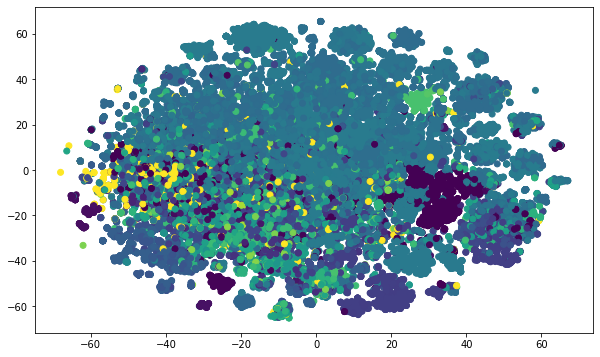

In [38]:
pylab.figure(figsize = (10, 6))
pylab.scatter(data_2d_tsne[:, 0], data_2d_tsne[:, 1], c = labels)

In [39]:
from sklearn.neighbors import KNeighborsClassifier

classifier = KNeighborsClassifier()
classifier.fit(data, labels)

KNeighborsClassifier()

In [40]:
from sklearn.metrics import classification_report

print(classification_report(classifier.predict(data), labels))

              precision    recall  f1-score   support

           0       0.91      0.79      0.84      2726
           1       0.75      0.48      0.58        44
           2       0.88      0.80      0.84       350
           3       0.84      0.77      0.80       120
           4       0.68      0.55      0.61       276
           6       0.52      0.33      0.40       101
           7       0.97      0.92      0.94       238
           9       0.98      0.92      0.95       111
          11       0.57      0.40      0.47        68
          12       0.70      0.63      0.66       204
          13       0.51      0.68      0.58        28
          19       0.68      0.57      0.62        88
          20       0.83      0.83      0.83        59
          24       0.54      0.71      0.62        52
          26       0.50      0.46      0.48        24
          27       0.66      0.76      0.70        33
          29       0.86      0.74      0.80       149
          30       0.69    

/home/web/workspace/kaggle/check_recognizer/venv/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/web/workspace/kaggle/check_recognizer/venv/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/web/workspace/kaggle/check_recognizer/venv/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, m

In [41]:
from keras.models import Sequential
from keras.layers import Dense, Dropout


def my_model():
    model = Sequential()
    model.add(Dense(512, input_dim=300, activation='relu'))
    model.add(Dense(512, activation='relu'))
#     model.add(Dropout(.2))
    model.add(Dense(205, activation='softmax'))
    model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
    return model


In [42]:
data = [i if not isinstance(i, int) else np.array([0]*300) for i in sum_of_embds]

In [44]:
from tensorflow.python.keras.utils.np_utils import to_categorical

print(len(data))
print(len(labels))
to_categorical(labels)[0].shape

48225
48225


(205,)

In [45]:
model = my_model()
model.fit(np.array(data), to_categorical(labels), batch_size=16, epochs=100, verbose=2, validation_split=0.2)


Epoch 1/100
2412/2412 - 8s - loss: 1.5968 - accuracy: 0.6007 - val_loss: 1.7736 - val_accuracy: 0.5643
Epoch 2/100
2412/2412 - 8s - loss: 1.0272 - accuracy: 0.7243 - val_loss: 1.7310 - val_accuracy: 0.5824
Epoch 3/100
2412/2412 - 8s - loss: 0.7951 - accuracy: 0.7786 - val_loss: 1.6028 - val_accuracy: 0.6120
Epoch 4/100
2412/2412 - 8s - loss: 0.6282 - accuracy: 0.8183 - val_loss: 1.6503 - val_accuracy: 0.6207
Epoch 5/100
2412/2412 - 7s - loss: 0.4855 - accuracy: 0.8540 - val_loss: 1.8714 - val_accuracy: 0.6162
Epoch 6/100
2412/2412 - 8s - loss: 0.3890 - accuracy: 0.8834 - val_loss: 2.0179 - val_accuracy: 0.6163
Epoch 7/100
2412/2412 - 8s - loss: 0.3197 - accuracy: 0.9019 - val_loss: 2.1423 - val_accuracy: 0.6275
Epoch 8/100
2412/2412 - 8s - loss: 0.2618 - accuracy: 0.9194 - val_loss: 2.2790 - val_accuracy: 0.6169
Epoch 9/100
2412/2412 - 8s - loss: 0.2350 - accuracy: 0.9294 - val_loss: 2.4130 - val_accuracy: 0.6206
Epoch 10/100
2412/2412 - 8s - loss: 0.2180 - accuracy: 0.9330 - val_loss:

Epoch 80/100
2412/2412 - 8s - loss: 0.1037 - accuracy: 0.9773 - val_loss: 12.1136 - val_accuracy: 0.6182
Epoch 81/100
2412/2412 - 8s - loss: 0.1224 - accuracy: 0.9756 - val_loss: 13.2334 - val_accuracy: 0.6188
Epoch 82/100
2412/2412 - 8s - loss: 0.1067 - accuracy: 0.9767 - val_loss: 13.7936 - val_accuracy: 0.6181
Epoch 83/100
2412/2412 - 8s - loss: 0.1133 - accuracy: 0.9770 - val_loss: 12.9147 - val_accuracy: 0.6158
Epoch 84/100
2412/2412 - 8s - loss: 0.1156 - accuracy: 0.9774 - val_loss: 13.4297 - val_accuracy: 0.6202
Epoch 85/100
2412/2412 - 8s - loss: 0.1156 - accuracy: 0.9767 - val_loss: 13.1187 - val_accuracy: 0.6125
Epoch 86/100
2412/2412 - 8s - loss: 0.1189 - accuracy: 0.9776 - val_loss: 14.5998 - val_accuracy: 0.6056
Epoch 87/100
2412/2412 - 8s - loss: 0.1176 - accuracy: 0.9777 - val_loss: 13.2626 - val_accuracy: 0.6071
Epoch 88/100
2412/2412 - 8s - loss: 0.1116 - accuracy: 0.9777 - val_loss: 14.1200 - val_accuracy: 0.6168
Epoch 89/100
2412/2412 - 8s - loss: 0.1136 - accuracy: 

In [46]:
## Добавляю к дескрипторам слов остальные переметры

In [47]:
receipt_dayofweeks = to_categorical(train["receipt_dayofweek"].tolist())
receipt_times = [int(time.split(':')[0])*60*60+int(time.split(':')[1])*60 for time in train["receipt_time"].tolist()]
item_quantitys = train["item_quantity"].tolist()
item_prices = train["item_price"].tolist()
item_nds_rates = to_categorical(train["item_nds_rate"].tolist())

In [49]:
print(len(receipt_dayofweeks[0]))
print(len(item_nds_rates[0]))

7
7


In [50]:
products = [d.tolist() for d in data]
receipt_dayofweeks = [i.tolist() for i in receipt_dayofweeks]
item_nds_rates = [i.tolist() for i in item_nds_rates]

In [51]:
full_data = []
for d in zip(products, receipt_dayofweeks, receipt_times, item_quantitys, item_prices, item_nds_rates):
    new_vec = []
    for e in d:
        if isinstance(e, list):
            new_vec += e
        else:
            new_vec.append(e)
    full_data.append(new_vec)
full_data = np.array(full_data)


In [52]:
len(full_data[0])

317

In [53]:
## Обучение на полных данных

In [54]:
classifier = KNeighborsClassifier()
classifier.fit(full_data, labels)

KNeighborsClassifier()

In [55]:
print(classification_report(classifier.predict(full_data), labels))

              precision    recall  f1-score   support

           0       0.78      0.35      0.49      5219
           1       0.46      0.14      0.21        93
           2       0.51      0.24      0.33       670
           3       0.54      0.18      0.27       321
           4       0.57      0.26      0.36       487
           6       0.61      0.35      0.44       112
           7       0.50      0.55      0.52       202
           9       0.35      0.64      0.45        56
          11       0.53      0.26      0.34        98
          12       0.55      0.22      0.31       455
          13       0.43      0.29      0.34        56
          19       0.53      0.28      0.37       138
          20       0.41      0.24      0.30        99
          24       0.50      0.43      0.46        79
          26       0.59      0.32      0.41        41
          27       0.34      0.36      0.35        36
          29       0.57      0.46      0.51       160
          30       0.49    

/home/web/workspace/kaggle/check_recognizer/venv/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/web/workspace/kaggle/check_recognizer/venv/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/web/workspace/kaggle/check_recognizer/venv/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, m

In [ ]:
print(len(receipt_dayofweeks[0]))
print(len(item_nds_rates[0]))

In [ ]:
products = [d.tolist() for d in data]
receipt_dayofweeks = [i.tolist() for i in receipt_dayofweeks]
item_nds_rates = [i.tolist() for i in item_nds_rates]

In [ ]:
full_data = []
for d in zip(products, receipt_dayofweeks, receipt_times, item_quantitys, item_prices, item_nds_rates):
    new_vec = []
    for e in d:
        if isinstance(e, list):
            new_vec += e
        else:
            new_vec.append(e)
    full_data.append(new_vec)
full_data = np.array(full_data)


In [ ]:
len(full_data[0])

In [ ]:
## Обучение на полных данных

In [ ]:
classifier = KNeighborsClassifier()
classifier.fit(full_data, labels)

In [ ]:
print(classification_report(classifier.predict(full_data), labels))